# Usage of Costs Prediction Model - No Missing Data / Gaps filled out

# Load Libraries

In [72]:
# Cargar librerias
from __future__ import absolute_import, division, print_function, unicode_literals
import os
from datetime import datetime
import datetime as dt  # Used to manage dates
from dateutil.relativedelta import relativedelta
import warnings                   # To ignore the warnings warnings.filterwarnings("ignore")
import requests
from math import sqrt, log, exp
import itertools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.pylab import rcParams 
import matplotlib as mpl
import seaborn as sns

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_squared_log_error
from sklearn.decomposition import PCA
from sklearn import preprocessing

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from xgboost import XGBRegressor, plot_importance 


from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.metrics import classification_report

from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor 
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.svm import LinearSVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge, RidgeCV

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer

import scipy.stats as stats 
from scipy.stats import norm, skew
import scikitplot as skplt

import plotly.offline as py
from plotly import graph_objs as go
from plotly import figure_factory as ff
import plotly.express as px
from plotly.subplots import make_subplots

warnings.filterwarnings("ignore")
warnings.simplefilter("ignore", DeprecationWarning)
warnings.simplefilter("ignore", FutureWarning, )

%matplotlib inline
pd.plotting.register_matplotlib_converters()
pd.options.display.float_format = '{:.4f}'.format
rcParams.update({'figure.autolayout': True, 'figure.figsize':(12,8),'axes.titlesize':14})

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('max_info_rows', 100)

# to make this notebook's output identical at every run
np.random.seed(42)

# Function Definitions

In [73]:
def save_data(df, file_name):
    # Write data to CSV File
    df.to_csv(path_or_buf=file_name, sep=',',index=False, encoding='utf-8')
    return

def read_data(file_name):
    df = pd.read_csv(file_name, sep=',', index_col=False, header='infer', float_precision=2 )
    return df

def draw_col_shape(df_feature,cols):
    # draw a bar graph with he number of members of a columns specify in field Cols
    
    # Dictionary for X Axis Labels
    dict_cols = { 'income':'Income', 'member_status':'Member Status','state_grouped': 'State', 'credit_ranges':'Credit Range',
                 'cancel_reason':'Cancel Reason','renew_method':'Renewal Method','sc_vehicle_manufacturer_name':'Vehicle Manufacturer',
                 'sc_vehicle_model_name':'Vehicle Model','race': 'Ethnic Group','home_owner': 'Home Owner','education':'Education Level', 
                 'dwelling_type': 'Dwelling Type', 'gender':'Gender','occupation_code':'Occupation', 'occupation_group':'Occupation Group',
                 'occupant_type': 'Occupant Type','mosaic_household':'Mosaic household','mosaic_global_household':'Global Mosaic',
                 'kcl_b_ind_mosaicsgrouping':'Mosaic Grouping', 'plus_indicator_description':'Membership Type',
                 'tenure':'Tenure Range', 'generation':'Generation', 'total_calls':'Total Breakdown Calls', 'aaa_mortgage':'Used Mortgage Service',
                  'aaa_credit_card':'Use Credit Card Service','aaa_deposit':'Use Deposit Service','aaa_travel':'Travel Services',
                 'aaa_home_equity':'Use Home Equity Service', 'aaa_financial_service':'Use Financial Service', 
                 'aaa_auto_insurance':'Use Insurance Service', 'vehicle':'Vehicle','total_member_cost':'Total Member Avg. Costs',
                 'no_members':'Total Members with Household', 'aaa_id_theft':'ID Theft Service', 'use_road_side':'Use Roadside'
                }


    # number of members per state

    for col in cols:
        counts = df_feature[col].value_counts()
        sns.set(style="whitegrid")
        plt.axhline(0, color="k", clip_on=False)
        plt.ylabel("# of Classes",fontsize=14, fontweight='bold')
        plt.xlabel("Classes", fontsize=14, fontweight='bold')
        plt.title('Total  Number of Classes',loc='center', fontdict={'fontsize':14, 'fontweight':'bold'})
        sns.barplot(counts.index, counts.values)
        plt.xticks(
            rotation=45, 
            horizontalalignment='right',
            fontweight='light',
            fontsize='large')
        i = 0
        for v in list(counts.index):
            plt.text(i-.25, counts.values[v], str(counts.values[v]), color='blue', fontweight='bold')
            i +=1
        plt.show()
        counts = pd.DataFrame(df_feature[col].value_counts().nlargest(15), index=None)
        counts.reset_index(inplace=True)
        counts.rename(columns={"index": dict_cols[col], col: "# of Classes"}, inplace=True)
        fig = ff.create_table(counts, height_constant=30, index=False)
        py.iplot(fig)
        return

def cross_entropy(predictions, targets, epsilon=1e-10):
    # To calculate the cross Entropy Loss to validate model performance
    # Cross Entropy Loss
        # Cross-entropy loss, or log loss, measures the performance of a classification model 
        # whose output is a probability value between 0 and 1. #
        # Cross-entropy loss increases as the predicted probability diverges from the actual label. 
        # So predicting a probability of .012 when the actual observation label is 1 would be bad and 
        # result in a high loss value. # A perfect model would have a log loss of 0.
        
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce_loss = -np.sum(np.sum(targets * np.log(predictions + 1e-5)))/N
    return ce_loss

def road_side_usage(calls):
    if calls > 0: return 1
    elif calls == 0: return 0
    else: return np.nan


# Load data from consolidate file by household key and transacton file 

In [74]:
# Load data from the View create using Capstone AAA - EDA .ipynb
df_household = pd.read_csv('household_view_no_gaps.csv', parse_dates=True,infer_datetime_format=True)
df_transaction = pd.read_csv('capstone_aaa_featured_no_gaps.csv', 
                             parse_dates=['sc_date', 'birth_date_mmddyyyy', 'call_status_recv_date',
                                         'date_of_birth','active_expiration_date', 'cancel_date',
                                         'join_aaa_date', 'join_club_date', 'reinstate_date'
                                         ], 
                             infer_datetime_format=True)
df_original_house_hold = df_household.copy()
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
var_to_predict = ['total_cost']
var_to_predict_title = 'Total Costs Forecast - No Date Gaps'
var_to_predict_save = 'totc_no_gap'
test_size = 0.5
# Create roadside usage
df_household['use_road_side'] = df_household['total_calls'].apply(lambda x:road_side_usage(x))
df_household.consumer_score = np.where(df_household.consumer_score!= np.nan, 1/df_household.consumer_score, 
                                    df_household.consumer_score)
df_household.consumer_score = np.where(df_household.consumer_score== np.nan, df_household.consumer_score.mean(), 
                                    df_household.consumer_score)
df_household.consumer_score = np.where(~(df_household.consumer_score > 0), df_household.consumer_score.mean(), 
                                           df_household.consumer_score)
# Remove members with status CANCELLED
df_household = df_household[df_household.member_status!='CANCELLED']
df_transaction.call_status_recv_date = df_transaction.sc_date

In [75]:
df_transaction.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26006 entries, 0 to 26005
Data columns (total 167 columns):
id                                26006 non-null int64
individual_key                    26006 non-null int64
household_key                     26006 non-null int64
member_flag                       26006 non-null int64
city                              26006 non-null object
state_grouped                     26006 non-null object
zip5                              26006 non-null int64
zip9                              26006 non-null int64
fsv_cmsi_flag                     26006 non-null int64
fsv_credit_card_flag              26006 non-null int64
fsv_deposit_program_flag          26006 non-null int64
fsv_home_equity_flag              26006 non-null int64
fsv_id_theft_flag                 26006 non-null int64
fsv_mortgage_flag                 26006 non-null int64
ins_client_flag                   26006 non-null int64
trv_globalware_flag               26006 non-null int64
number_o

# Analysis the Total cost series

In [76]:
df_household.head()

,membership_id,household_key,income,member_status,state_grouped,credit_ranges,cancel_reason,renew_method,plus_indicator_description,zip,sc_vehicle_manufacturer_name,sc_vehicle_model_name,race,home_owner,education,dwelling_type,gender,occupation_code,occupation_group,occupant_type,mosaic_household,mosaic_global_household,kcl_b_ind_mosaicsgrouping,generation,tenure,aaa_no_tenure,aaa_member_tenure_years,aaa_mean_age,length_of_residence,aaa_mortgage,aaa_credit_card,aaa_deposit,aaa_home_equity,aaa_financial_service,aaa_auto_insurance,aaa_id_theft,aaa_motorcycle_indicator,aaa_travel,aaa_mean_child,aaa_mean_total_cost,aaa_no_race,aaa_no_home_owner,aaa_no_education,aaa_no_income,aaa_no_dwelling_type,aaa_no_credit_ranges,aaa_no_gender,aaa_no_language,aaa_no_reason_joined,aaa_cancel_reason,aaa_no_mosaic_household,aaa_no_mosaic_global_household,aaa_no_kcl_b_ind_mosaicsgrouping,aaa_no_occupation_code,aaa_no_occupation_group,aaa_no_occupant_type,aaa_no_plus_indicator_description,aaa_no_generation,total_calls_year_1,total_calls_year_2,total_calls_year_3,total_member_cost_1,total_member_cost_2,total_member_cost_3,basic_cost,plus_cost,premier_cost,mean_basic_cost,mean_plus_cost,mean_premier_cost,total_calls,total_member_cost,mean_total_member_cost,total_tow_miles,mean_tow_miles,vehicle,total_cost,mean_total_cost,total_members_in_household,total_calls_veh,total_cost_veh,total_member_cost_veh,mean_total_calls_veh,mean_total_cost_veh,mean_total_member_cost_veh,consumer_score,use_road_side
0,153,4500791,"30-39,999",ACTIVE,RI,600-649,UNKNOWN,AUTO RENEW,BASIC MEMBERSHIP,2893,TOYOTA,CAMRY,CAUCASION / WHITE - ENGLISH,HOME OWNER,SOME COLLEGE,SMALL OR LARGE MULTI-FAMILY W/APT NUMBER,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN,SENIOR DISCOUNTS,LOW INCOME ELDERS,GOLDEN YEAR GUARDIANS,POST-WAR (< 1948),+40 YEARS,0,49,97.0000,15.0000,0,1,0,0,0,0,0,0.0000,0,2.0000,34.7917,2.0000,0.0000,1.0000,8.0000,2.0000,5.0000,nan,0.0000,nan,nan,11.0000,7.0000,3.0000,nan,nan,nan,0.0000,0.0000,0.0000,0.0000,24.0000,0.0000,0.0000,780.0000,417.5000,0.0000,0.0000,34.7917,0.0000,0.0000,24.0000,780.0000,65.0000,0.8000,0.0667,TOYOTA CAMRY,417.5000,34.7917,1,7477.0000,142122.6600,387594.0700,2.4750,47.0449,128.2999,0.0137,1
2,163,11622991,"50-59,999",ACTIVE,RI,750-799,UNKNOWN,AUTO RENEW,BASIC MEMBERSHIP,2889,SUBARU,BRZ,HISPANIC - HISPANIC ORIGIN,HOME OWNER,UNKNOWN,SFDU,UNKNOWN,UNKNOWN,UNKNOWN,UNKNOWN,NO PLACE LIKE HOME,ROUTINE SERVICE WORKERS,THRIVING BOOMERS,MILLENIALS (1981 - 1993),BETWEEN 1 & 5 YEARS,6,59,47.3636,8.6364,0,0,0,0,0,0,0,1.0000,0,1.0000,39.5318,6.0000,0.0000,2.0000,4.0000,0.0000,1.0000,nan,0.0000,nan,1.0000,3.0000,3.0000,4.0000,nan,nan,nan,2.0000,3.0000,4.0000,8.0000,0.0000,235.4000,470.8000,0.0000,434.8500,0.0000,0.0000,39.5318,0.0000,0.0000,12.0000,706.2000,64.2000,0.0000,0.0000,SUBARU BRZ,434.8500,39.5318,4,1384.0000,29447.1100,67930.8300,2.2431,47.7263,110.0986,0.0123,1
3,182,579810,"50-59,999",ACTIVE,RI,650-699,UNKNOWN,NOTICE,BASIC MEMBERSHIP,2863,INFINITI,QX56,CAUCASION / WHITE - EUROPEAN,HOME OWNER,SOME COLLEGE,SFDU,MALE,RETIRED,RETIRED - KNOWN,UNKNOWN,TOWN ELDERS,COMFORTABLE RETIREMENT,GOLDEN YEAR GUARDIANS,POST-WAR (< 1948),+40 YEARS,0,59,83.0000,15.0000,0,0,0,0,0,1,0,0.0000,0,1.0000,28.0000,1.0000,0.0000,1.0000,4.0000,0.0000,3.0000,2.0000,0.0000,nan,nan,6.0000,1.0000,3.0000,1.0000,3.0000,nan,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,28.0000,0.0000,0.0000,28.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,INFINITI QX56,28.0000,28.0000,1,466.0000,5980.6000,26251.1500,3.7581,48.2306,211.7028,0.0143,0
4,188,7187017,"100-149,999",PENDING,RI,650-699,UNKNOWN,NOTICE,BASIC MEMBERSHIP,2888,VOLKSWAGEN,TIGUAN,CAUCASION / WHITE - EUROPEAN,HOME OWNER,UNKNOWN,SFDU,FEMALE,UNKNOWN,OFFICE ADMINISTRATION - INFERRED,UNKNOWN,AGING IN PLACE,COMFORTABLE RETIREMENT,AUTUMN YEARS,BABY BOOMERS (1948 - 1968),BETWEEN 21 & 30 YEARS,2,49,60.8750,15.0000,0,0,0,0,0,0,0,1.0000,1,2.0000,53.7313,1.0000,0.0000,nan,1.0000,0.0000,3.0000,1.0000,0.0000,nan,nan,1.0000,1.0000,1.0000,nan,

In [77]:
df_household[var_to_predict[0]].describe()

count   2961.0000
mean     217.5110
std      276.4544
min        0.0000
25%       32.5000
50%      123.0000
75%      293.0000
max     2576.7000
Name: total_cost, dtype: float64


 mu = 217.51 and sigma = 276.41



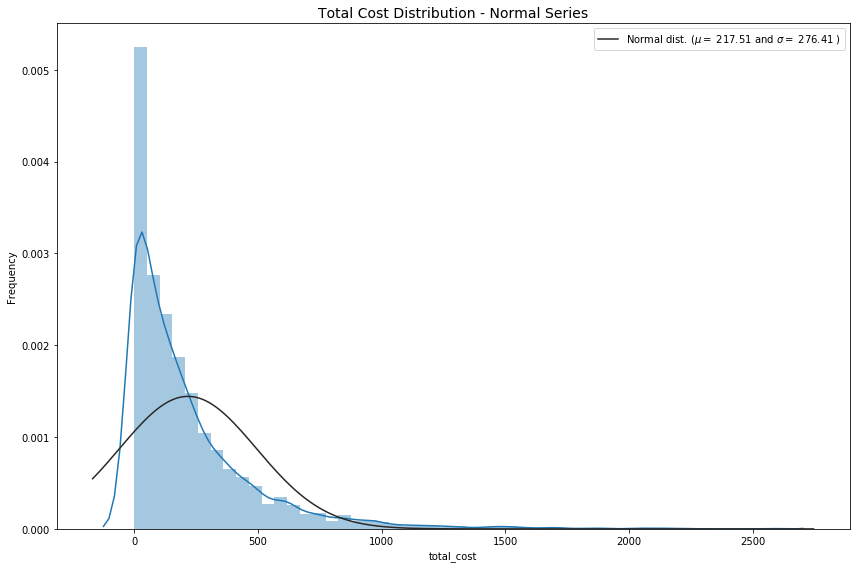

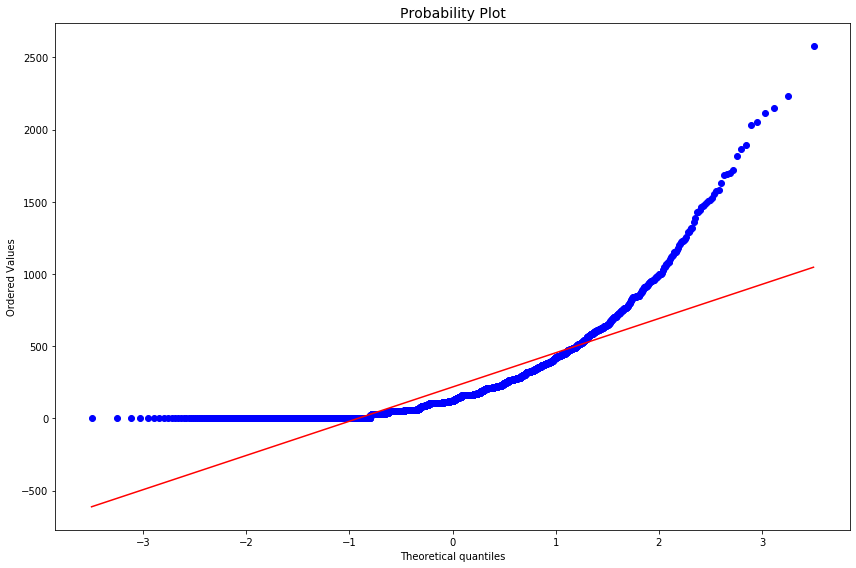

In [88]:
df = pd.DataFrame(df_household,columns=var_to_predict)

sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Normal Series')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 4.10 and sigma = 2.28



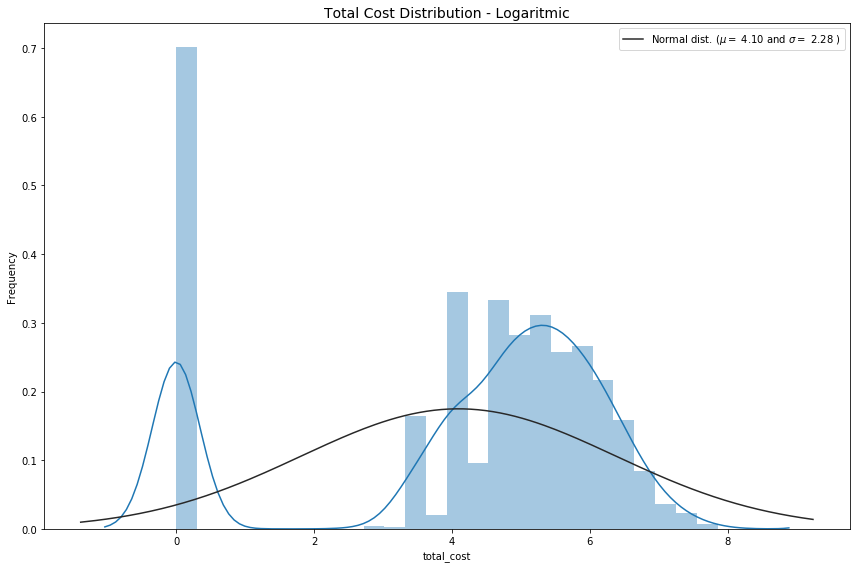

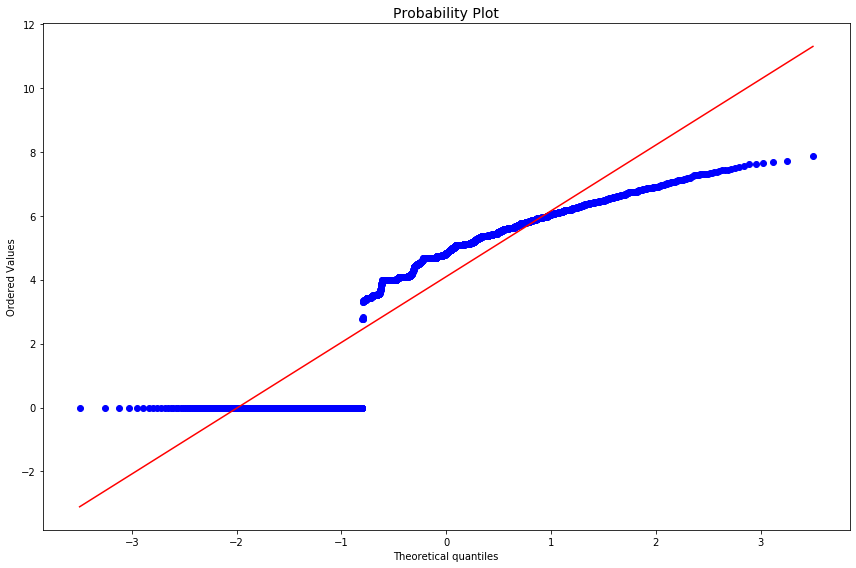

In [89]:
# Logaritmic
df = pd.DataFrame(df_household,columns=var_to_predict)

df[var_to_predict[0]] = np.log1p(df[var_to_predict[0]])

sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Logaritmic')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.00 and sigma = 1.00



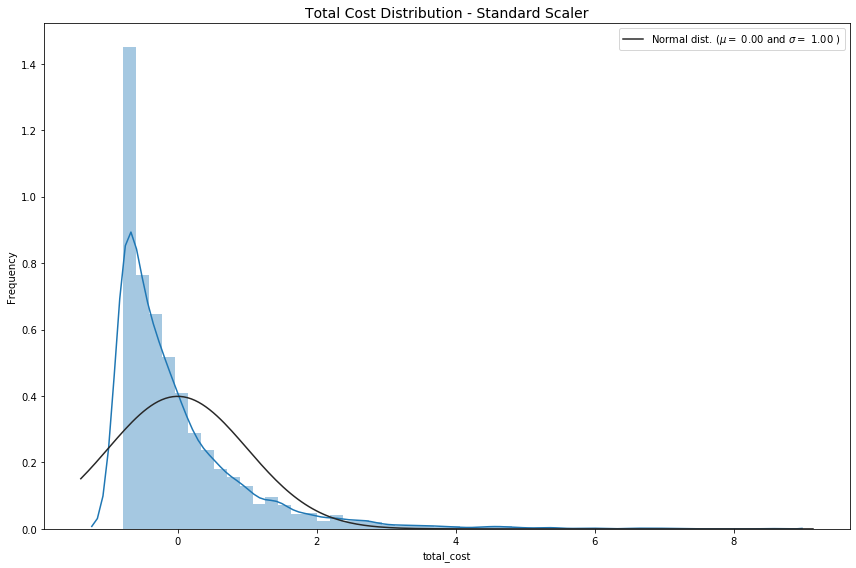

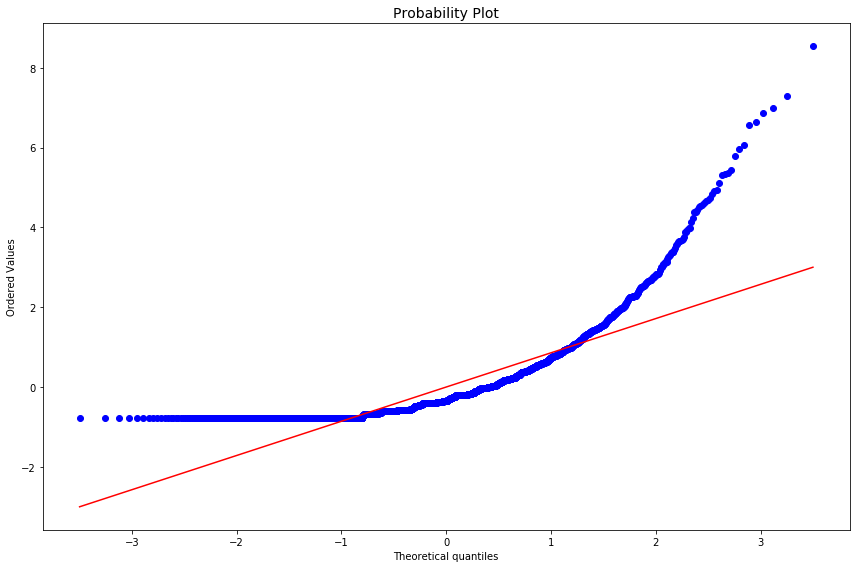

In [90]:
# Standard Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Standard Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.08 and sigma = 0.11



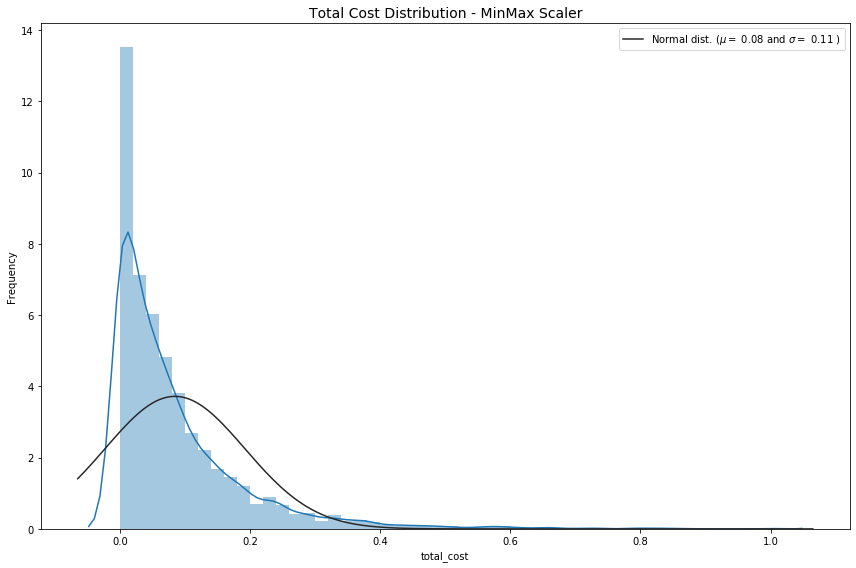

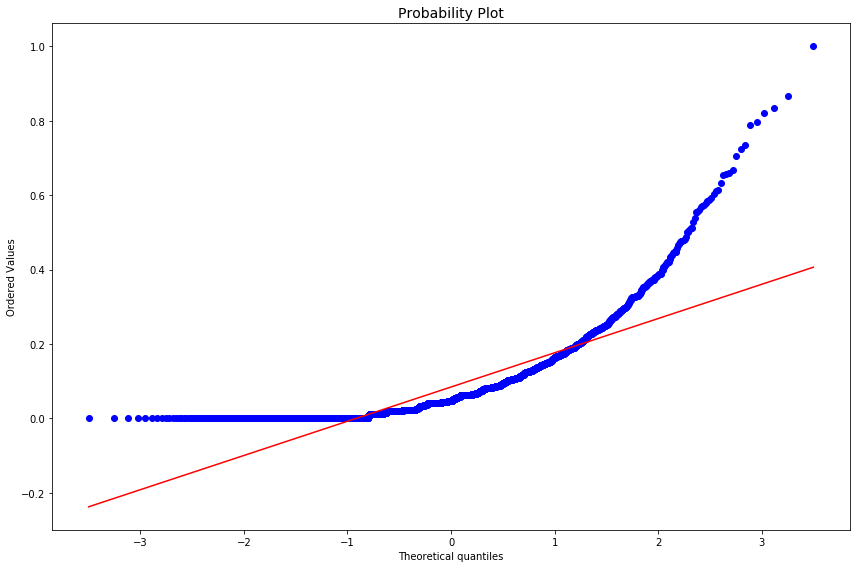

In [91]:
# MinMax Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - MinMax Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.36 and sigma = 1.06



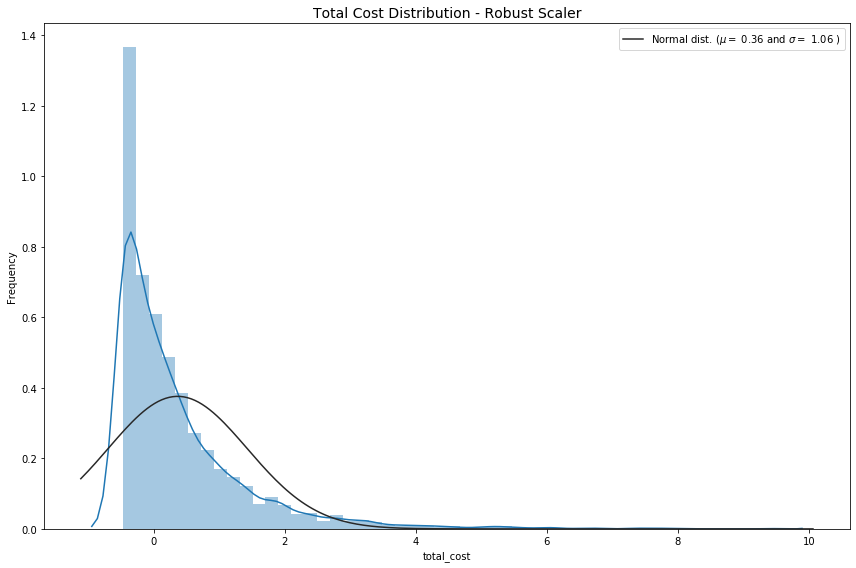

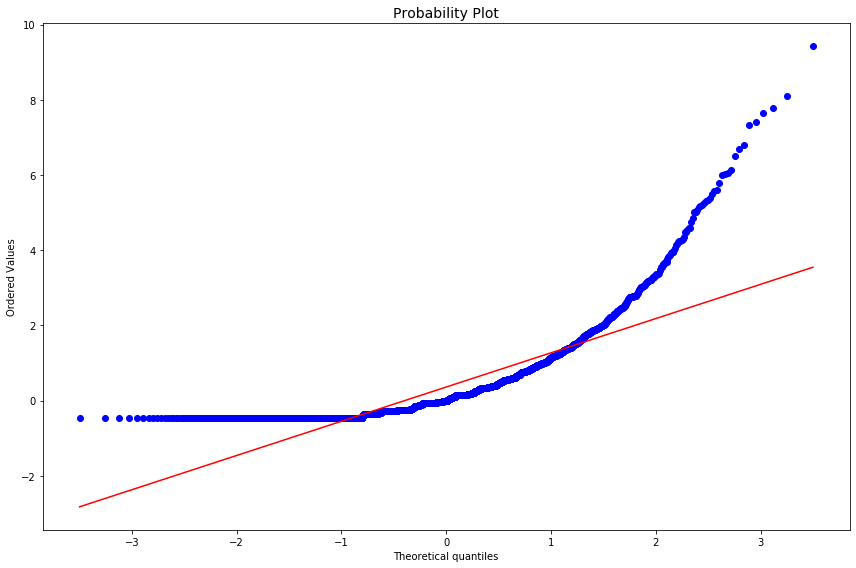

In [92]:
# Robust Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = RobustScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm)

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Robust Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.00 and sigma = 1.00



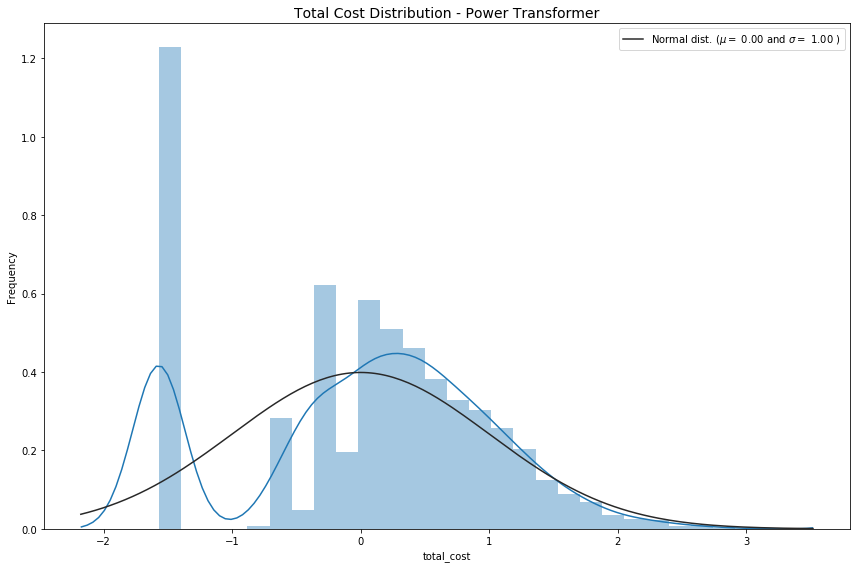

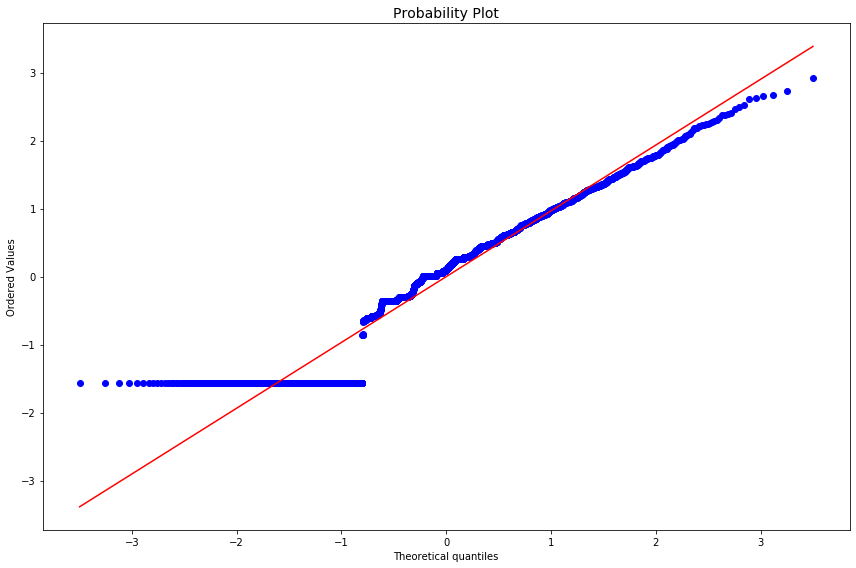

In [93]:
# Power Transformer

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = PowerTransformer()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Power Transformer')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.79 and sigma = 0.41



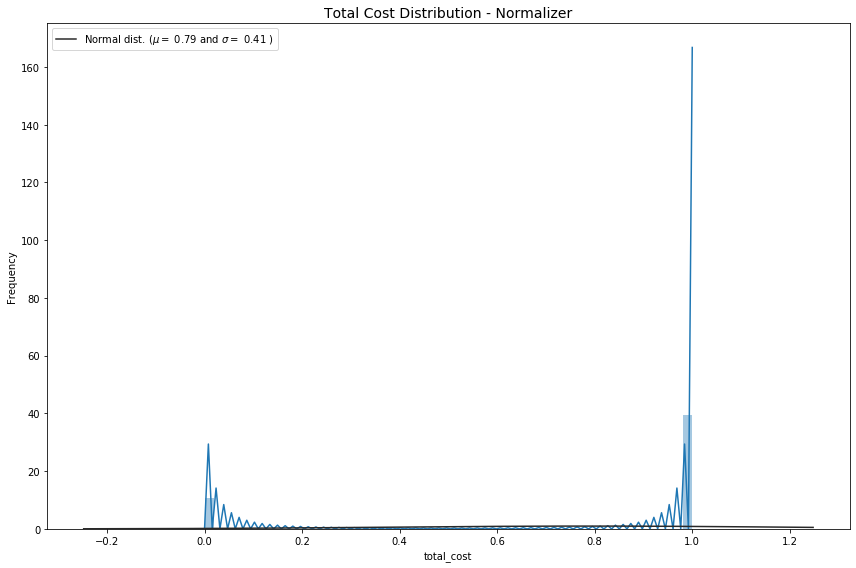

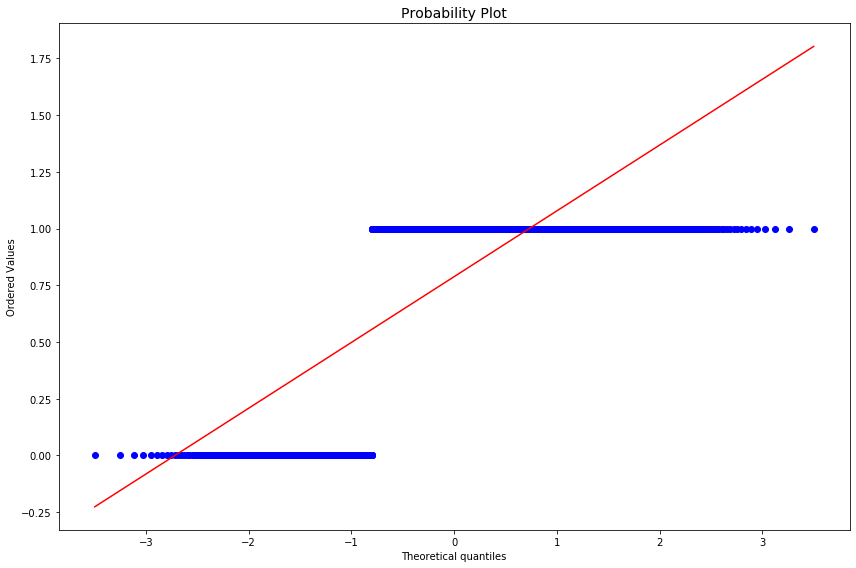

In [94]:
# Normalizer Transformer

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = Normalizer()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Normalizer')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.08 and sigma = 0.11



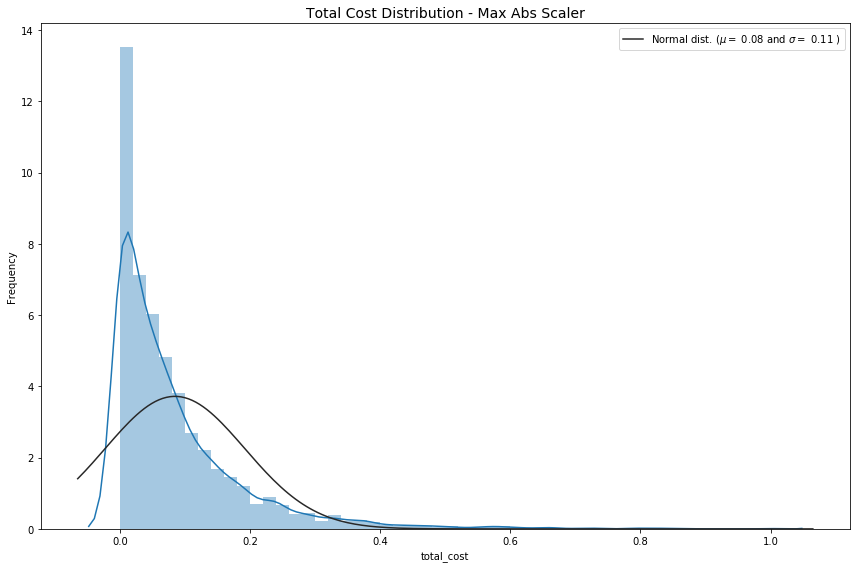

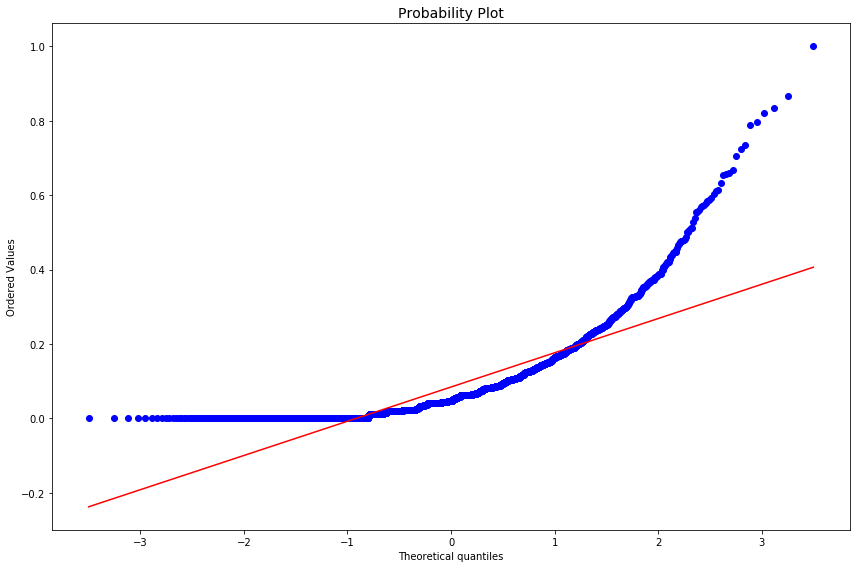

In [95]:
# Max Abs transformer

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = MaxAbsScaler()
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Max Abs Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()


 mu = 0.48 and sigma = 0.32



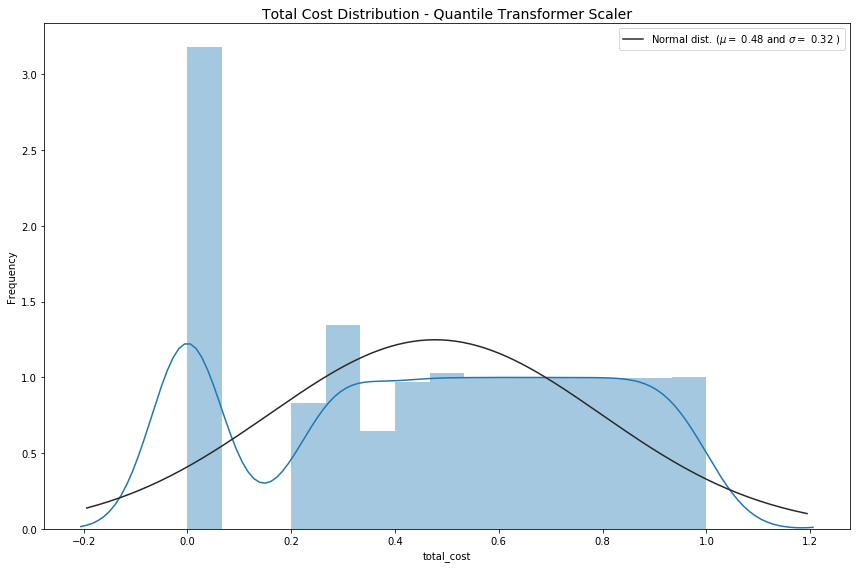

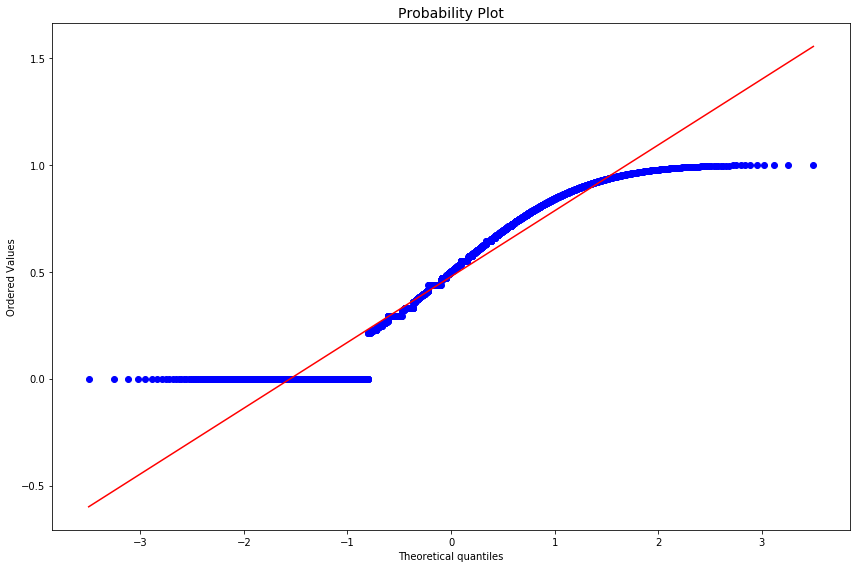

In [78]:
# Quantile Transformer Scaler

df = pd.DataFrame(df_household,columns=var_to_predict)
scaler = QuantileTransformer(1000,'uniform')
scaled_df = scaler.fit_transform(df)
scaled_df = pd.DataFrame(scaled_df, columns=df.columns)

df = scaled_df.copy()
sns.distplot(df[var_to_predict[0]] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df[var_to_predict[0]])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Total Cost Distribution - Quantile Transformer Scaler')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df[var_to_predict[0]], plot=plt)
plt.show()

# Cars that are most likely to break down 
https://247wallst.com/special-report/2019/12/12/these-new-cars-are-most-likely-to-break-down/2/

# Top Car 35 Car brand according to consumer reports
https://www.autonews.com/retail/subaru-reaches-top-consumer-reports-rankings-tesla-falters


In [79]:
df_group_veh_manuf = df_transaction.groupby(by='sc_vehicle_manufacturer_name').agg(({'total_calls':sum, 
                                                                                     'total_cost' :['sum','mean']
                                                                                    }))

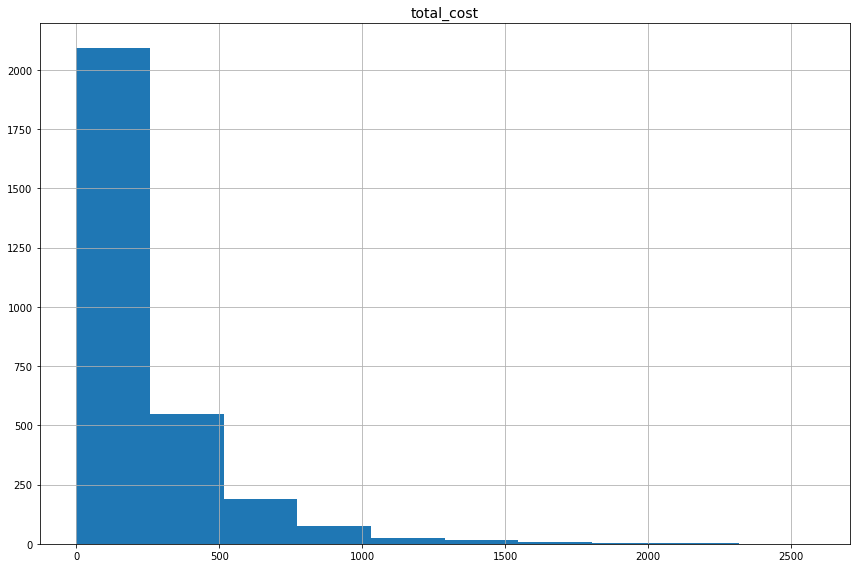

In [80]:
df_household[var_to_predict].hist(figsize=(12,8))
plt.show()

In [4]:
# Gender
fig = px.scatter(df_household, x=var_to_predict[0], y="total_calls", marginal_x="box", 
                 marginal_y="box", trendline="ols", facet_col="gender",color="gender",
                 color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl"
                )
fig.show()


In [100]:
# Gender / tenure
fig = px.scatter(df_household, x=var_to_predict[0], y="total_calls", marginal_x="box", 
                 marginal_y="box", trendline="ols", color="tenure",facet_col="gender",
                 color_continuous_scale=px.colors.sequential.Viridis, render_mode="webgl"
                )
fig.show()


In [101]:
df_transaction.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26006 entries, 0 to 26005
Data columns (total 167 columns):
id                                int64
individual_key                    int64
household_key                     int64
member_flag                       int64
city                              object
state_grouped                     object
zip5                              int64
zip9                              int64
fsv_cmsi_flag                     int64
fsv_credit_card_flag              int64
fsv_deposit_program_flag          int64
fsv_home_equity_flag              int64
fsv_id_theft_flag                 int64
fsv_mortgage_flag                 int64
ins_client_flag                   int64
trv_globalware_flag               int64
number_of_children                object
responded_to_catalog              object
race                              object
length_of_residence               int64
mail_responder                    object
home_owner                        object
inc

In [102]:
df_household.groupby(by=var_to_predict[0]).mean()

,membership_id,household_key,zip,aaa_no_tenure,aaa_member_tenure_years,aaa_mean_age,length_of_residence,aaa_mortgage,aaa_credit_card,aaa_deposit,aaa_home_equity,aaa_financial_service,aaa_auto_insurance,aaa_id_theft,aaa_motorcycle_indicator,aaa_travel,aaa_mean_child,aaa_mean_total_cost,aaa_no_race,aaa_no_home_owner,aaa_no_education,aaa_no_income,aaa_no_dwelling_type,aaa_no_credit_ranges,aaa_no_gender,aaa_no_language,aaa_no_reason_joined,aaa_cancel_reason,aaa_no_mosaic_household,aaa_no_mosaic_global_household,aaa_no_kcl_b_ind_mosaicsgrouping,aaa_no_occupation_code,aaa_no_occupation_group,aaa_no_occupant_type,aaa_no_plus_indicator_description,aaa_no_generation,total_calls_year_1,total_calls_year_2,total_calls_year_3,total_member_cost_1,total_member_cost_2,total_member_cost_3,basic_cost,plus_cost,premier_cost,mean_basic_cost,mean_plus_cost,mean_premier_cost,total_calls,total_member_cost,mean_total_member_cost,total_tow_miles,mean_tow_miles,mean_total_cost,total_members_in_household,total_calls_veh,total_cost_veh,total_member_cost_veh,mean_total_calls_veh,mean_total_cost_veh,mean_total_member_cost_veh,consumer_score,use_road_side
total_cost,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0.0000,117960.8102,14731824.0925,2885.5407,0.9617,46.8628,74.7576,7.7303,0.0526,0.1244,0.0128,0.0016,0.0526,0.2775,0.0622,0.4762,0.1738,1.5104,0.0000,2.4382,0.0595,1.9919,4.7224,0.4021,2.4712,1.5214,0.1012,3.2000,3.6390,8.4638,2.7766,3.8681,7.1593,4.9095,1.3158,1.1379,0.6318,0.0239,0.1675,0.3190,0.9114,8.5742,15.4026,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.5104,24.8882,14.3890,0.0000,0.0000,0.0000,1.9665,1281.3254,2204.9747,65875.6810,0.2703,1.9148,13.9427,0.0149,0.3206
15.0000,377560.6667,6438447.3333,4076.0000,0.3333,54.0000,68.4445,7.2222,0.0000,0.3333,0.0000,0.0000,0.0000,0.0000,0.0000,0.6667,0.0000,1.3333,5.4167,3.3333,0.0000,2.0000,5.6667,1.3333,2.0000,2.0000,0.0000,nan,5.0000,19.3333,5.0000,9.0000,9.0000,9.0000,1.0000,0.6667,2.3333,0.0000,0.0000,0.6667,0.0000,0.0000,35.3333,15.0000,0.0000,0.0000,5.4167,0.0000,0.0000,0.6667,35.3333,17.6667,0.0000,0.0000,5.4167,2.6667,3091.0000,57176.5400,164488.2500,2.5563,46.2662,134.4507,0.0149,0.3333
16.2500,16706.0000,2128311.0000,2864.0000,4.0000,46.0000,59.0000,3.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,1.0000,3.2500,2.0000,0.0000,nan,1.0000,0.0000,1.0000,1.0000,0.0000,nan,6.0000,8.0000,2.0000,2.0000,6.0000,4.0000,nan,0.0000,3.0000,2.0000,2.0000,0.0000,156.5400,62.5000,0.0000,16.2500,0.0000,0.0000,3.2500,0.0000,0.0000,4.0000,219.0400,43.8080,0.0000,0.0000,3.2500,5.0000,3543.0000,56658.3900,189037.4300,2.7942,44.6833,149.0831,0.0164,1.0000
26.0000,80846.0000,37538719.0000,2809.0000,2.0000,23.0000,57.0000,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,13.0000,2.0000,0.0000,1.0000,11.0000,0.0000,1.0000,nan,0.0000,nan,nan,26.0000,2.0000,7.0000,nan,nan,nan,0.0000,4.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,26.0000,0.0000,0.0000,13.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,13.0000,2.0000,1211.0000,53.0000,62130.2300,0.1645,0.0072,8.4416,0.0149,0.0000
26.5000,56190.0000,7721834.0000,2806.0000,1.0000,31.0000,52.0000,12.3333,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,2.0000,8.8333,1.0000,0.0000,1.0000,13.0000,0.0000,4.0000,2.0000,0.0000,nan,nan,18.0000,2.0000,7.0000,26.0000,16.0000,nan,0.0000,3.0000,0.0000,0.0000,1.0000,0.0000,0.0000,58.8500,26.5000,0.0000,0.0000,8.8333,0.0000,0.0000,1.0000,58.8500,19.6167,0.0000,0.0000,8.8333,3.0000,4897.0000,94941.1100,267005.0700,2.4473,47.4468,133.4358,0.0143,1.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2054.1300,2829.0000,62322934.0000,2919.0000,0.0000,47.0000,66.8235,0.9474,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,1.0000,1.0000,2.0000,108.1

In [72]:
fig = px.scatter(df_household, x=var_to_predict[0], y="total_calls", size="total_calls", color="generation",
           hover_name="plus_indicator_description", log_x=True, size_max=60)
fig.show()

In [6]:
fig = px.bar(df_household, x='income', y=var_to_predict[0],
             hover_data=["plus_indicator_description", 'gender'], color="plus_indicator_description",
             labels={'total_calls':'Total Roadside Calls'}, height=600)
fig.show()

In [105]:
# Number of members in household key
df_household.total_members_in_household.value_counts()

2     1039
1      723
3      601
4      366
5      158
6       44
7       26
8        2
15       1
9        1
Name: total_members_in_household, dtype: int64

In [106]:
# Income
df_household.income.value_counts()

UNKNOWN          717
100-149,999      489
90-99,999        443
50-59,999        199
70-79,999        195
40-49,999        143
10-19,999        129
175 - 199,999    109
60-69,999        101
30-39,999         94
150 - 174,999     89
20-29,999         78
200 - 249,999     69
250K+             68
UNDER 10K         36
80-89,999          2
Name: income, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavvily on income. 
Will consolidate income in three categories: 
    * a) under 10k - 39999: Under 39.999
    * b) 40 - 99,999 : 40 - 99,999
    * c) 100k and above : 100+
    

In [107]:
group1 = ['UNDER 10K', '10-19,999','20-29,999', '30-39,999']
group2 = ['40-49,999', '50-59,999', '60-69,999', '70-79,999', '80-89,999', '90-99,999']
group3 = ['100-149,999', '150 - 174,999', '175 - 199,999', '200 - 249,999', '250K+' ]
for i in group1:
    df_household['income']=np.where(df_household['income']== i, 'UNDER 39,999', df_household['income'])
for i in group2:
    df_household['income']=np.where(df_household['income']== i, '40 - 99,999', df_household['income'])
for i in group3:
    df_household['income']=np.where(df_household['income']== i, '100k+', df_household['income'])


In [108]:
# Tenures
df_household.tenure.value_counts()

+40 YEARS                1807
BETWEEN 21 & 30 YEARS     253
BETWEEN 31 & 40 YEARS     236
BETWEEN 11 & 15 YEARS     208
BETWEEN 6 & 10 YEARS      186
BETWEEN 16 & 20 YEARS     171
BETWEEN 1 & 5 YEARS        93
< 1 YEAR                    7
Name: tenure, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavily on tenures. Will consolidate tenure in three categories: 
    * a) above 40 years  
    * b) between 21 - 40 
    * c) Less 21 


In [109]:
group1 = ['BETWEEN 6 & 10 YEARS', 'BETWEEN 11 & 15 YEARS', 
          'BETWEEN 16 & 20 YEARS', 'BETWEEN 1 & 5 YEARS', '< 1 YEAR']
group2 = ['BETWEEN 31 & 40 YEARS', 'BETWEEN 21 & 30 YEARS']
group3 = ['+40 YEARS']
for i in group1:
    df_household['tenure']=np.where(df_household['tenure']== i, 'UNDER 20 YEARS', df_household['tenure'])
for i in group2:
    df_household['tenure']=np.where(df_household['tenure']== i, 'BETWEEN 21 & 40 YEARS', df_household['tenure'])
for i in group3:
    df_household['tenure']=np.where(df_household['tenure']== i, '+40 YEARS', df_household['tenure'])


In [110]:
# Credit Ranges
df_household.credit_ranges.value_counts()

UNKNOWN       794
750-799       790
700-749       474
800+          352
650-699       337
600-649       154
550-599        30
500-549        28
499 & LESS      2
Name: credit_ranges, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavily on credit_ranges. Will consolidate tenure in three categories: 
    * a) above 800 years 
    * b) between 700 - 799 
    * c) Below 700

In [111]:
group1 = ['499 & LESS', '500-549','550-599','600-649', '650-699']
group2 = ['700-749', '750-799']
group3 = ['800+']
for i in group1:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BELOW 700', df_household['credit_ranges'])
for i in group2:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BETWEEN 700 & 799', df_household['credit_ranges'])
for i in group3:
    df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, '800+', df_household['credit_ranges'])
    

In [112]:
# Education
df_household.education.value_counts()

UNKNOWN              1393
SOME COLLEGE          625
HIGH SCHOOL           567
COMPLETED COLLEGE     338
GRADUATED SCHOOL       38
Name: education, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavily on education. Will consolidate graduate with completed collegue

In [113]:
# graph education
df_household['education']=np.where(df_household['education'] =='GRADUATED SCHOOL', 
                                   'COMPLETED COLLEGE', df_household['education']
                                  )


In [114]:
# Generation
df_household.generation.value_counts()

POST-WAR (< 1948)             1830
BABY BOOMERS (1948 - 1968)     803
GENERATION X (1969 - 1980)     148
MILLENIALS (1981 - 1993)       116
UNKNOWN                         55
GENERATION Z (1994 - 2010)       9
Name: generation, dtype: int64

In [115]:
# Race
df_household.race.value_counts()

CAUCASION / WHITE - EUROPEAN              1021
UNKNOWN                                    756
CAUCASION / WHITE - ENGLISH                539
CAUCASION / WHITE - WHITE NON-AMERICAN     197
CAUCASION / WHITE - UNKNOWN                 97
MIDDLE EASTERN - ARAB                       82
HISPANIC - HISPANIC ORIGIN                  67
CAUCASION / WHITE - EASTERN EUROPEAN        63
HISPANIC - PORTUGUESE ORIGIN                61
ASIAN - CHINESE                             17
CAUCASION / WHITE - JEWISH                  15
CAUCASION / WHITE - GREEK                   12
ASIAN - UNKNOWN                              9
AFRICAN AMERICAN - AFRICAN ORIGIN            7
ASIAN - INDIAN                               5
ASIAN - JAPANESE                             4
AMERICAN INDIAN                              4
MIDDLE EASTERN - EGYPTIAN                    3
ASIAN - ORIENTAL                             1
CAUCASION / WHITE - DUTCH                    1
Name: race, dtype: int64

# Observations
The frequency of id theft Service use depend heavily on race being caucasion- white group the predominant. 
I Will consolidate them in more similar groups
    * a) Caucasion - White
    * b) Hispanic
    * c) Asian
    * d) Arabs
    * e) America Africans / Indians

In [116]:
group1 = ['CAUCASION / WHITE - EUROPEAN', 'CAUCASION / WHITE - ENGLISH', 'CAUCASION / WHITE - WHITE NON-AMERICAN',
          'CAUCASION / WHITE - UNKNOWN', 'CAUCASION / WHITE - EASTERN EUROPEAN', 'CAUCASION / WHITE - JEWISH',
          'CAUCASION / WHITE - GREEK', 'CAUCASION / WHITE - DUTCH'
         ]
group2 = ['HISPANIC - HISPANIC ORIGIN', 'HISPANIC - PORTUGUESE ORIGIN']
group3 = ['ASIAN - CHINESE', 'ASIAN - UNKNOWN', 'ASIAN - JAPANESE', 'ASIAN - INDIAN', 'ASIAN - ORIENTAL']
group4 = ['MIDDLE EASTERN - ARAB', 'MIDDLE EASTERN - EGYPTIAN']
group5 = ['AFRICAN AMERICAN - AFRICAN ORIGIN', 'AMERICAN INDIAN']

for i in group1:
    df_household['race']=np.where(df_household['race']== i, 'CAUCASION / WHITE', df_household['race'])
for i in group2:
    df_household['race']=np.where(df_household['race']== i, 'HISPANIC', df_household['race'])
for i in group3:
    df_household['race']=np.where(df_household['race']== i, 'ASIAN', df_household['race'])
for i in group4:
    df_household['race']=np.where(df_household['race']== i, 'ARABS', df_household['race'])
for i in group5:
    df_household['race']=np.where(df_household['race']== i, 'AMERICAN AFRICANS / INDIANS', df_household['race'])

In [117]:
# Home Owner
df_household.home_owner.value_counts()

HOME OWNER             2114
UNKNOWN                 771
RENTER                   74
PROBABLE RENTER           1
PROBABLE HOME OWNER       1
Name: home_owner, dtype: int64

# Outcomes
The frequency of id theft Service use depend heavily on home_owner.  Will leave consolidate probable renter with RENTER and probable home owner with home owner 

In [118]:
# Home Owner
df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE RENTER', 'RENTER', df_household['home_owner'])
df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE HOME OWNER', 'HOME OWNER', df_household['home_owner'])



In [119]:
# Cancel reason
df_household.cancel_reason.value_counts()

UNKNOWN    2961
Name: cancel_reason, dtype: int64

# Observation
This Cancel Reason feature does not seems to be important to weather member choose or not id theft. Even though, for instance those member that their suscription was cancelled or CC rejected, there might be an oportunity to get a CC if credit is available to them.  Will consolidate the reason in three main groups:
* a) PAYMENT ISSUES
* b) MEMBER ISSUES
* c) DATA/AAA ISSUES

UKNOWN will be replaced by 'NOT CANCELLED'  It is the largest group and a potential to customer.

In [120]:
group1 = ['NON-PAYMENT', 'ERS DECLINE CC', 'BAD ADD SET BY PO ACS', '*BAD CHECKS*', 
         ]
group2 = ['DECEASED', 'NO LONGER DRIVING', 'MEMBERS REQUEST', 'CANCELLED DO NOT RENEW', 'TRANSFER MEMBER',
          'DO NOT RENEW', 'MOVED OUT OF TERR', 'TRANSFER MEMBER SUSPEND', 'CANCELLED MBRS REQUEST',
          'HEALTH ISSUE', 'NONCOMPLIANT AGE', 'PO RETURN'
         ]
group3 = ['DATA PROBLEM','DUP MEMBERSHIP','ERS CNCL MSHIP PROGRAM','MANAGEMENT REQUEST', 'CANCEL PROCESS - FUTURE CANCEL DNR']

for i in group1:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'PAYMENT ISSUES', df_household['cancel_reason'])
for i in group2:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'MEMBER ISSUES', df_household['cancel_reason'])
for i in group3:
    df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'DATA/AAA ISSUES', df_household['cancel_reason'])

df_household['cancel_reason']=np.where(df_household['cancel_reason']== 'UNKNOWN', 'NOT CANCELLED', df_household['cancel_reason'])



In [121]:
# mosaic_household
df_household.mosaic_household.value_counts()

UNKNOWN                       716
AGING IN PLACE                514
SILVER SOPHISTICATES          228
REAPING REWARDS               171
TOWN ELDERS                   140
NO PLACE LIKE HOME            139
ROOTED FLOWER POWER           120
AGING OF AQUARIUS              92
SENIOR DISCOUNTS               90
SETTLED IN SUBURBIA            79
FULL POCKETS  EMPTY NESTS      62
BLUE COLLAR COMFORT            41
PROGRESSIVE POTPOURRI          37
PLATINUM PROSPERITY            36
BOHEMIAN GROOVE                34
DIGITAL DEPENDENTS             34
AMERICAN ROYALTY               32
FAMILY FUN-TASTIC              31
GOLF CARTS AND GOURMETS        27
UNSPOILED SPLENDOR             24
BIRKENSTOCKS AND BEEMERS       23
BOOMERS AND BOOMERANGS         22
PICTURE PERFECT FAMILIES       21
STATUS SEEKING SINGLES         21
FAST TRACK COUPLES             20
MID-SCALE MEDLEY               18
SETTLED AND SENSIBLE           17
COLLEGES AND CAFES             16
GENERATIONAL SOUP              16
COUPLES WITH C

In [122]:
# mosaic_household
df_household.mosaic_global_household.value_counts()

COMFORTABLE RETIREMENT       852
UNKNOWN                      716
BOURGEOIS PROSPERITY         511
ROUTINE SERVICE WORKERS      312
POST INDUSTRIAL SURVIVORS    125
HARD WORKING BLUE COLLAR     123
CAREER AND FAMILY            113
LOW INCOME ELDERS            110
METROPOLITAN STRUGGLERS       70
SOPHISTICATED SINGLES         28
RURAL INHERITANCE              1
Name: mosaic_global_household, dtype: int64

# Observation
Reviewing the graph above, these three groups can be consolidated in:
* a) METROPOLITAN STRUGGLERS into ROUTINE SERVICE WORKERS
* b) SOPHISTICATED SINGLES into BOURGEOIS PROSPERITY
* c) RURAL INHERITANCE into CAREER AND FAMILY
* d) POST INDUSTRIAL SURVIVORS into ROUTINE SERVICE WORKERS

In [123]:
df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'METROPOLITAN STRUGGLERS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'SOPHISTICATED SINGLES', 
                                                 'BOURGEOIS PROSPERITY', df_household['mosaic_global_household']
                                                )

df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'RURAL INHERITANCE', 
                                                 'CAREER AND FAMILY', df_household['mosaic_global_household']
                                                )
df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'POST INDUSTRIAL SURVIVORS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )


In [124]:
# kcl_b_ind_mosaicsgrouping
df_household.kcl_b_ind_mosaicsgrouping.value_counts()

UNKNOWN                     716
AUTUMN YEARS                534
GOLDEN YEAR GUARDIANS       402
BOOMING WITH CONFIDENCE     369
THRIVING BOOMERS            225
BLUE SKY BOOMERS            130
POWER ELITE                 107
SURBURBAN STYLE              97
FAMILY UNION                 68
MIDDLE CLASS MELTING POT     67
SINGLES AND STARTERS         63
FLOURISHING FAMILIES         50
SIGNIFICANT SINGLES          38
PROMISING FAMILIES           27
YOUNG CITY SOLOS             24
CULTURAL CONNECTIONS         22
ECONOMIC CHALLENGES          13
ASPIRATIONAL FUSION           7
FAMILIES IN MOTION            2
Name: kcl_b_ind_mosaicsgrouping, dtype: int64

# Observation
Reviewing the graph above, there are five dominant group here
* a) GOLDEN YEARS - retired people
* b) BOOMING - well established families
* c) POWER ELITE - powerufull wealth people
* d) FAMILY - middle class families
* e) Singles - singles or single moms.

In [125]:
group1 = ['AUTUMN YEARS', 'GOLDEN YEAR GUARDIANS']
group2 = ['BOOMING WITH CONFIDENCE', 'THRIVING BOOMERS', 'BLUE SKY BOOMERS']
group3 = ['POWER ELITE', 'SURBURBAN STYLE', 'FLOURISHING FAMILIES']
group4 = ['FAMILY UNION', 'MIDDLE CLASS MELTING POT', 'PROMISING FAMILIES', 'ECONOMIC CHALLENGES', 'FAMILIES IN MOTION',
          'PASTORAL PRIDE']
group5 = ['SINGLES AND STARTERS', 'SIGNIFICANT SINGLES', 'YOUNG CITY SOLOS', 'CULTURAL CONNECTIONS',
         'ASPIRATIONAL FUSION']
for i in group1:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'GOLDEN YEAR', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group2:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'BOOMERS', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group3:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'POWER ELITE', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group4:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'MIDDLE CLASS MELTING POT', df_household['kcl_b_ind_mosaicsgrouping'])
for i in group5:
    df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'SINGLES AND STARTERS', df_household['kcl_b_ind_mosaicsgrouping'])


In [126]:
# Vehicle Manufacturer
df_household.sc_vehicle_manufacturer_name.value_counts()

UNKNOWN            829
TOYOTA             388
FORD               241
HONDA              235
CHEVROLET          152
NISSAN             114
HYUNDAI            102
BUICK               91
SUBARU              79
JEEP                59
DODGE               58
LEXUS               52
CHRYSLER            52
MERCURY             42
MERCEDES-BENZ       42
VOLKSWAGEN          41
MAZDA               41
VOLVO               38
KIA                 36
GMC                 32
CADILLAC            30
ACURA               27
SATURN              26
LINCOLN             22
BMW                 22
PONTIAC             21
AUDI                16
SAAB                14
INFINITI            13
OLDSMOBILE           7
MINI                 7
SCION                5
LAND ROVER           4
MITSUBISHI           4
JAGUAR               4
PLYMOUTH             4
FIAT                 3
RAM                  2
PORSCHE              2
HARLEY DAVIDSON      1
AMERICAN AUSTIN      1
GEO                  1
ISUZU                1
Name: sc_ve

# Observation
Reviewing the graph above, there are four main group of car.  

* a) Standard for small families, and young professional, 
* b) Middle End - Middle class families and middle management
* c) High End - Success and upper management or people above 55 years no debts and no kids at school

Going to group the vehicle manufacturer in those three groups.

In [127]:
group1 = [ 'TOYOTA', 'FORD', 'HONDA', 'CHEVROLET', 'HYUNDAI', 'NISSAN', 'BUICK', 'SUBARU', 'SUZUKI',
         'DODGE', 'CHRYSLER', 'VOLKSWAGEN','KIA', 'MAZDA', 'SATURN', 'PONTIAC', 'SCION', 'MITSUBISHI',
          'GEO', 'CRYSLER', 'MG', 'FIAT', 'BICYCLE', 'ISUZU']
group2 = ['JEEP', 'MERCURY','GMC', 'OLSMOBILE', 'RAM', 'PLYMOUTH', 'GENESIS', 'OLDSMOBILE', 'AMERICAN AUSTIN']
          
group3 = ['LEXUS', 'VOLVO', 'MERCEDES-BENZ', 'CADILLAC','LINCOLN', 'ACURA', 'BMW', 'SAAB', 'AUDI', 'INFINITI',
          'LAND ROVER', 'MINI', 'JAGUAR', 'PORSCHE', 'HARLEY DAVIDSON', 'ALFA ROMEO']

for i in group1:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'STANDARD END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
for i in group2:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'MIDDLE END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
for i in group3:
    df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'LUXURY VEHICLE', df_household['sc_vehicle_manufacturer_name'])



In [128]:
# Occupation Code
df_household.occupation_code.value_counts()

UNKNOWN                            2170
RETIRED                             186
PROFESSIONAL/TECHNICAL              101
UPPER MANAGEMENT/EXECUTIVE           74
NURSE                                68
MIDDLE MANAGEMENT                    50
CLERICAL/OFFICE                      50
TEACHER/EDUCATOR                     47
SKILLEDTRADE/MACHINE/LABORER         44
SALES/MARKETING                      23
BEAUTY                               20
REAL ESTATE                          14
ATTORNEYS                            12
SELF EMPLOYED                        11
EXECUTIVE/ADMINISTRATOR              10
HEALTH SERVICES                       9
PROFESSIONAL DRIVER                   6
DENTIST/DENTAL HYGIENIST              6
PHARMACIST                            6
COUNSELORS                            6
ACCOUNTANTS/CPA                       5
COMPUTER PROFESSIONAL                 5
ENGINEERS                             5
FINANCIAL SERVICES                    4
RETAIL SALES                          4


In [129]:
df_household.occupation_group.value_counts()

UNKNOWN                             1277
RETIRED - INFERRED                   557
PROFESSIONAL - KNOWN                 267
RETIRED - KNOWN                      186
MANAGEMENT - KNOWN                   145
MANAGEMENT - INFERRED                 77
OTHER - INFERRED                      59
OFFICE ADMINISTRATION - INFERRED      57
BLUE COLLAR - KNOWN                   50
OFFICE ADMINISTRATION - KNOWN         50
BLUE COLLAR - INFERRED                49
PROFESSIONAL - INFERRED               45
SALES - KNOWN                         41
OTHER - KNOWN                         39
TECHNICAL - INFERRED                  29
SALES - INFERRED                      20
TECHNICAL - KNOWN                     13
Name: occupation_group, dtype: int64

# Observation
Reviewing the graph above, there are 4 prodominat group
* a) PROFESSIONAL
* b) MANAGEMENT
* c) RETIRED
* d) OTHERS

In [130]:
group1 = ['PROFESSIONAL - KNOWN', 'PROFESSIONAL - INFERRED', 'OFFICE ADMINISTRATION - KNOWN',
         'SALES - KNOWN', 'OFFICE ADMINISTRATION - INFERRED', 'TECHNICAL - INFERRED',
         'SALES - INFERRED', 'TECHNICAL - KNOWN']
group2 = ['MANAGEMENT - KNOWN', 'BLUE COLLAR - KNOWN', 'MANAGEMENT - INFERRED', 'BLUE COLLAR - INFERRED']
group3 = ['RETIRED - INFERRED', 'RETIRED - KNOWN']
group4 = ['OTHER - INFERRED', 'OTHER - KNOWN']

for i in group1:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'PROFESSIONAL', df_household['occupation_group'])
for i in group2:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'MANAGEMENT', df_household['occupation_group'])
for i in group3:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'RETIRED', df_household['occupation_group'])
for i in group4:
    df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'OTHER', df_household['occupation_group'])


In [131]:
# graph occupant type
df_household.occupant_type.value_counts()

UNKNOWN      2869
HOMEOWNER      60
RENTER         32
Name: occupant_type, dtype: int64

In [132]:
# graph member status
df_household.member_status.value_counts()


ACTIVE     2688
PENDING     273
Name: member_status, dtype: int64

In [133]:
# graph deposit
df_household.aaa_deposit.value_counts()

0    2940
1      21
Name: aaa_deposit, dtype: int64

In [134]:
# graph Financial service
df_household.aaa_financial_service.value_counts()

0    2692
1     269
Name: aaa_financial_service, dtype: int64

In [135]:
# graph home_equity
df_household.aaa_home_equity.value_counts()

0    2957
1       4
Name: aaa_home_equity, dtype: int64

In [136]:
# graph mortgage
df_household.aaa_mortgage.value_counts()

0    2692
1     269
Name: aaa_mortgage, dtype: int64

In [137]:
# graph credit card
df_household.aaa_credit_card.value_counts()

0    2543
1     418
Name: aaa_credit_card, dtype: int64

In [138]:
# graph auto insurance
df_household.aaa_auto_insurance.value_counts()

0    2049
1     912
Name: aaa_auto_insurance, dtype: int64

In [139]:
# graph id theft service
df_household.aaa_id_theft.value_counts()

0    2772
1     189
Name: aaa_id_theft, dtype: int64

# Model to predict Roadside Service Usage by household key

# Final Observation (Need update)

Based on the previous anlysis, these are the most important feature:
* income
* tenure
* credit_ranges
* education
* generation
* race
* home_owner
* cancel_reason
* mosaic_global_household
* plus_indicator_description
* Gender
* kcl_b_ind_mosaicsgrouping
* sc_vehicle_manufacturer_name
* occupation_group


In [81]:
# Re initiate all features and data
def reiniciar(df_household):
    df_household = pd.read_csv('household_view_no_gaps.csv', parse_dates=True, infer_datetime_format=True)
    
    # Regroup Group Income
    group1 = ['UNDER 10K','10-19,999' , '20-29,999', '30-39,999']
    group2 = ['40-49,999', '50-59,999', '60-69,999', '70-79,999', '80-89,999', '90-99,999']
    group3 = ['100-149,999', '150 - 174,999', '175 - 199,999', '200 - 249,999', '250K+' ]
    for i in group1:
        df_household['income']=np.where(df_household['income']== i, 'UNDER 39,999', df_household['income'])
    for i in group2:
        df_household['income']=np.where(df_household['income']== i, '40 - 99,999', df_household['income'])
    for i in group3:
        df_household['income']=np.where(df_household['income']== i, '100k+', df_household['income'])
    
    # Regroup tenures
    group1 = ['BETWEEN 6 & 10 YEARS', 'BETWEEN 11 & 15 YEARS', 
          'BETWEEN 16 & 20 YEARS', 'BETWEEN 1 & 5 YEARS', '< 1 YEAR']
    group2 = ['BETWEEN 31 & 40 YEARS', 'BETWEEN 21 & 30 YEARS']
    group3 = ['+40 YEARS']
    for i in group1:
        df_household['tenure']=np.where(df_household['tenure']== i, 'UNDER 20 YEARS', df_household['tenure'])
    for i in group2:
        df_household['tenure']=np.where(df_household['tenure']== i, 'BETWEEN 21 & 40 YEARS', df_household['tenure'])
    for i in group3:
        df_household['tenure']=np.where(df_household['tenure']== i, '+40 YEARS', df_household['tenure'])
    
    # Regroup credit ranges
    group1 = ['499 & LESS', '500-549','550-599','600-649', '650-699']
    group2 = ['700-749', '750-799']
    group3 = ['800+']
    for i in group1:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BELOW 700', df_household['credit_ranges'])
    for i in group2:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, 'BETWEEN 700 & 799', df_household['credit_ranges'])
    for i in group3:
        df_household['credit_ranges']=np.where(df_household['credit_ranges']== i, '800+', df_household['credit_ranges'])
    
    # Regroup Education
    df_household['education']=np.where(df_household['education'] =='GRADUATED SCHOOL', 
                                   'COMPLETED COLLEGE', df_household['education']
                                  )
    # Regroup Race
    group1 = ['CAUCASION / WHITE - EUROPEAN', 'CAUCASION / WHITE - ENGLISH', 'CAUCASION / WHITE - WHITE NON-AMERICAN',
          'CAUCASION / WHITE - UNKNOWN', 'CAUCASION / WHITE - EASTERN EUROPEAN', 'CAUCASION / WHITE - JEWISH',
          'CAUCASION / WHITE - GREEK', 'CAUCASION / WHITE - DUTCH'
         ]
    group2 = ['HISPANIC - HISPANIC ORIGIN', 'HISPANIC - PORTUGUESE ORIGIN']
    group3 = ['ASIAN - CHINESE', 'ASIAN - UNKNOWN', 'ASIAN - JAPANESE', 'ASIAN - INDIAN', 'ASIAN - ORIENTAL']
    group4 = ['MIDDLE EASTERN - ARAB', 'MIDDLE EASTERN - EGYPTIAN']
    group5 = ['AFRICAN AMERICAN - AFRICAN ORIGIN', 'AMERICAN INDIAN']

    for i in group1:
        df_household['race']=np.where(df_household['race']== i, 'CAUCASION / WHITE', df_household['race'])
    for i in group2:
        df_household['race']=np.where(df_household['race']== i, 'HISPANIC', df_household['race'])
    for i in group3:
        df_household['race']=np.where(df_household['race']== i, 'ASIAN', df_household['race'])
    for i in group4:
        df_household['race']=np.where(df_household['race']== i, 'ARABS', df_household['race'])
    for i in group5:
        df_household['race']=np.where(df_household['race']== i, 'AMERICAN AFRICANS / INDIANS', df_household['race'])

    # Regroup Home Owner
    df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE RENTER', 'RENTER', df_household['home_owner'])
    df_household['home_owner']=np.where(df_household['home_owner']== 'PROBABLE HOME OWNER', 'HOME OWNER', df_household['home_owner'])
    
    # Regroup Cancel reason
    group1 = ['NON-PAYMENT', 'ERS DECLINE CC', 'BAD ADD SET BY PO ACS', '*BAD CHECKS*', 
         ]
    group2 = ['DECEASED', 'NO LONGER DRIVING', 'MEMBERS REQUEST', 'CANCELLED DO NOT RENEW', 'TRANSFER MEMBER',
              'DO NOT RENEW', 'MOVED OUT OF TERR', 'TRANSFER MEMBER SUSPEND', 'CANCELLED MBRS REQUEST',
              'HEALTH ISSUE', 'NONCOMPLIANT AGE', 'PO RETURN'
             ]
    group3 = ['DATA PROBLEM','DUP MEMBERSHIP','ERS CNCL MSHIP PROGRAM','MANAGEMENT REQUEST', 'CANCEL PROCESS - FUTURE CANCEL DNR']

    for i in group1:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'PAYMENT ISSUES', df_household['cancel_reason'])
    for i in group2:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'MEMBER ISSUES', df_household['cancel_reason'])
    for i in group3:
        df_household['cancel_reason']=np.where(df_household['cancel_reason']== i, 'DATA/AAA ISSUES', df_household['cancel_reason'])

    # Regroup Mosaic Global household
    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'METROPOLITAN STRUGGLERS', 
                                                 'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                )

    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'SOPHISTICATED SINGLES', 
                                                     'BOURGEOIS PROSPERITY', df_household['mosaic_global_household']
                                                    )

    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'RURAL INHERITANCE', 
                                                     'CAREER AND FAMILY', df_household['mosaic_global_household']
                                                    )
    df_household['mosaic_global_household']=np.where(df_household['mosaic_global_household']== 'POST INDUSTRIAL SURVIVORS', 
                                                     'ROUTINE SERVICE WORKERS', df_household['mosaic_global_household']
                                                    )
    # Regroup Experian Group
    group1 = ['AUTUMN YEARS', 'GOLDEN YEAR GUARDIANS']
    group2 = ['BOOMING WITH CONFIDENCE', 'THRIVING BOOMERS', 'BLUE SKY BOOMERS']
    group3 = ['POWER ELITE', 'SURBURBAN STYLE', 'FLOURISHING FAMILIES']
    group4 = ['FAMILY UNION', 'MIDDLE CLASS MELTING POT', 'PROMISING FAMILIES', 'ECONOMIC CHALLENGES', 'FAMILIES IN MOTION',
              'PASTORAL PRIDE']
    group5 = ['SINGLES AND STARTERS', 'SIGNIFICANT SINGLES', 'YOUNG CITY SOLOS', 'CULTURAL CONNECTIONS',
             'ASPIRATIONAL FUSION']
    for i in group1:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'GOLDEN YEAR', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group2:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'BOOMERS', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group3:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'POWER ELITE', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group4:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'MIDDLE CLASS MELTING POT', df_household['kcl_b_ind_mosaicsgrouping'])
    for i in group5:
        df_household['kcl_b_ind_mosaicsgrouping']=np.where(df_household['kcl_b_ind_mosaicsgrouping']== i, 'SINGLES AND STARTERS', df_household['kcl_b_ind_mosaicsgrouping'])
    
    # Regroup Vehicle Manufaturer
    group1 = [ 'TOYOTA', 'FORD', 'HONDA', 'CHEVROLET', 'HYUNDAI', 'NISSAN', 'BUICK', 'SUBARU', 'SUZUKI',
         'DODGE', 'CHRYSLER', 'VOLKSWAGEN','KIA', 'MAZDA', 'SATURN', 'PONTIAC', 'SCION', 'MITSUBISHI',
          'GEO', 'CRYSLER', 'MG', 'FIAT', 'BICYCLE', 'ISUZU']
    group2 = ['JEEP', 'MERCURY','GMC', 'OLSMOBILE', 'RAM', 'PLYMOUTH', 'GENESIS', 'OLDSMOBILE', 'AMERICAN AUSTIN']

    group3 = ['LEXUS', 'VOLVO', 'MERCEDES-BENZ', 'CADILLAC','LINCOLN', 'ACURA', 'BMW', 'SAAB', 'AUDI', 'INFINITI',
              'LAND ROVER', 'MINI', 'JAGUAR', 'PORSCHE', 'HARLEY DAVIDSON', 'ALFA ROMEO']

    for i in group1:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'STANDARD END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
    for i in group2:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'MIDDLE END VEHICLE', df_household['sc_vehicle_manufacturer_name'])
    for i in group3:
        df_household['sc_vehicle_manufacturer_name']=np.where(df_household['sc_vehicle_manufacturer_name']== i, 'LUXURY VEHICLE', df_household['sc_vehicle_manufacturer_name'])

    # Regroup Occupation Group
    group1 = ['PROFESSIONAL - KNOWN', 'PROFESSIONAL - INFERRED', 'OFFICE ADMINISTRATION - KNOWN',
         'SALES - KNOWN', 'OFFICE ADMINISTRATION - INFERRED', 'TECHNICAL - INFERRED',
         'SALES - INFERRED', 'TECHNICAL - KNOWN']
    group2 = ['MANAGEMENT - KNOWN', 'BLUE COLLAR - KNOWN', 'MANAGEMENT - INFERRED', 'BLUE COLLAR - INFERRED']
    group3 = ['RETIRED - INFERRED', 'RETIRED - KNOWN']
    group4 = ['OTHER - INFERRED', 'OTHER - KNOWN']

    for i in group1:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'PROFESSIONAL', df_household['occupation_group'])
    for i in group2:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'MANAGEMENT', df_household['occupation_group'])
    for i in group3:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'RETIRED', df_household['occupation_group'])
    for i in group4:
        df_household['occupation_group']=np.where(df_household['occupation_group']== i, 'OTHER', df_household['occupation_group'])

    # Regroup Total members inside a household
    df_household['no_members'] = ' '
    df_household['no_members']=np.where(df_household['total_members_in_household']== 1, '1 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 2, '2 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 3, '3 - MEMBER', 
                                        df_household['no_members'])
    df_household['no_members']=np.where(df_household['total_members_in_household']== 4, '4 - MEMBER', 
                                        df_household['no_members'])

    df_household['no_members']=np.where(df_household['total_members_in_household']> 4, '5 - MEMBER', 
                                        df_household['no_members'])
    group5 = np.arange(5,20,1)
    for i in group5:
        df_household['no_members']=np.where(df_household['total_members_in_household']== i, '+5 - MEMBER', 
                                        df_household['no_members'])
    
    # Create roadside usage
    df_household['use_road_side'] = df_household['total_calls'].apply(lambda x:road_side_usage(x))
    df_household.consumer_score = np.where(df_household.consumer_score!= np.nan, 1/df_household.consumer_score, 
                                        df_household.consumer_score)
    df_household.consumer_score = np.where(~(df_household.consumer_score > 0), df_household.consumer_score.mean(), 
                                           df_household.consumer_score)
    # Remove members with status CANCELLED
    df_household = df_household[df_household.member_status!='CANCELLED']
    df_transaction.call_status_recv_date = df_transaction.sc_date
    return df_household

In [82]:
df_household.groupby(by=var_to_predict[0])['total_calls'].mean()

total_cost
0.0000        0.5104
15.0000       0.6667
16.2500       4.0000
26.0000       0.0000
26.5000       1.0000
              ...   
2054.1300    32.0000
2117.1100   185.0000
2148.5800   137.0000
2230.2500   174.0000
2576.7000   211.0000
Name: total_calls, Length: 1073, dtype: float64

In [83]:
df_household.groupby(by=var_to_predict[0])['total_member_cost'].mean()

total_cost
0.0000         24.8882
15.0000        35.3333
16.2500       219.0400
26.0000         0.0000
26.5000        58.8500
               ...    
2054.1300    1840.5000
2117.1100   10293.1600
2148.5800   10413.5500
2230.2500    9673.8000
2576.7000   11904.8500
Name: total_member_cost, Length: 1073, dtype: float64

In [84]:
df_household.groupby(by=var_to_predict[0])['basic_cost'].mean()

total_cost
0.0000         0.0000
15.0000       15.0000
16.2500       16.2500
26.0000       26.0000
26.5000       26.5000
               ...   
2054.1300    911.1300
2117.1100   1726.4800
2148.5800   1305.5800
2230.2500   1718.2500
2576.7000   2462.7000
Name: basic_cost, Length: 1073, dtype: float64

In [144]:
df_household.groupby(by=var_to_predict[0])['plus_cost'].mean()

total_cost
0.0000         0.0000
15.0000        0.0000
16.2500        0.0000
26.0000        0.0000
26.5000        0.0000
               ...   
2054.1300   1113.0000
2117.1100    323.0000
2148.5800    840.0000
2230.2500    258.0000
2576.7000    114.0000
Name: plus_cost, Length: 1073, dtype: float64

In [145]:
df_household.groupby(by=var_to_predict[0])['premier_cost'].mean()

total_cost
0.0000      0.0000
15.0000     0.0000
16.2500     0.0000
26.0000     0.0000
26.5000     0.0000
             ...  
2054.1300   0.0000
2117.1100   0.0000
2148.5800   0.0000
2230.2500   0.0000
2576.7000   0.0000
Name: premier_cost, Length: 1073, dtype: float64

In [146]:
df_transaction.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26006 entries, 0 to 26005
Data columns (total 167 columns):
id                                26006 non-null int64
individual_key                    26006 non-null int64
household_key                     26006 non-null int64
member_flag                       26006 non-null int64
city                              26006 non-null object
state_grouped                     26006 non-null object
zip5                              26006 non-null int64
zip9                              26006 non-null int64
fsv_cmsi_flag                     26006 non-null int64
fsv_credit_card_flag              26006 non-null int64
fsv_deposit_program_flag          26006 non-null int64
fsv_home_equity_flag              26006 non-null int64
fsv_id_theft_flag                 26006 non-null int64
fsv_mortgage_flag                 26006 non-null int64
ins_client_flag                   26006 non-null int64
trv_globalware_flag               26006 non-null int64
number_o

# Time Series Analysis

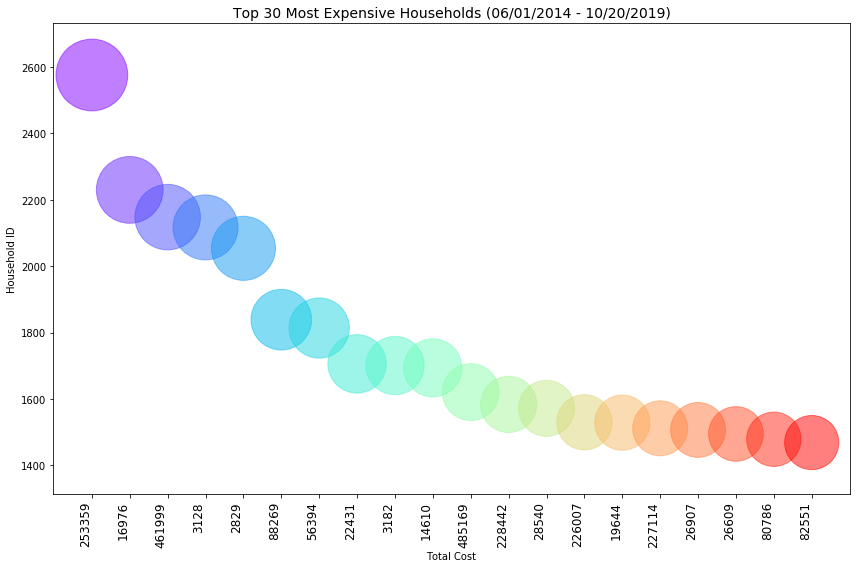

In [85]:
# Graph Time series per household
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
t_membership_id = pd.DataFrame(df_ts.groupby(by=["membership_id"],
    axis=0,
    as_index=False,
    sort=True,
    group_keys=True,
    squeeze=True,
    observed=False).sum(), columns=['membership_id',var_to_predict[0]])

t_membership_id['pct'] = round(t_membership_id[var_to_predict]/t_membership_id[var_to_predict].sum()*100,2)
top_members = t_membership_id.sort_values(by=var_to_predict, ascending=False).head(20)
top_members['membership_id'] = top_members['membership_id'].astype(str)
top_members[var_to_predict] = top_members[var_to_predict].astype(int)
colors = cm.rainbow(np.linspace(0, 1, top_members.shape[0]))
plt.scatter(x=top_members.membership_id, y=top_members[var_to_predict], 
            s=top_members[var_to_predict]*2, alpha=0.5, c=colors)
plt.xlabel("Total Cost")
plt.ylabel("Household ID")
plt.title("Top 30 Most Expensive Households ("+ min_date + " - " + max_date + ")", loc="center")
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
bottom, top = plt.ylim()
plt.ylim(bottom - 100, top + 100)
plt.show()

In [86]:
fig = px.scatter(top_members, x='membership_id', y=var_to_predict[0], size=var_to_predict[0], 
                 color=top_members['membership_id'],size_max=60,text=var_to_predict[0],
                 title = "Top 30 Most Expensive Households ("+ min_date + " - " + max_date + ")",
                )
fig.show()

In [87]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('W').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Week - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.show()

In [150]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('M').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Month - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.show()

In [151]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('Y').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Month - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.show()

# Reload data to conduct another experiment

In [152]:
df_household.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2961 entries, 0 to 5260
Data columns (total 87 columns):
membership_id                        int64
household_key                        int64
income                               object
member_status                        object
state_grouped                        object
credit_ranges                        object
cancel_reason                        object
renew_method                         object
plus_indicator_description           object
zip                                  int64
sc_vehicle_manufacturer_name         object
sc_vehicle_model_name                object
race                                 object
home_owner                           object
education                            object
dwelling_type                        object
gender                               object
occupation_code                      object
occupation_group                     object
occupant_type                        object
mosaic_household

# Original Numeric Columns
col_num =['aaa_member_tenure_years','aaa_mean_age','length_of_residence','aaa_mortgage','aaa_credit_card','aaa_deposit',
          'aaa_home_equity', 'aaa_financial_service','aaa_auto_insurance','aaa_id_theft','aaa_motorcycle_indicator',
          'aaa_travel','aaa_mean_child','aaa_no_race','aaa_no_home_owner','aaa_no_education','aaa_no_income',
          'aaa_no_dwelling_type','aaa_no_credit_ranges','aaa_no_gender','aaa_no_language','aaa_no_reason_joined',
          'aaa_no_mosaic_household','aaa_no_mosaic_global_household', 'aaa_no_kcl_b_ind_mosaicsgrouping',
          'aaa_no_occupation_code','aaa_no_occupation_group','aaa_no_occupant_type','aaa_no_plus_indicator_description',
          'aaa_no_generation','total_member_cost_1','total_member_cost_2','total_member_cost_3','basic_cost','plus_cost',
          'premier_cost','total_calls','total_member_cost','mean_total_member_cost','total_tow_miles','mean_tow_miles',
          'total_members_in_household','total_calls_veh','total_cost_veh','total_member_cost_veh','mean_total_calls_veh',
          'mean_total_cost_veh','mean_total_member_cost_veh','consumer_score','use_road_side'
         ]

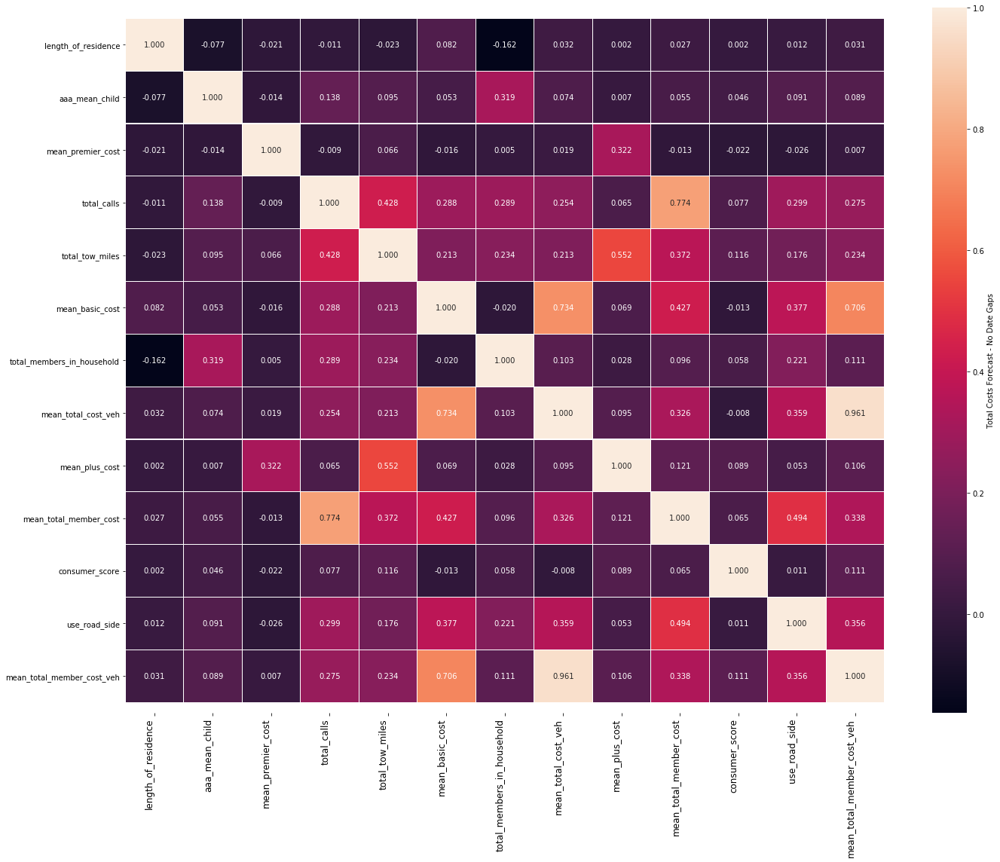

In [4]:
# Select all numeric features from df_household
# Get only numeric columns
# col_num = df_household.select_dtypes(include=np.number).columns.tolist()
# Removed: basic_costs, plus_cost, total_member_cost, total_cost_veh - All highly correlated so decided to remove them
col_num =['length_of_residence','aaa_mean_child',
          'mean_premier_cost','total_calls','total_tow_miles','mean_basic_cost',
          'total_members_in_household', 'mean_total_cost_veh','mean_plus_cost','mean_total_member_cost',
          'consumer_score','use_road_side', 'mean_total_member_cost_veh',
         ]
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()
plt.figure(figsize=(20,16))
sns.heatmap(df_corr, annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_var_corr')
plt.show()

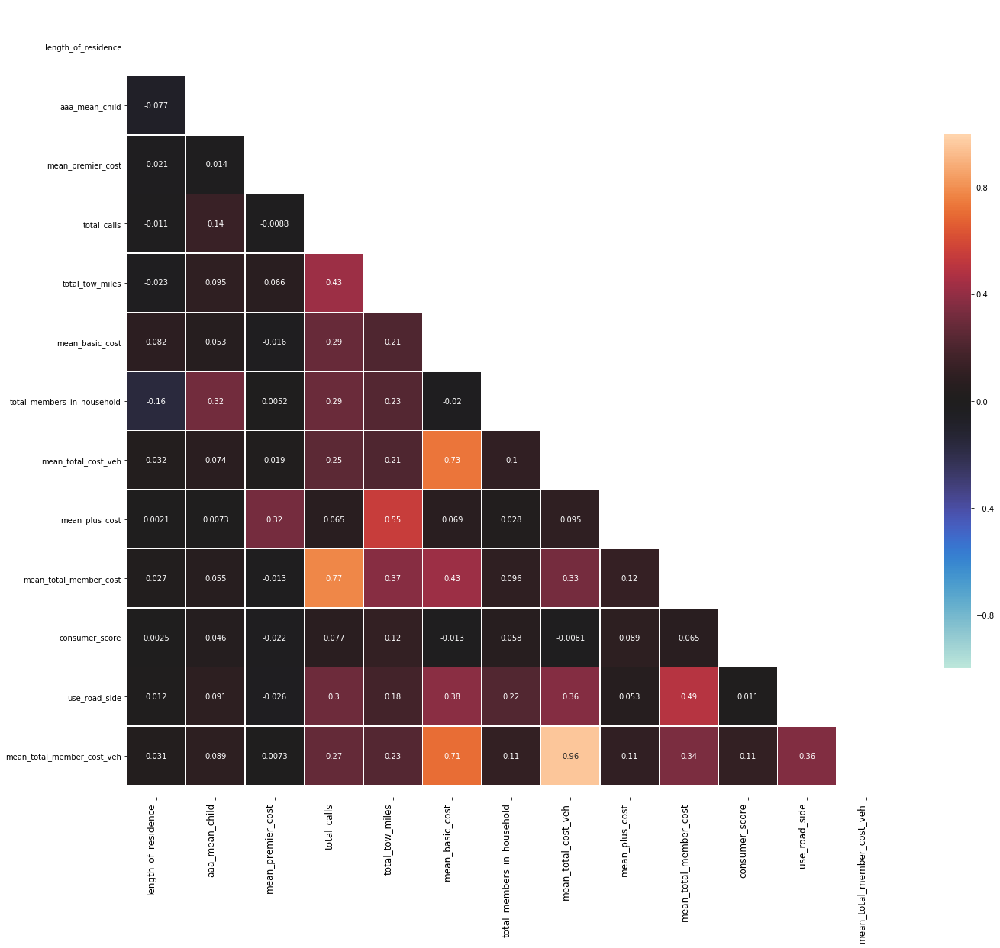

In [5]:
# Correlation
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

#cmap = sns.diverging_palette(180, 20, as_cmap=True)
sns.heatmap(df_corr, mask=mask, vmax=1, vmin =-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_var_corr_1')
plt.show()

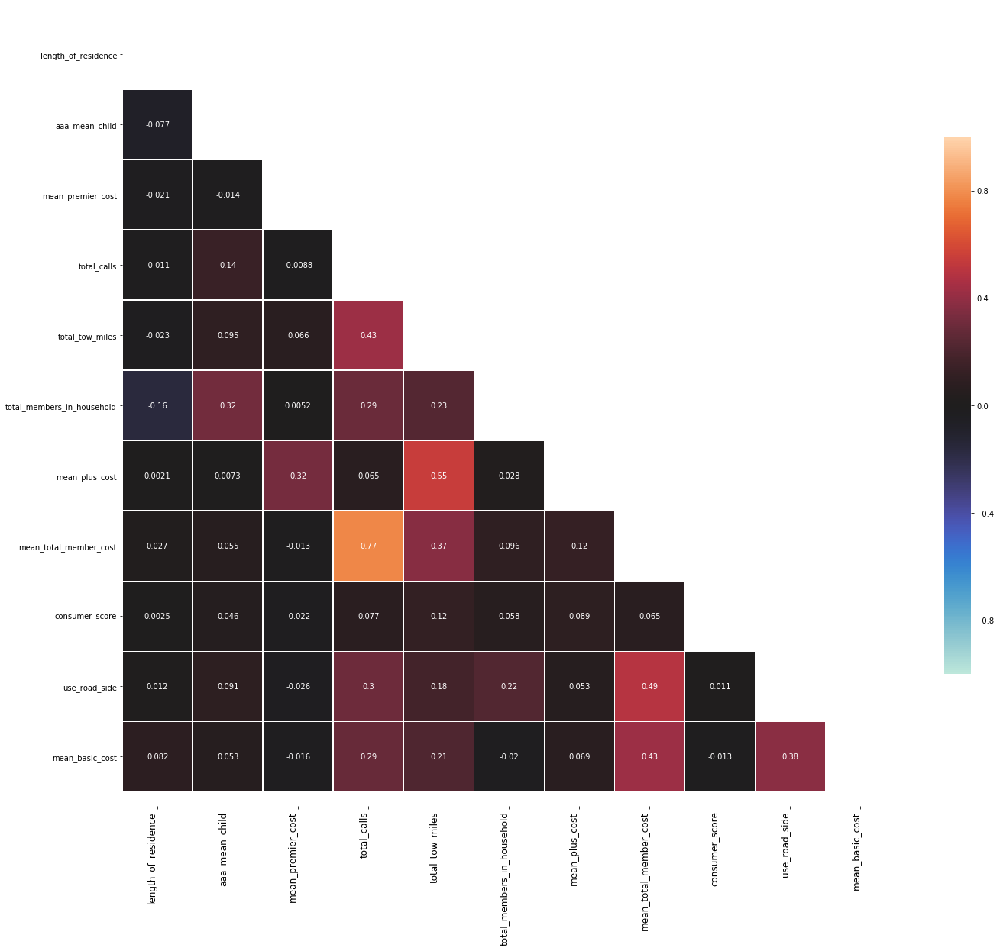

In [6]:
# Correlation deleted: 'mean_total_cost_veh' 'mean_total_member_cost_veh'
col_num =['length_of_residence','aaa_mean_child',
          'mean_premier_cost','total_calls','total_tow_miles',
          'total_members_in_household', 'mean_plus_cost','mean_total_member_cost',
          'consumer_score','use_road_side', 'mean_basic_cost'
         ]
df_corr = pd.DataFrame(df_household, columns=col_num)
df_corr = df_corr.corr()

mask = np.zeros_like(df_corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))

#cmap = sns.diverging_palette(180, 20, as_cmap=True)
sns.heatmap(df_corr, mask=mask, vmax=1, vmin =-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.xticks(rotation=90, 
           horizontalalignment='right',
           fontweight='light',
           fontsize='large')
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_var_corr_2')
plt.show()

In [9]:
# Reload data to conduct another experiment
df_household = reiniciar(df_household)
cols_house_dummmies = ['aaa_financial_service','plus_indicator_description', 'aaa_id_theft', 'generation',
                       'occupation_group','sc_vehicle_manufacturer_name', 'tenure', 'aaa_auto_insurance',
                       'no_members', 'gender', 'kcl_b_ind_mosaicsgrouping','education','home_owner',
                       'aaa_motorcycle_indicator'
                      ]
# Get features from previous heatmap
feature_cols = col_num.copy()

# Build Dummies Variables
df_dummies = pd.get_dummies(df_household, columns=cols_house_dummmies)
for i in cols_house_dummmies:
    cols = [j for j in df_dummies.columns if j.startswith(i)]
    feature_cols += cols

# construct Dataframe for prediction
feature_cols += var_to_predict
df_prediction = pd.DataFrame(df_dummies, columns=feature_cols, index=df_household.index)

# Stripping out spaces from ends of names, and replacing internal spaces with "_"
df_prediction.columns = [col.strip().replace(' ', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('&', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('+', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace(',', '').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('(', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace(')', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('<', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('.', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('/', '_').lower() for col in df_prediction.columns]
df_prediction.columns = [col.strip().replace('-', '_').lower() for col in df_prediction.columns]

# Fix Nans
# Number of child
df_prediction.aaa_mean_child.fillna(value=0, inplace=True)

# Drop Unknown Columns 
cols_to_drop = [j for j in df_prediction.columns if j.endswith('unknown')]
df_prediction.drop(labels=cols_to_drop,axis=1, inplace=True)

# Save columns name for future use in modelling to split X-Input and y-Output
X_cols = df_prediction.columns[:-1]
y_cols = var_to_predict.copy()

df_prediction.head(5)

,length_of_residence,aaa_mean_child,mean_premier_cost,total_calls,total_tow_miles,total_members_in_household,mean_plus_cost,mean_total_member_cost,consumer_score,use_road_side,mean_basic_cost,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,aaa_id_theft_0,aaa_id_theft_1,generation_baby_boomers__1948___1968_,generation_generation_x__1969___1980_,generation_generation_z__1994___2010_,generation_millenials__1981___1993_,generation_post_war____1948_,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,home_owner_home_owner,home_owner_renter,aaa_motorcycle_indicator_0_0,aaa_motorcycle_indicator_1_0,total_cost
0,15.0000,2.0000,0.0000,24.0000,0.8000,1,0.0000,65.0000,0.0137,1,34.7917,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,417.5000
2,8.6364,1.0000,0.0000,12.0000,0.0000,4,0.0000,64.2000,0.0123,1,39.5318,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,434.8500
3,15.0000,1.0000,0.0000,0.0000,0.0000,1,0.0000,0.0000,0.0143,0,28.0000,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,1,0,1,0,28.0000
4,15.0000,2.0000,0.0000,1.0000,7.0000,3,0.0000,7.3563,0.0141,1,53.7313,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,429.8500
5,13.0000,4.3333,0.0000,1.0000,14.0000,3,0.0000,9.8083,0.0132,1,44.1667,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,265.0000


In [157]:
df_prediction.describe()

,length_of_residence,aaa_mean_child,mean_premier_cost,total_calls,total_tow_miles,total_members_in_household,mean_plus_cost,mean_total_member_cost,consumer_score,use_road_side,mean_basic_cost,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,aaa_id_theft_0,aaa_id_theft_1,generation_baby_boomers__1948___1968_,generation_generation_x__1969___1980_,generation_generation_z__1994___2010_,generation_millenials__1981___1993_,generation_post_war____1948_,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,home_owner_home_owner,home_owner_renter,aaa_motorcycle_indicator_0_0,aaa_motorcycle_indicator_1_0,total_cost
count,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000,2961.0000
mean,8.1485,1.4692,0.0105,12.4140,11.5416,2.4802,1.9517,66.8408,0.0149,0.6957,27.5414,0.9092,0.0908,0.4043,0.2925,0.0007,0.0233,0.9362,0.0638,0.2712,0.0500,0.0030,0.0392,0.6180,0.1084,0.0331,0.1763,0.2509,0.0993,0.0496,0.5711,0.6103,0.1651,0.2246,0.6920,0.3080,0.0784,0.2442,0.3509,0.2030,0.1236,0.3202,0.2479,0.2445,0.3161,0.0598,0.0858,0.0520,0.1270,0.1915,0.2111,0.7143,0.0253,0.3053,0.4843,217.5110
std,5.7365,1.0721,0.4996,27.4340,29.5176,1.3217,8.8672,89.2843,0.0013,0.4602,17.9677,0.2874,0.2874,0.4908,0.4550,0.0260,0.1509,0.2445,0.2445,0.4447,0.2179,0.0551,0.1940,0.4860,0.3109,0.1789,0.3811,0.4336,0.2991,0.2172,0.4950,0.4878,0.3714,0.4174,0.4617,0.4617,0.2688,0.4297,0.4773,0.4023,0.3292,0.4666,0.4319,0.4299,0.4650,0.2371,0.2801,0.2221,0.3330,0.3935,0.4081,0.4518,0.1571,0.4606,0.4998,276.4544
min,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0123,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,2.6667,1.0000,0.0000,0.0000,0.0000,2.0000,0.0000,0.0000,0.0141,0.0000,14.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,32.5000
50%,8.3333,1.0000,0.0000,2.0000,0.0000,2.0000,0.0000,33.5000,0.0149,1.0000,29.9750,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,

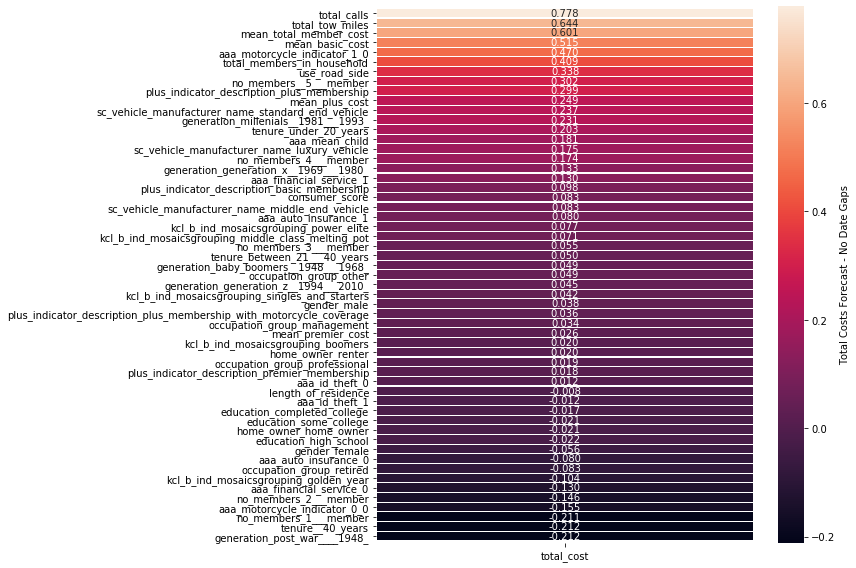

In [158]:
#  Correlation of AAA Costs and other numeric features
# Heat Map 
df_corr = df_prediction.corr()
df_corr.sort_values(by=var_to_predict[0], ascending=False, inplace=True)
df_corr = df_corr[df_corr.index.values!=var_to_predict[0]]
sns.heatmap(df_corr[[var_to_predict[0]]], annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_var_corr_tot_cost')
plt.show()
#df_corr

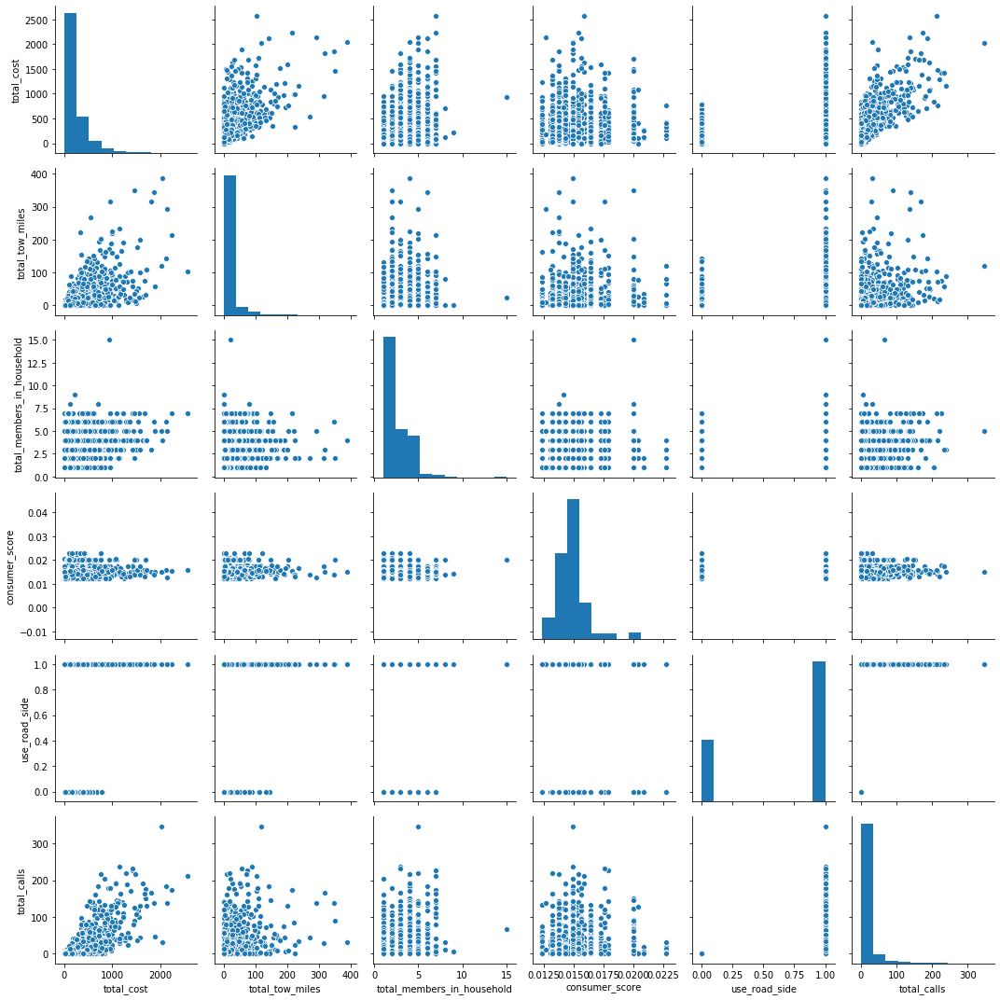

In [159]:
# Pair plot 
sns.pairplot(df_prediction[[var_to_predict[0], 'total_tow_miles', 'total_members_in_household', 
                            'consumer_score','use_road_side', 'total_calls']])
plt.show()

In [80]:
# Reset figure and display settings
%matplotlib inline
pd.plotting.register_matplotlib_converters()
pd.options.display.float_format = '{:.4f}'.format
rcParams.update({'figure.autolayout': True, 'figure.figsize':(12,8),'axes.titlesize':14})

# Setting Up the Training and Test data for up Sampling the minority class
To use the same split in all models

# Algorithms Search and Testing

In [ ]:
from sklearn.utils.testing import all_estimators
from sklearn import base
from sklearn.metrics import SCORERS


estimators = all_estimators()
for name, class_ in estimators:
    if issubclass(class_, base.RegressorMixin):
        print(name)

SCORERS.keys()

In [139]:
# Verify is there is no nulls
df_prediction[df_prediction.isnull().any(axis=1)]

,length_of_residence,aaa_mean_child,mean_premier_cost,total_calls,total_tow_miles,total_members_in_household,mean_plus_cost,mean_total_member_cost,consumer_score,use_road_side,mean_basic_cost,aaa_financial_service_0,aaa_financial_service_1,plus_indicator_description_basic_membership,plus_indicator_description_plus_membership,plus_indicator_description_plus_membership_with_motorcycle_coverage,plus_indicator_description_premier_membership,aaa_id_theft_0,aaa_id_theft_1,generation_baby_boomers__1948___1968_,generation_generation_x__1969___1980_,generation_generation_z__1994___2010_,generation_millenials__1981___1993_,generation_post_war____1948_,occupation_group_management,occupation_group_other,occupation_group_professional,occupation_group_retired,sc_vehicle_manufacturer_name_luxury_vehicle,sc_vehicle_manufacturer_name_middle_end_vehicle,sc_vehicle_manufacturer_name_standard_end_vehicle,tenure__40_years,tenure_between_21___40_years,tenure_under_20_years,aaa_auto_insurance_0,aaa_auto_insurance_1,no_members__5___member,no_members_1___member,no_members_2___member,no_members_3___member,no_members_4___member,gender_female,gender_male,kcl_b_ind_mosaicsgrouping_boomers,kcl_b_ind_mosaicsgrouping_golden_year,kcl_b_ind_mosaicsgrouping_middle_class_melting_pot,kcl_b_ind_mosaicsgrouping_power_elite,kcl_b_ind_mosaicsgrouping_singles_and_starters,education_completed_college,education_high_school,education_some_college,home_owner_home_owner,home_owner_renter,aaa_motorcycle_indicator_0_0,aaa_motorcycle_indicator_1_0,total_cost


In [416]:
num_folds = 10
np.random.seed(42)
scoring = 'neg_mean_squared_error'
test_size = 0.30

# Create input and output dataframes

X_df = pd.DataFrame(df_prediction,columns=X_cols, index=df_prediction.index)
y_df = pd.DataFrame(df_prediction,columns=y_cols, index=df_prediction.index)

# Transform / Normalize the data
scaler_x = PowerTransformer()
scaled_df_x = scaler_x.fit_transform(X_df)
scaled_df_x = pd.DataFrame(scaled_df_x, columns=X_df.columns, index=X_df.index)

scaler_y = PowerTransformer()
scaled_df_y = scaler_y.fit_transform(y_df)
scaled_df_y = pd.DataFrame(scaled_df_y, columns=y_df.columns, index=y_df.index)


# Split Train and test
trainX, testX, trainy, testy = train_test_split(scaled_df_x, scaled_df_y, test_size=test_size)

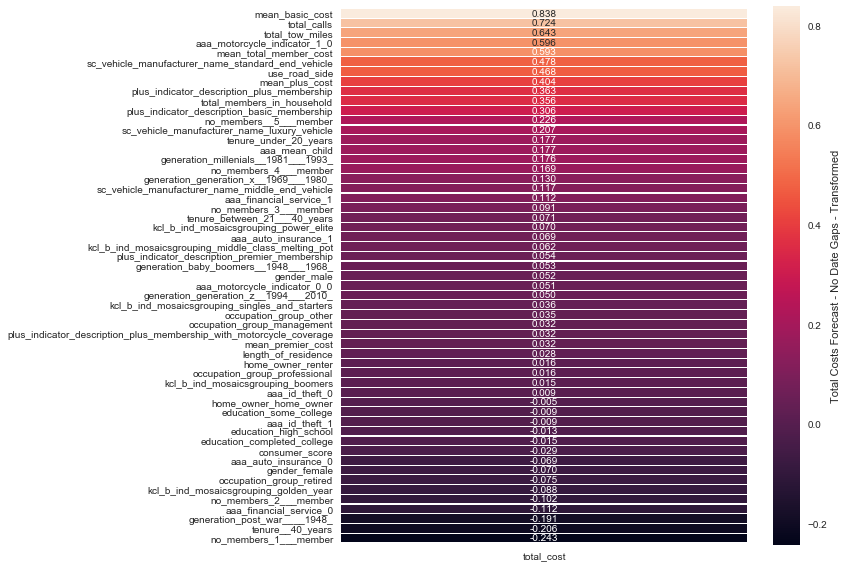

In [418]:
#  Correlation of AAA Costs and other numeric features
# Heat Map 
df_corr = scaled_df_x.copy()
df_corr[var_to_predict] = scaled_df_y[var_to_predict]
df_corr = df_corr.corr()
df_corr.sort_values(by=var_to_predict[0], ascending=False, inplace=True)
df_corr = df_corr[df_corr.index.values!=var_to_predict[0]]
sns.heatmap(df_corr[[var_to_predict[0]]], annot=True, fmt=".3f", linewidths=0.1, xticklabels=True, 
                cbar_kws={'label': var_to_predict_title+' - Transformed'}, yticklabels=True)
bottom, top = plt.ylim()
plt.ylim(bottom + 0.7, top - 0.7)
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_var_corr_tot_cost_transf')
plt.show()
#df_corr

Total Costs Forecast - No Date Gaps - Algorithm Comparison - Regression
BR: RMSE : -0.068 - Std. Dev.: (0.009)
DTR: RMSE : -0.081 - Std. Dev.: (0.014)
EN: RMSE : -0.615 - Std. Dev.: (0.056)
ENCV: RMSE : -0.068 - Std. Dev.: (0.009)
LASSO: RMSE : -0.992 - Std. Dev.: (0.091)
LASCV: RMSE : -0.068 - Std. Dev.: (0.009)
LSVR: RMSE : -0.073 - Std. Dev.: (0.011)
SGDR: RMSE : -0.072 - Std. Dev.: (0.009)
KNNR: RMSE : -0.268 - Std. Dev.: (0.037)
RIDGE: RMSE : -0.068 - Std. Dev.: (0.009)
RIDCV: RMSE : -0.068 - Std. Dev.: (0.009)
ABR: RMSE : -0.077 - Std. Dev.: (0.009)
GBR: RMSE : -0.033 - Std. Dev.: (0.005)
RFR: RMSE : -0.043 - Std. Dev.: (0.005)
ET: RMSE : -0.052 - Std. Dev.: (0.010)
XGB: RMSE : -0.034 - Std. Dev.: (0.005)
BGR: RMSE : -0.043 - Std. Dev.: (0.006)


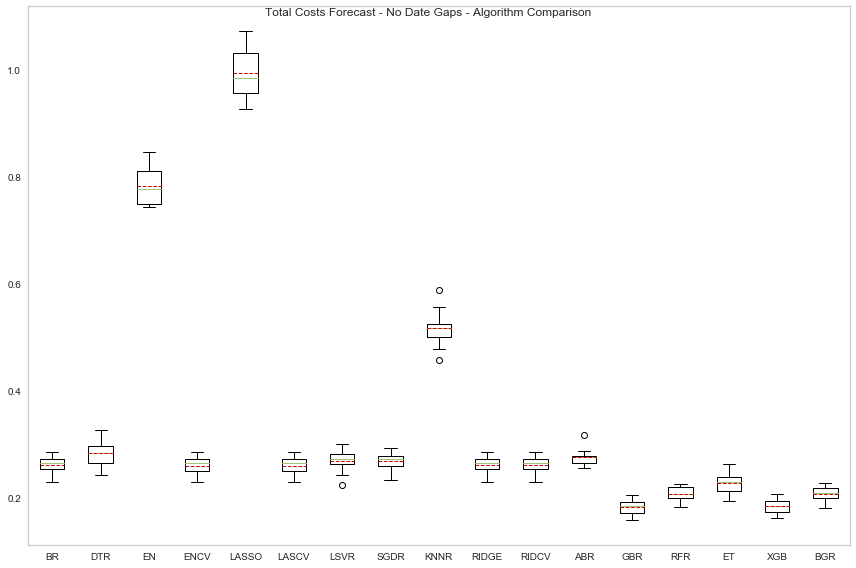

In [419]:
# Algorithms Search
# Spot Check Algorithms

# Linear Regression Methods
print(var_to_predict_title+' - Algorithm Comparison - Regression')
models = []
#models.append(('OLS', LinearRegression(normalize=False)))
models.append(('BR', BayesianRidge(normalize=False)))
models.append(('DTR', DecisionTreeRegressor()))
models.append(('EN', ElasticNet(normalize=False)))
models.append(('ENCV', ElasticNetCV(normalize=False)))
models.append(('LASSO', Lasso(normalize=False)))
models.append(('LASCV', LassoCV(normalize=False)))
models.append(('LSVR', LinearSVR()))
models.append(('SGDR', SGDRegressor()))
models.append(('KNNR', KNeighborsRegressor()))
models.append(('RIDGE', Ridge(normalize=False)))
models.append(('RIDCV', RidgeCV(normalize=False)))

results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    # Calculate RMSE
    results.append(np.sqrt(np.abs(cv_results)))
    names.append(name)                          
    msg = "%s: RMSE : %.3f - Std. Dev.: (%.3f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# Ensembles Methods
ensembles = []
ensembles.append(('ABR', AdaBoostRegressor()))
ensembles.append(('GBR', GradientBoostingRegressor()))
ensembles.append(('RFR', RandomForestRegressor(n_estimators=10)))
ensembles.append(('ET', ExtraTreesRegressor(n_estimators=10)))
ensembles.append(('XGB', XGBRegressor(silent=True)))
ensembles.append(('BGR', BaggingRegressor()))

for name, model in ensembles:
    kfold = KFold(n_splits=num_folds)
    cv_results = cross_val_score(model, trainX, trainy, cv=kfold, scoring=scoring)
    results.append(np.sqrt(np.abs(cv_results)))
    names.append(name)
    msg = "%s: RMSE : %.3f - Std. Dev.: (%.3f)" % (name, (cv_results.mean()), cv_results.std())
    print(msg)

# Compare Algorithms
fig = plt.figure()
fig.suptitle(var_to_predict_title+' - Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results, meanline=True, showmeans=True)
ax.set_xticklabels(names)
plt.grid()
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_algorithms')
plt.show()

# Observation

R^2 (coefficient of determination) regression score function.

    * Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that
    always predicts the expected value of y, disregarding the input features, would get a R^2 score of 0.0.

mean_squared_error
    * A non-negative floating point value (the best value is 0.0)
    The MSE is a measure of the quality of an estimator—it is always non-negative, and values closer to zero are better.

Based on the graph above (RMSE):
    * 1) XGB: RMSE : -0.034 - Std. Dev.: (0.005)
    * 2) GBR: RMSE : -0.033 - Std. Dev.: (0.005)
    * 3) RFR: RMSE : -0.043 - Std. Dev.: (0.005)
    * 4) BGR: RMSE : -0.045 - Std. Dev.: (0.007)
    * 5) ET: RMSE : -0.049 - Std. Dev.: (0.008)

# Grid Search XGB Regressor

In [206]:
# Grid Search XGBOOST regression
np.random.seed(42)
xgbr_param_grid = {'n_estimators': [10, 100, 250, 500, 1000],
                  'max_depth': [3,4,5,6], 'learning_rate': [0.1, 0.01, 0.05, 1],
                   'booster': ['gbtree'], 'gamma': [0, 0.1]
                 }
kfold = KFold(n_splits=num_folds)
xgbr = XGBRegressor(silent=True)
# Perform grid search: grid_mse
xgbr_grid = GridSearchCV(estimator=xgbr, param_grid=xgbr_param_grid,
                       scoring=scoring, cv=kfold, verbose=1, n_jobs=10)
xgbr_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print("Best parameters found: ", xgbr_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(xgbr_grid.best_score_)))
            

Fitting 10 folds for each of 160 candidates, totalling 1600 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   20.7s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:  2.8min
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:  7.5min
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed: 15.2min
[Parallel(n_jobs=10)]: Done 1230 tasks      | elapsed: 25.1min
[Parallel(n_jobs=10)]: Done 1600 out of 1600 | elapsed: 33.9min finished


Best parameters found:  {'booster': 'gbtree', 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 1000}
Lowest RMSE found:  0.17017607326331372


# Observation
These are the best parameters:

First run identifying C
    * Best parameters found:  {'booster': 'gbtree', 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 1000}
    * Lowest RMSE found:  0.17017607326331372


In [197]:
# Modeling based on the outcome of the grid serach of the random forest
xgbr = XGBRegressor(silent=True, booster='gbtree', learning_rate=0.05, max_depth=3, n_estimators=1000, 
                   gamma=0)

xgbr.fit(trainX, trainy)

# Predict on test set
yhat_train = xgbr.predict(trainX)

# Predict on test set
yhat = xgbr.predict(testX)

# Calculate Cross valdation scores
scores_xgbr = cross_val_score(xgbr, testX, testy, cv=num_folds, scoring=scoring)

print('XGBoost Classifer Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('XGBoost Classifer Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('XGBoost Classifer  Train MSE - Transformed    : %.5f' % yhat_train_mse1)
print('XGBoost Classifer  Test MSE - Transformed     : %.5f' % yhat_test_mse1)
print('XGBoost Classifer  Train RMSE - Transformed   : %.5f' % yhat_train_rmse1)
print('XGBoost Classifer  Test RMSE - Transformed    : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_xgbr)), y=np.sqrt(np.abs(scores_xgbr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_xgbr_crossv.png')
fig.show()

XGBoost Classifer Train r2 score - Transformed : 0.98933
XGBoost Classifer Test r2 score - Transformed  : 0.97638
XGBoost Classifer  Train MSE - Transformed    : 0.01057
XGBoost Classifer  Test MSE - Transformed     : 0.02415
XGBoost Classifer  Train RMSE - Transformed   : 0.10279
XGBoost Classifer  Test RMSE - Transformed    : 0.15541


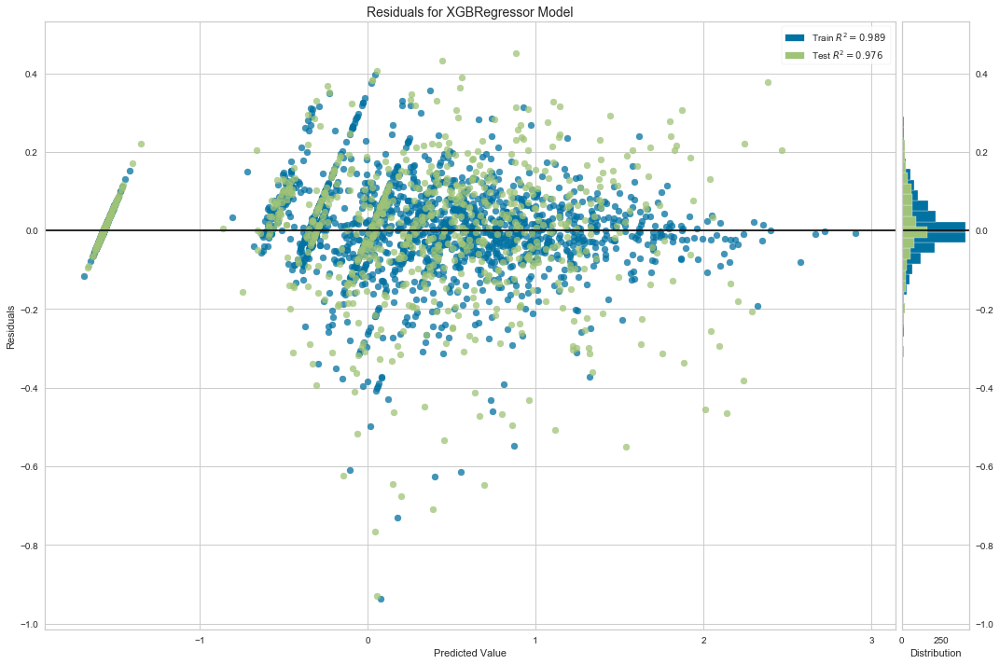

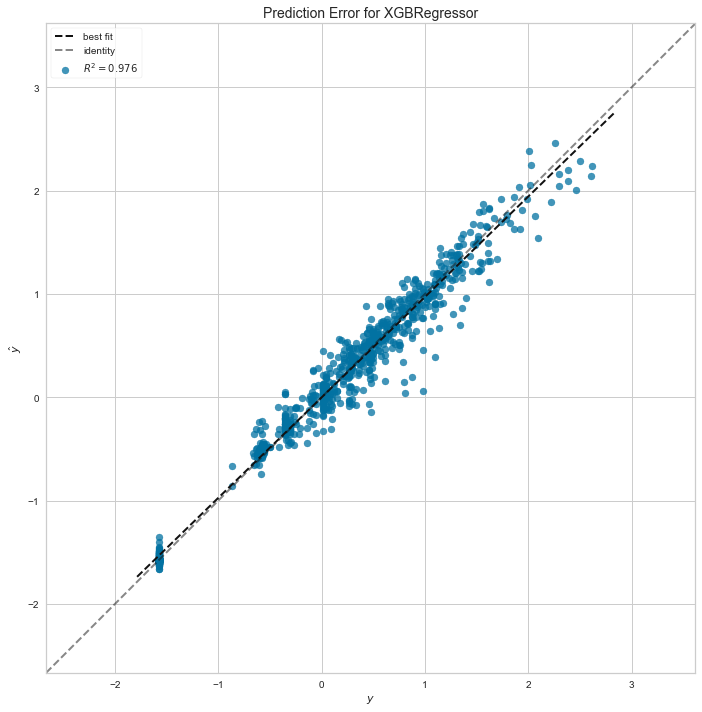

In [218]:
# Residual Plot and predictor error plot
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

visualizer = ResidualsPlot(xgbr, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_residuals_xgbr.png')
plt.show()


visualizer = PredictionError(xgbr, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_predictor_error_xgbr.png')
plt.show()

In [209]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('XGBoost Regressor Train r2 score : %.5f' % r2_score(un_trainy, un_yhat_train))
print('XGBoost Regressor Test  r2 score : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('XGBoost Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('XGBoost Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('XGBoost Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('XGBoost Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('XGBoost Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('XGBoost Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())


XGBoost Regressor Train r2 score : 0.98296
XGBoost Regressor Test  r2 score : 0.92128
XGBoost Regressor  Train MSE             : 1265.06452
XGBoost Regressor  Test MSE              : 6404.87376
XGBoost Regressor  Train RMSE            : 35.56775
XGBoost Regressor  Test RMSE             : 80.03046
XGBoost Regressor  Train Mean FCST Error : 0.00000
XGBoost Regressor  Test Mean FCST Error  : 6.01866


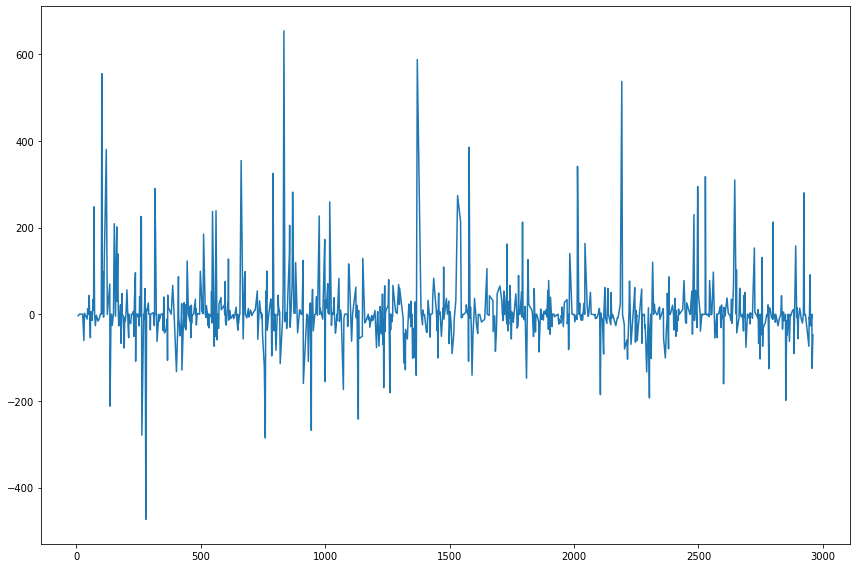

In [165]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

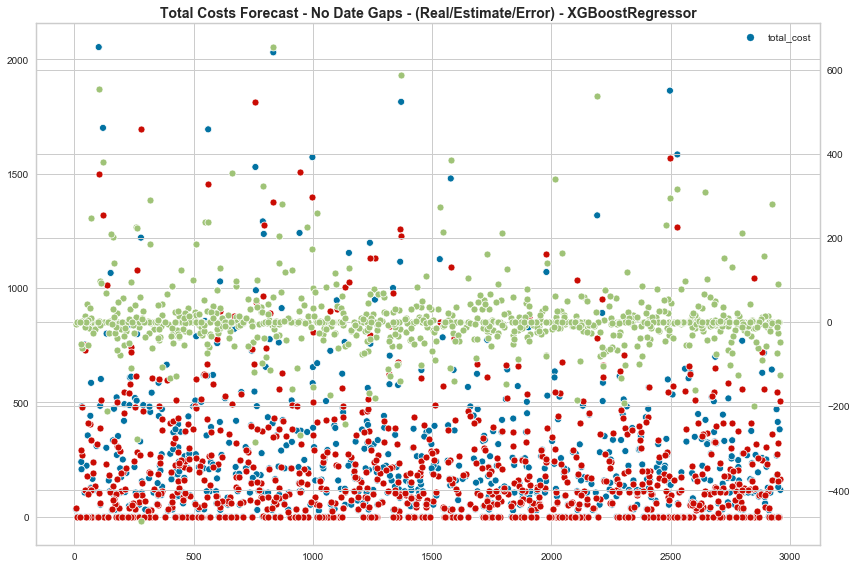

In [217]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - XGBoostRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_scatter_xgbr')
plt.show()

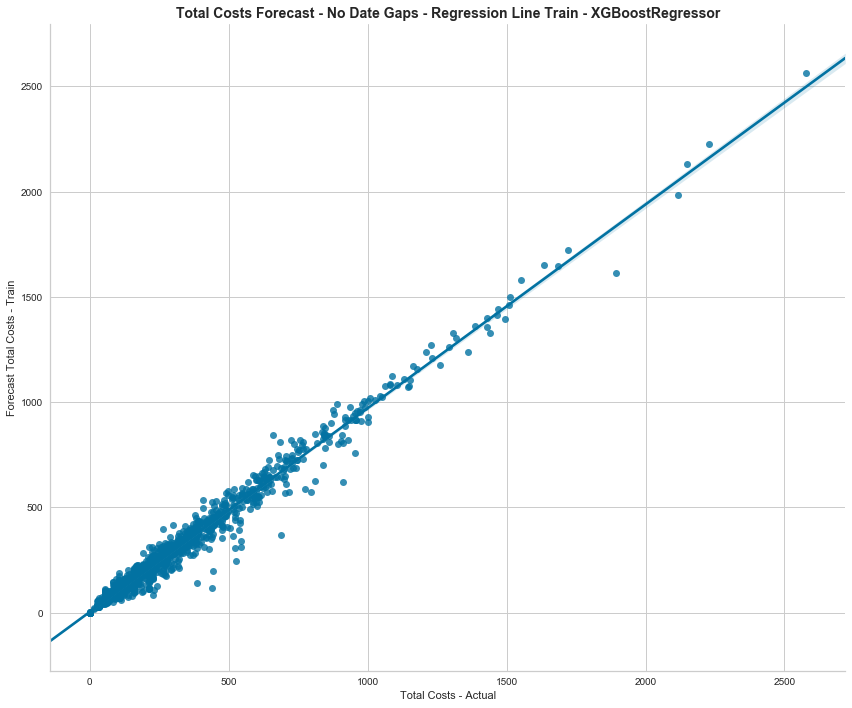

In [211]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - XGBoostRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_train_xgbr')
plt.show()

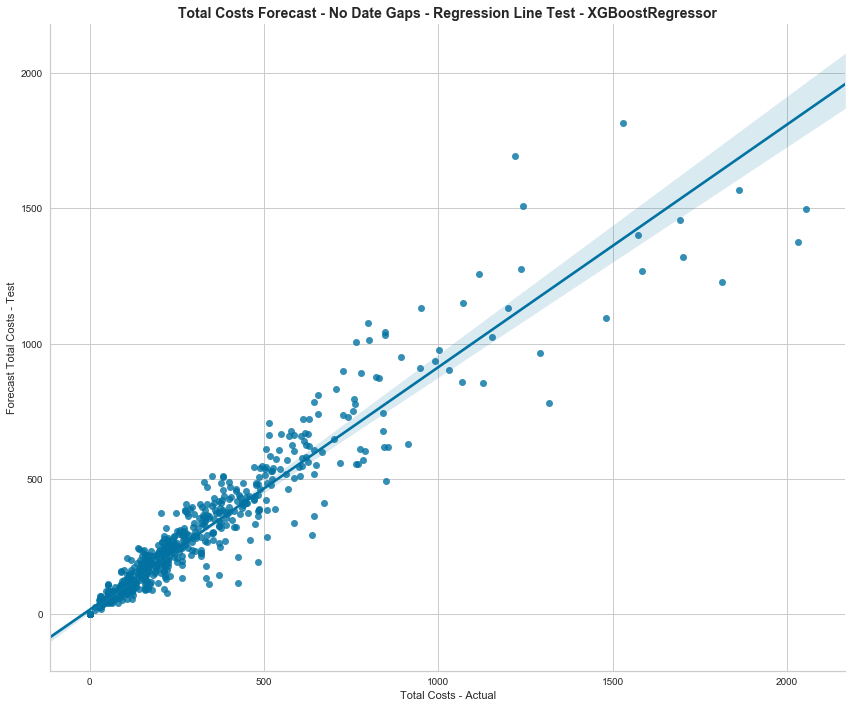

In [212]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - XGBoostRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_test_xgbr')
plt.show()

In [213]:
fig = px.line(un_yhat_train, y=var_to_predict[0], labels={var_to_predict[0]:var_to_predict_title}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.show()

# Gradient Boosting Regression Grid Search

In [106]:
# Grid Search - Gradient Boosting Regression
np.random.seed(42)
gbr_param_grid = {'n_estimators': [100, 250, 500, 750, 1000],
                  'max_depth': [3,4,5,6,7], 'learning_rate': [0.1, 0.01, 0.05,1],
                 }
kfold = KFold(n_splits=num_folds)
gbr = GradientBoostingRegressor()
# Perform grid search: grid_mse
gbr_grid = GridSearchCV(estimator=gbr, param_grid=gbr_param_grid,
                       scoring=scoring, cv=kfold, verbose=1, n_jobs=10)
gbr_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print('Gradient boosting Regression - Grid Search')
print("Best parameters found: ", gbr_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(gbr_grid.best_score_)))

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   28.3s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:  3.5min
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:  9.3min
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed: 18.1min
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed: 21.3min finished


Gradient boosting Regression - Grid Search
Best parameters found:  {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 750}
Lowest RMSE found:  0.2006731670520101


# Observation
These are the best parameters:

First run identifying parameters
    * Best parameters found:  {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 750}
    * Lowest RMSE found:  0.2006731670520101


In [220]:
# Modeling based on the outcome of the grid serach of Gradient Boosting 
gbr = GradientBoostingRegressor(verbose=0, learning_rate=0.05, max_depth=3, n_estimators=750)

gbr.fit(trainX, trainy)

# Predict on test set
yhat_train = gbr.predict(trainX)

# Predict on test set
yhat = gbr.predict(testX)

# Calculate Cross valdation scores
scores_gbr = cross_val_score(gbr, testX, testy, cv=num_folds, scoring=scoring)

print('Gradient Boost Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('Gradient Boost Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('Gradient Boost Regressor  Train MSE - Transformed    : %.5f' % yhat_train_mse1)
print('Gradient Boost Regressor  Test MSE - Transformed     : %.5f' % yhat_test_mse1)
print('Gradient Boost Regressor Train RMSE - Transformed   : %.5f' % yhat_train_rmse1)
print('Gradient Boost Regressor Test RMSE - Transformed    : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_gbr)), y=np.sqrt(np.abs(scores_gbr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_gbr_crossv.png')
fig.show()

Gradient Boost Regressor Train r2 score - Transformed : 0.98813
Gradient Boost Regressor Test r2 score - Transformed  : 0.97580
Gradient Boost Regressor  Train MSE - Transformed    : 0.01175
Gradient Boost Regressor  Test MSE - Transformed     : 0.02475
Gradient Boost Regressor Train RMSE - Transformed   : 0.10841
Gradient Boost Regressor Test RMSE - Transformed    : 0.15731


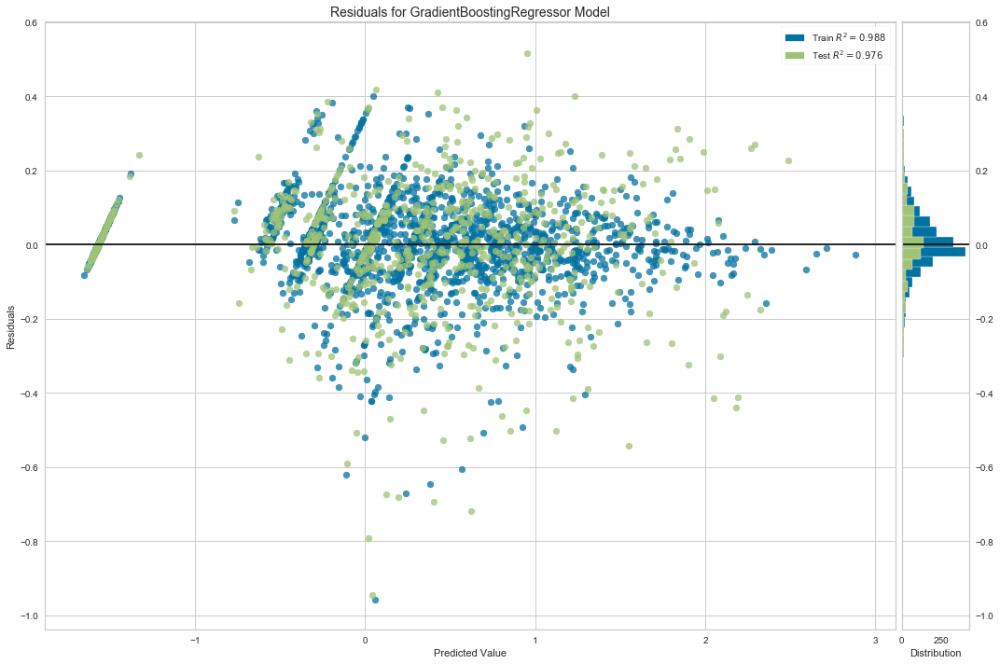

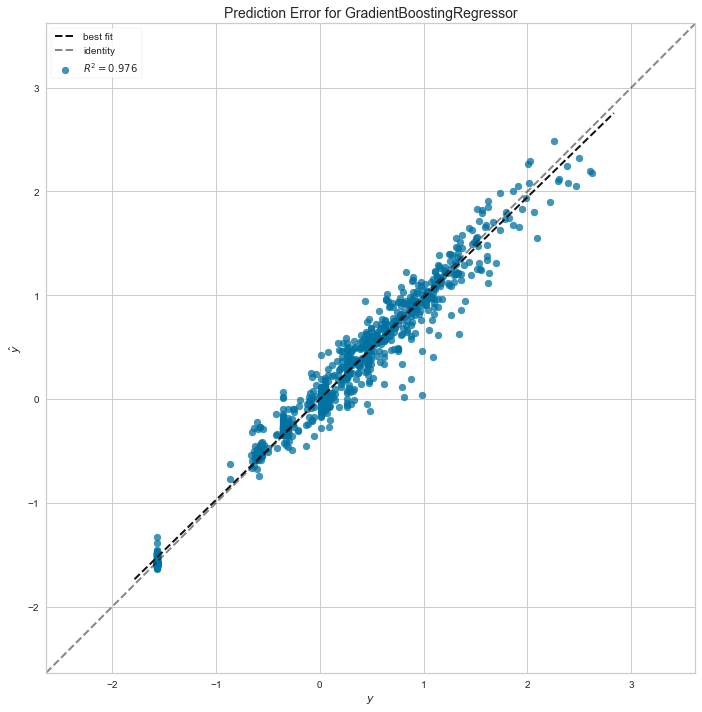

In [226]:
# Residual Plot and predictor error plot
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

visualizer = ResidualsPlot(gbr, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_residuals_gbr.png')
plt.show()


visualizer = PredictionError(gbr, is_fitted=True, size=(1180, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_predictor_error_gbr.png')
plt.show()

In [222]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('Gradient Boost Regressor Train r2 score : %.5f' % r2_score(un_trainy, un_yhat_train))
print('Gradient Boost Regressor Test  r2 score : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('Gradient Boost Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('Gradient Boost Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('Gradient Boost Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('Gradient Boost Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('Gradient Boost Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('Gradient Boost Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())


Gradient Boost Regressor Train r2 score : 0.98107
Gradient Boost Regressor Test  r2 score : 0.92172
Gradient Boost Regressor  Train MSE             : 1405.52014
Gradient Boost Regressor  Test MSE              : 6368.84359
Gradient Boost Regressor  Train RMSE            : 37.49027
Gradient Boost Regressor  Test RMSE             : 79.80503
Gradient Boost Regressor  Train Mean FCST Error : 0.00000
Gradient Boost Regressor  Test Mean FCST Error  : 5.26345


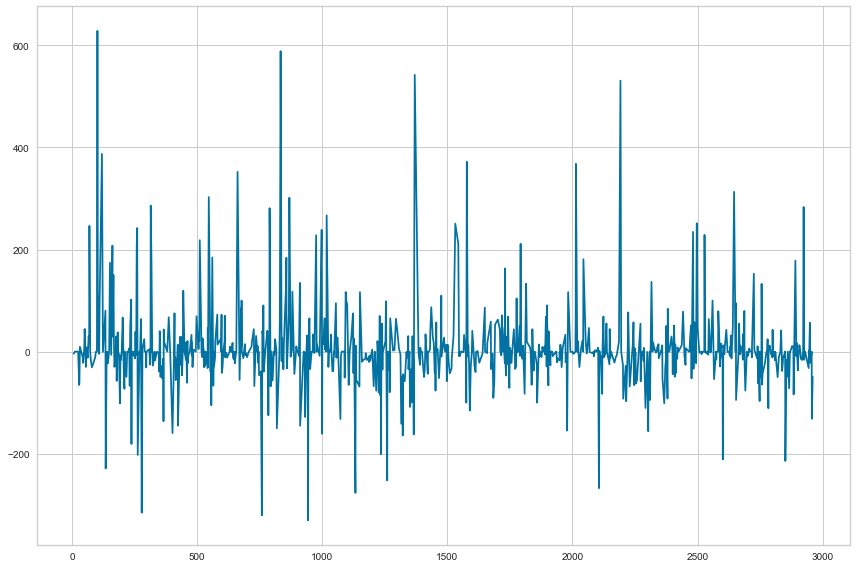

In [223]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

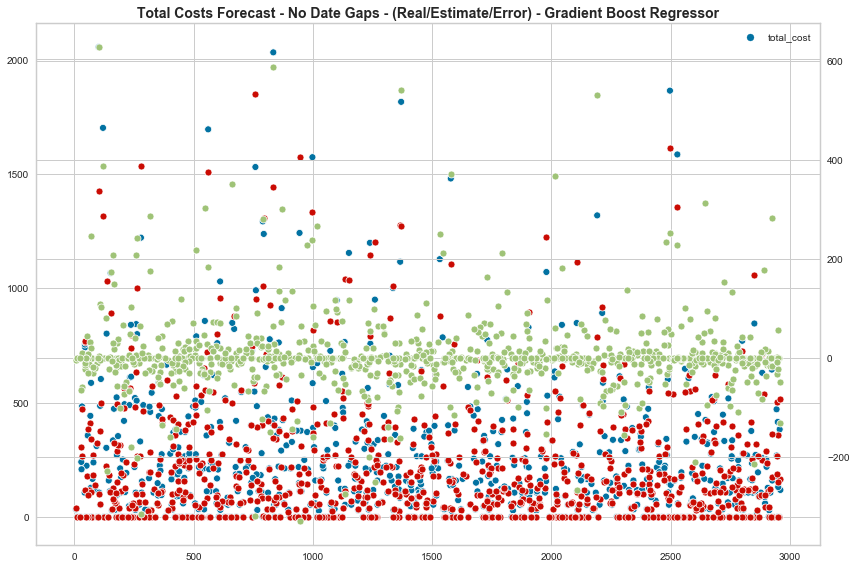

In [224]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - Gradient Boost Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_scatter_gbr')
plt.show()

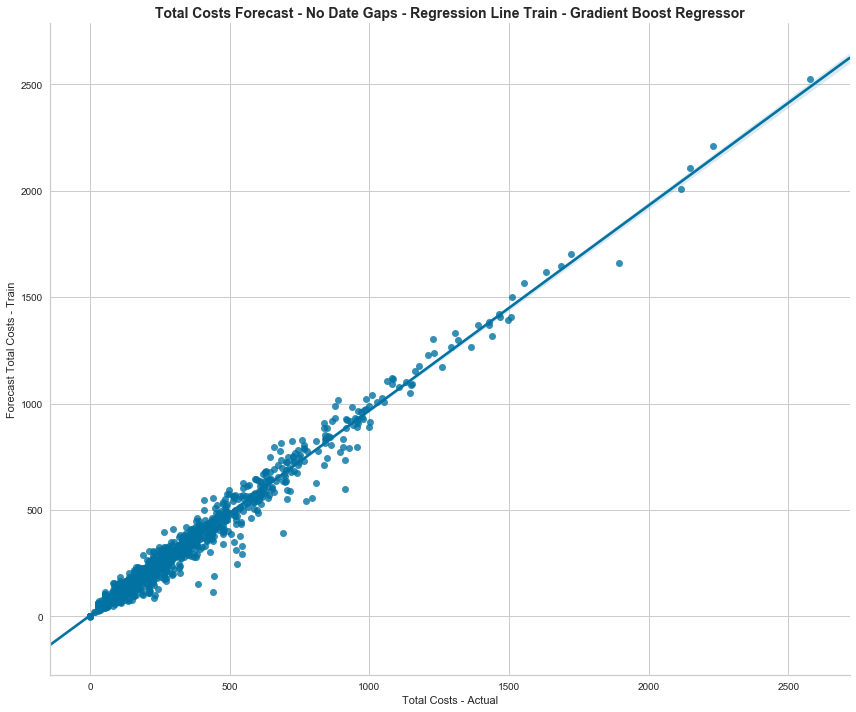

In [225]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - Gradient Boost Regressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_train_gbr')
plt.show()

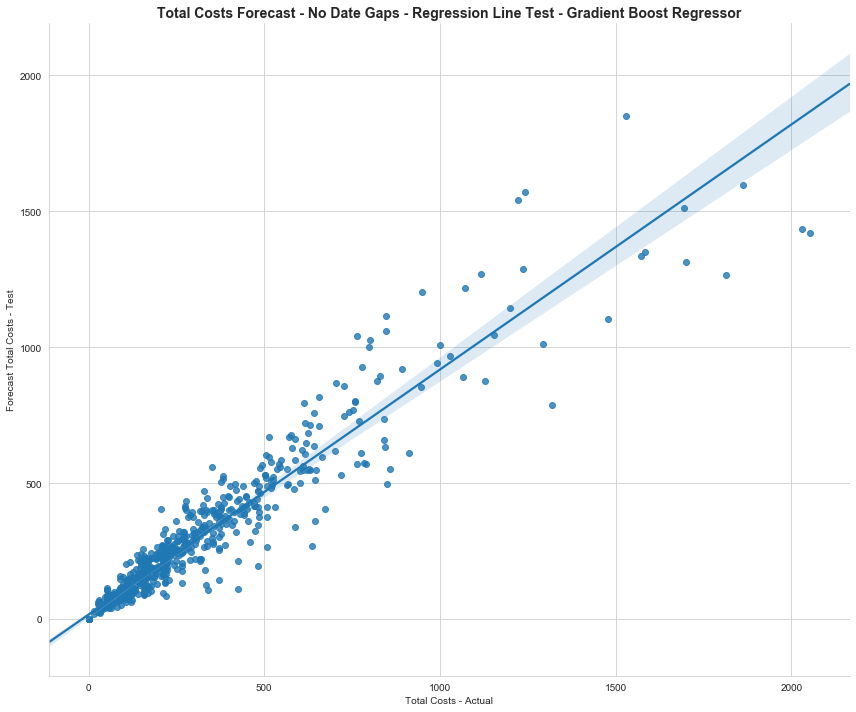

In [160]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - Gradient Boost Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_test_gbr')
plt.show()

# Random Forest Regressor Model

In [114]:
# Grid Search - Gradient Boosting Regression
np.random.seed(42)
rfr_param_grid = {'n_estimators': [100, 250, 500, 750, 1000],'n_jobs':[10],
                  'max_depth': np.arange(2, 100, 10), 'verbose':[1]
                  "max_features":['auto', 'sqrt', 'log2'],
                  "min_samples_split": [2, 3,5,7],
                  "min_samples_leaf": [1, 3,5,6]
                 }
kfold = KFold(n_splits=num_folds)
rfr = RandomForestRegressor()
# Perform grid search: grid_mse
rfr_grid = GridSearchCV(estimator=rfr, param_grid=rfr_param_grid,
                       scoring=scoring, cv=kfold)
rfr_grid.fit(trainX, trainy)
# Print the best parameters and lowest RMSE
print('Random Forest Regression - Grid Search')
print("Best parameters found: ", rfr_grid.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(rfr_grid.best_score_)))

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    3.4s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 co

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Usi

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 280 tasks      | elapsed:    0.4s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    3.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 200 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    3.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      |

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out

[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 260 tasks      | elapsed:    1.5s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.1s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 260 tasks      | elapsed:    1.6s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 t

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 260 tasks      | elapsed:    1.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.4s
[Parallel(n_jobs=10)]: Done 430 t

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 t

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend Loky

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.0s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 t

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    2.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 120 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    0.9s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    6.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | ela

[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 140 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.3s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 160 tasks      | elapsed:    1.0s
[Parallel(n_jobs=10)]: Done 500 out of 500 | elapsed:    3.1s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tas

[Parallel(n_jobs=10)]: Done 200 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    4.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 750 out of 750 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 200 tasks      | elapsed:    1.2s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    5.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | ela

Random Forest Regression - Grid Search
Best parameters found:  {'max_depth': 92, 'n_estimators': 250, 'n_jobs': 10, 'verbose': 1}
Lowest RMSE found:  0.21648411598594441


[Parallel(n_jobs=10)]: Done 250 out of 250 | elapsed:    1.5s finished


# Observation
These are the best parameters:

First run identifying parameters
    * Best parameters found:  {'max_depth': 92, 'n_estimators': 250, 'n_jobs': 10, 'verbose': 1}
    * Lowest RMSE found:  0.21648411598594441

In [229]:
# Modeling based on the outcome of the grid serach of Random Forest Regressor
rfr = RandomForestRegressor(max_depth=52, n_estimators=250, verbose=0)

rfr.fit(trainX, trainy)

# Predict on test set
yhat_train = rfr.predict(trainX)

# Predict on test set
yhat = rfr.predict(testX)

# Calculate Cross valdation scores
scores_rfr = cross_val_score(rfr, testX, testy, cv=num_folds, scoring=scoring)

print('Random Forest Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('Random Forest Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('Random Forest Regressor Train MSE - Transformed      : %.5f' % yhat_train_mse1)
print('Random Forest Regressor Test MSE - Transformed       : %.5f' % yhat_test_mse1)
print('Random Forest Regressor Train RMSE - Transformed     : %.5f' % yhat_train_rmse1)
print('Random Forest Regressor Test RMSE - Transformed      : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_rfr)), y=np.sqrt(np.abs(scores_rfr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_rfr_crossv.png')
fig.show()

Random Forest Regressor Train r2 score - Transformed : 0.99481
Random Forest Regressor Test r2 score - Transformed  : 0.96842
Random Forest Regressor Train MSE - Transformed      : 0.00513
Random Forest Regressor Test MSE - Transformed       : 0.03229
Random Forest Regressor Train RMSE - Transformed     : 0.07166
Random Forest Regressor Test RMSE - Transformed      : 0.17970


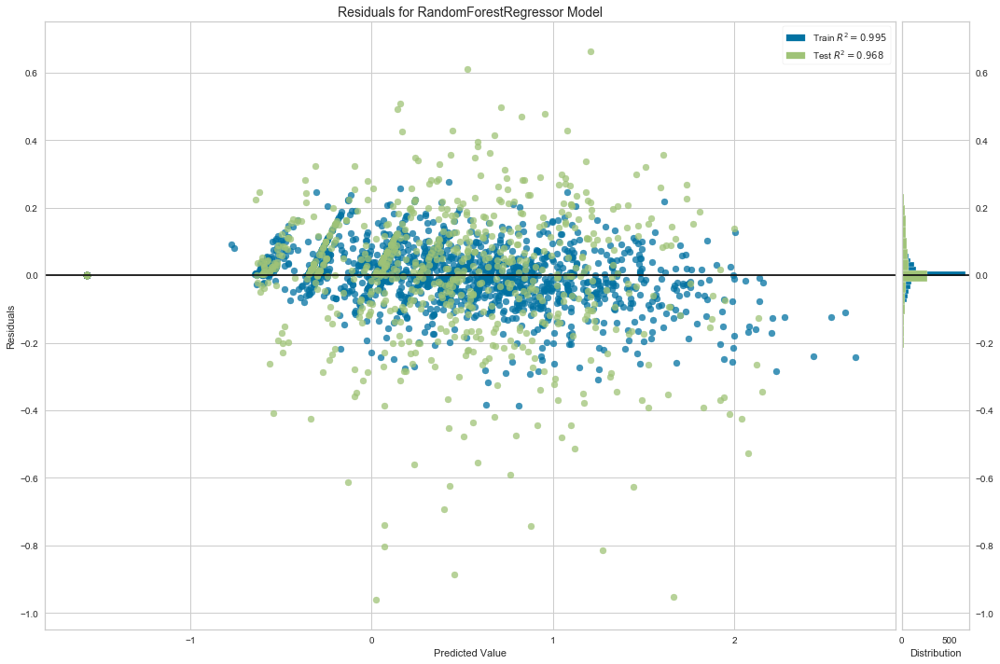

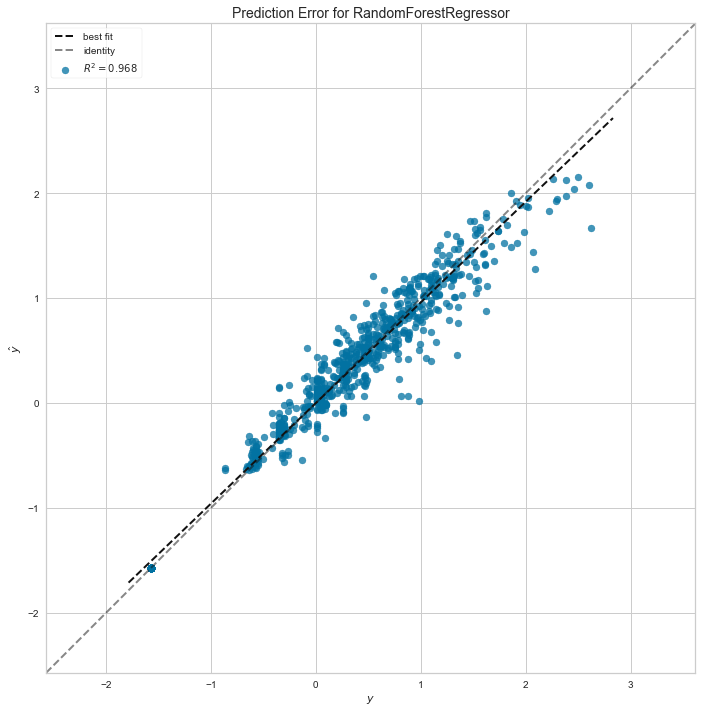

In [230]:
# Residual Plot and predictor error plot
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

visualizer = ResidualsPlot(rfr, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_residuals_rfr.png')
plt.show()


visualizer = PredictionError(rfr, is_fitted=True, size=(1180, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_predictor_error_rfr.png')
plt.show()

In [231]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('Random Forest Regressor Train r2 score         : %.5f' % r2_score(un_trainy, un_yhat_train))
print('Random Forest Regressor Test  r2 score         : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('Random Forest Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('Random Forest Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('Random Forest Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('Random Forest Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('Random Forest Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('Random Forest Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())

Random Forest Regressor Train r2 score         : 0.97900
Random Forest Regressor Test  r2 score         : 0.87486
Random Forest Regressor  Train MSE             : 1558.84596
Random Forest Regressor  Test MSE              : 10181.12670
Random Forest Regressor  Train RMSE            : 39.48222
Random Forest Regressor  Test RMSE             : 100.90157
Random Forest Regressor  Train Mean FCST Error : 0.00000
Random Forest Regressor  Test Mean FCST Error  : 10.72046


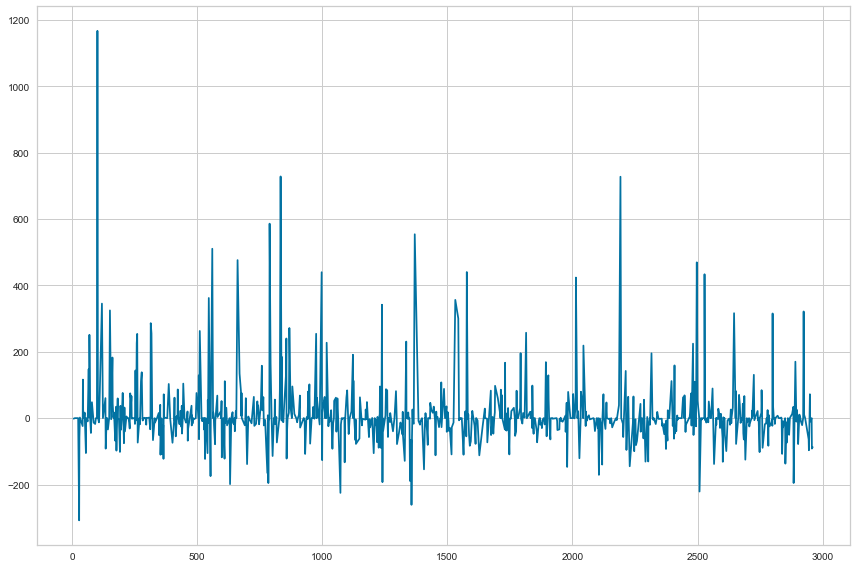

In [232]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

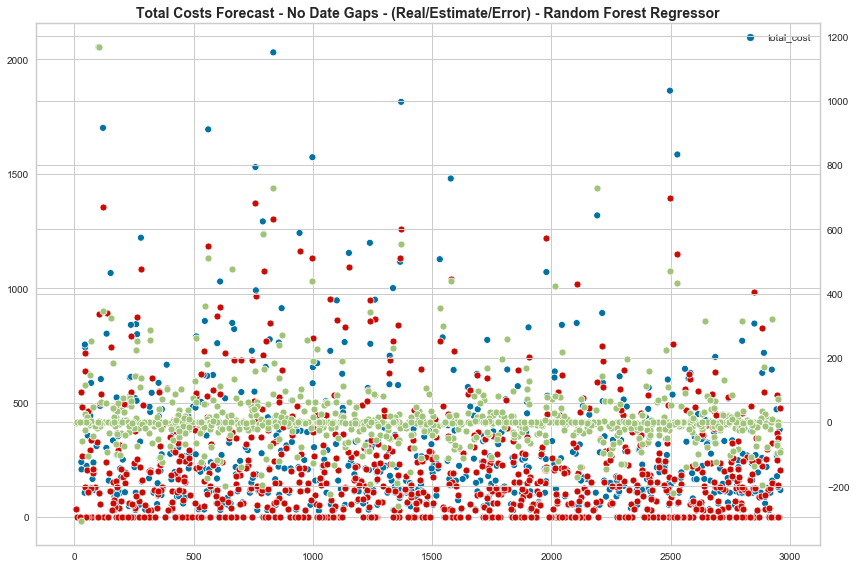

In [233]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - Random Forest Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_scatter_rfr')
plt.show()

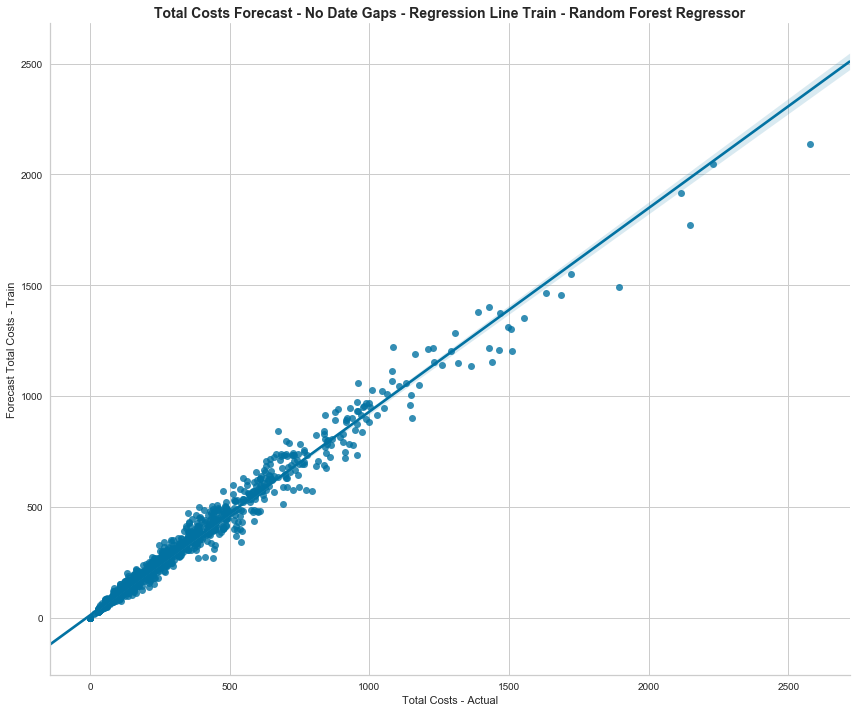

In [234]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - Random Forest Regressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_train_rfr')
plt.show()

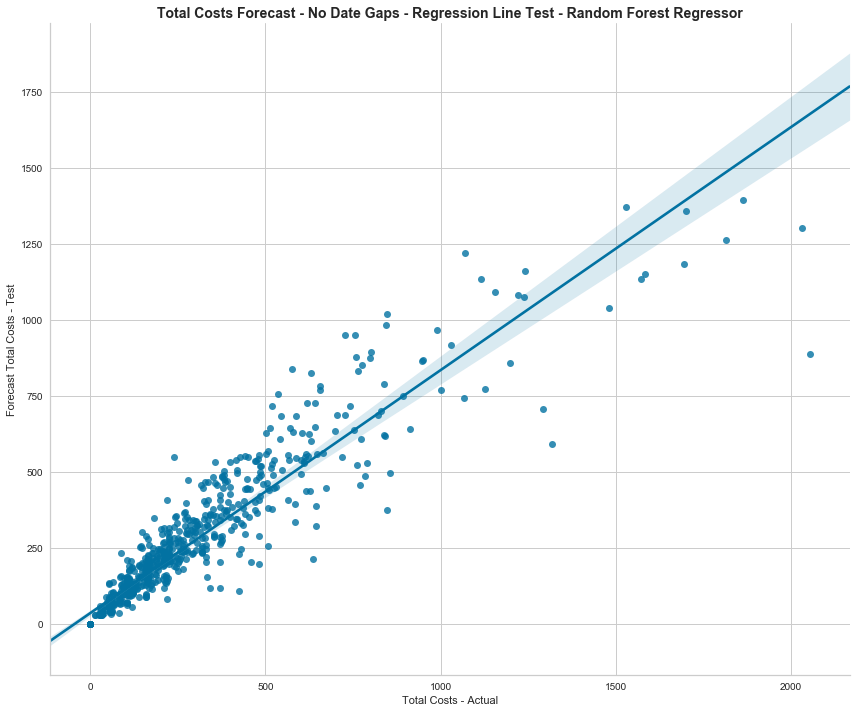

In [235]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - Random Forest Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_test_rfr')
plt.show()

# Bagging Regressor model

In [159]:
# Bagging Regressor
np.random.seed(42)

#create a dictionary of all values we want to test
param_grid = {"n_estimators": [10, 100, 200, 300],
              'n_jobs':[10]
             }

# bagging regresssor
bgr = BaggingRegressor()

#use gridsearch to test all values
bgr_gscv = GridSearchCV(bgr, param_grid, cv=num_folds)

#fit model to data
bgr_gscv.fit(trainX, trainy)
print('Bagging Regression - Grid Search')
print("Best parameters found: ", bgr_gscv.best_params_)
print("Lowest RMSE found: ", np.sqrt(np.abs(bgr_gscv.best_score_)))

Bagging Regression - Grid Search
Best parameters found:  {'n_estimators': 100, 'n_jobs': 10}
Lowest RMSE found:  0.9597037466413523


# Observation

Based on the grid search above, the best parameter for the Bagging regressor is:
    * Best parameters found:  {'n_estimators': 100, 'n_jobs': 10}
    * Lowest RMSE found:  0.9597037466413523

In [236]:
# Modeling based on the outcome of the grid serach of Bagging Regressor
bgr = BaggingRegressor(n_estimators=100, n_jobs=10)

bgr.fit(trainX, trainy)

# Predict on test set
yhat_train = bgr.predict(trainX)

# Predict on test set
yhat = bgr.predict(testX)

# Calculate Cross valdation scores
scores_bgr = cross_val_score(bgr, testX, testy, cv=num_folds, scoring=scoring)

print('Bagging Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('Bagging Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('Bagging Regressor Train MSE - Transformed      : %.5f' % yhat_train_mse1)
print('Bagging Regressor Test MSE - Transformed       : %.5f' % yhat_test_mse1)
print('Bagging Regressor Train RMSE - Transformed     : %.5f' % yhat_train_rmse1)
print('Bagging Regressor Test RMSE - Transformed      : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_bgr)), y=np.sqrt(np.abs(scores_bgr)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_bgr_crossv.png')
fig.show()

Bagging Regressor Train r2 score - Transformed : 0.99456
Bagging Regressor Test r2 score - Transformed  : 0.96851
Bagging Regressor Train MSE - Transformed      : 0.00538
Bagging Regressor Test MSE - Transformed       : 0.03220
Bagging Regressor Train RMSE - Transformed     : 0.07336
Bagging Regressor Test RMSE - Transformed      : 0.17945


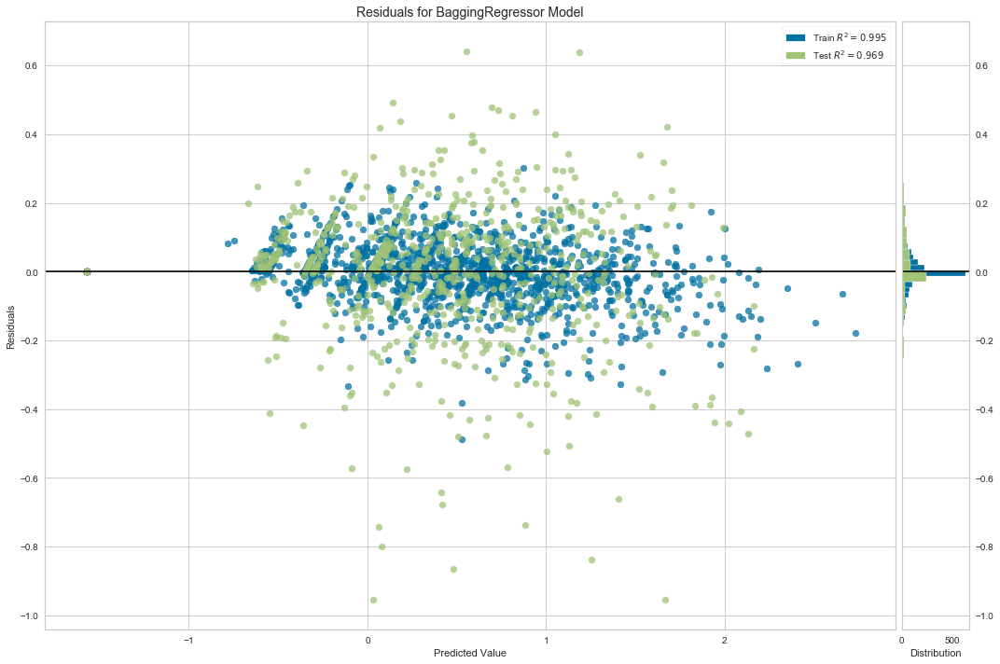

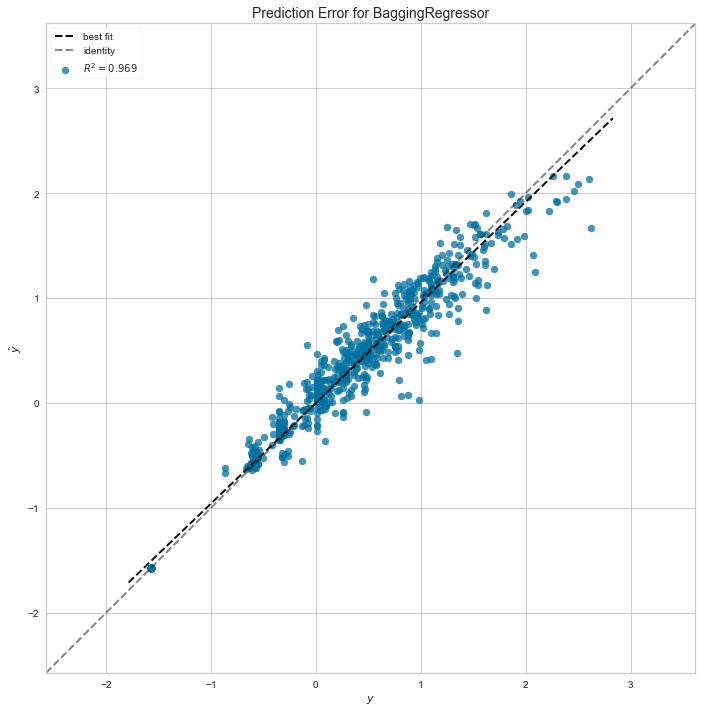

In [238]:
# Residual Plot and predictor error plot
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

visualizer = ResidualsPlot(bgr, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_residuals_bgr.png')
plt.show()


visualizer = PredictionError(bgr, is_fitted=True, size=(1180, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_predictor_error_bgr.png')
plt.show()

In [239]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('Bagging Regressor Train r2 score         : %.5f' % r2_score(un_trainy, un_yhat_train))
print('Bagging Regressor Test  r2 score         : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('Bagging Regressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('Bagging Regressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('Bagging Regressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('Bagging Regressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('Bagging Regressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('Bagging Regressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())

Bagging Regressor Train r2 score         : 0.97898
Bagging Regressor Test  r2 score         : 0.87413
Bagging Regressor  Train MSE             : 1560.01333
Bagging Regressor  Test MSE              : 10240.55144
Bagging Regressor  Train RMSE            : 39.49700
Bagging Regressor  Test RMSE             : 101.19561
Bagging Regressor  Train Mean FCST Error : 0.00000
Bagging Regressor  Test Mean FCST Error  : 10.88933


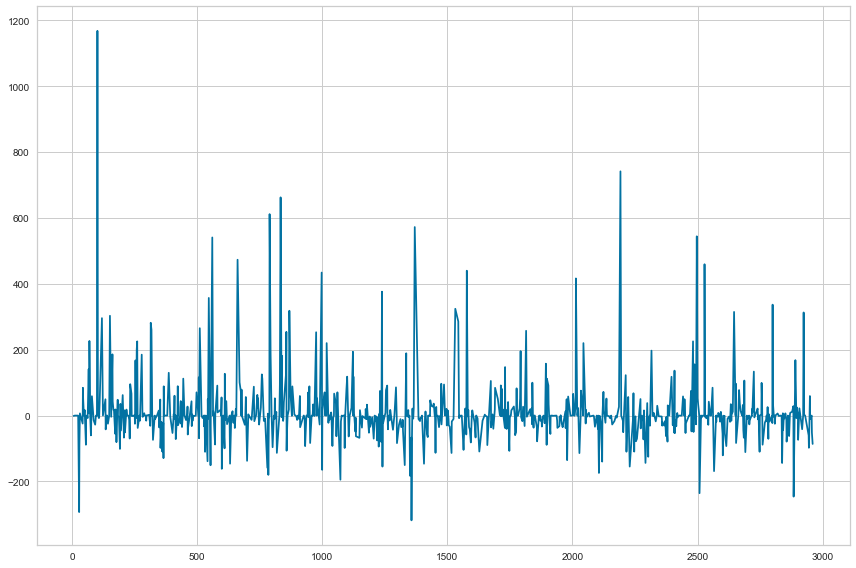

In [240]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

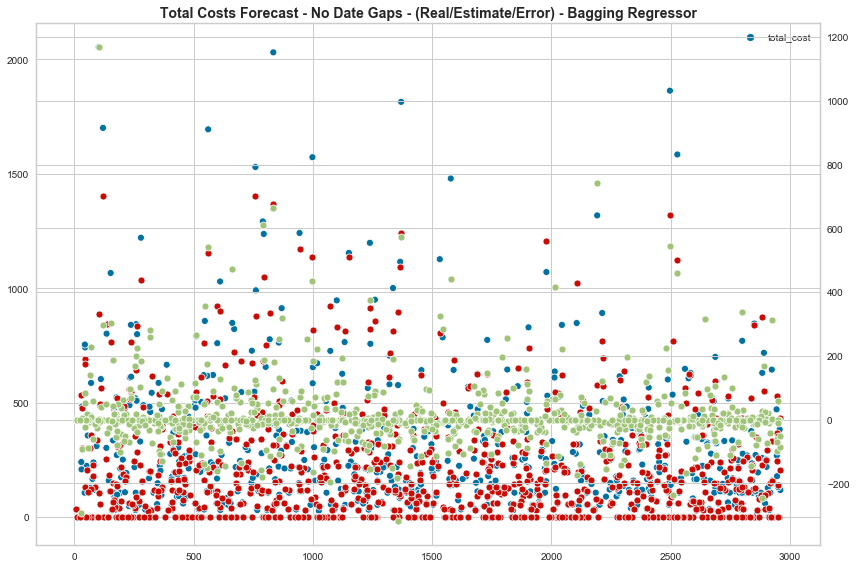

In [241]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - Bagging Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_scatter_bgr')
plt.show()

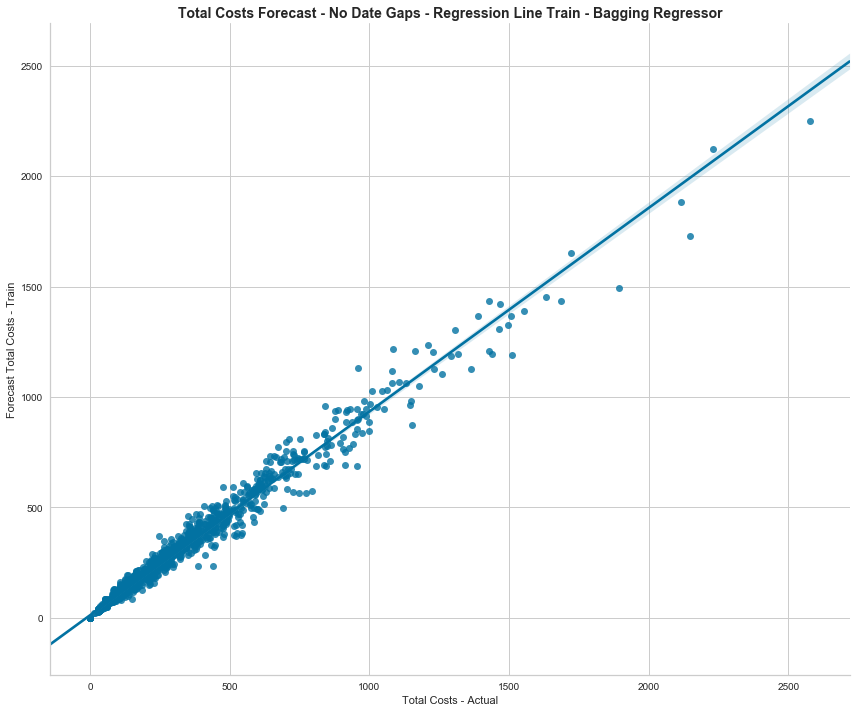

In [242]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - Bagging Regressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_train_bgr')
plt.show()

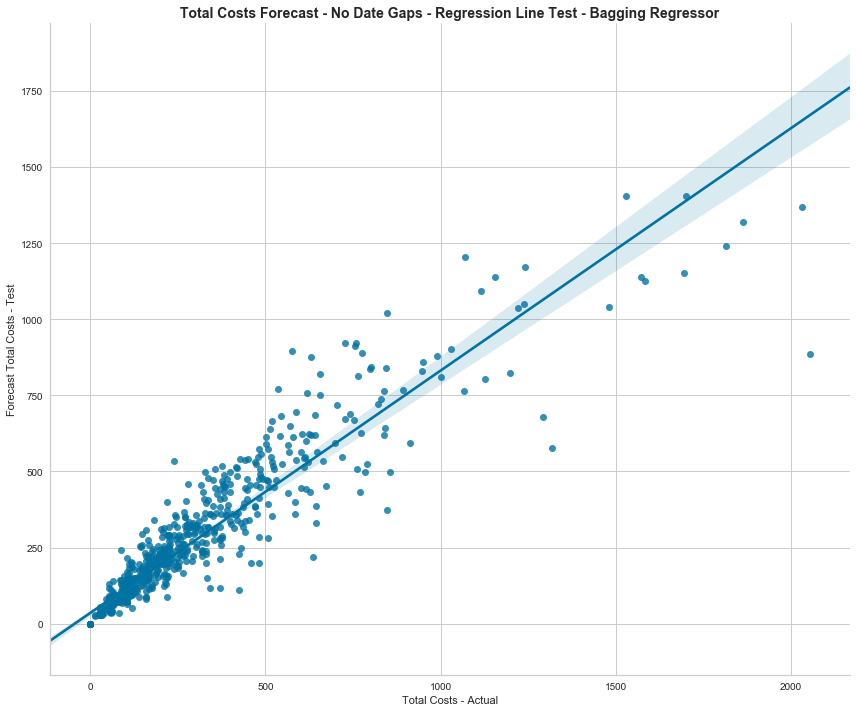

In [243]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - Bagging Regressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_test_bgr')
plt.show()

# ExtraTree Regressor model

In [171]:
np.random.seed(42)
#create a dictionary of all values we want to test
param_grid = {'max_depth': np.arange(2, 200,50), 'n_estimators': np.arange(10, 200, 50)}

# Random Forest Classifier model
et = ExtraTreesRegressor()

#use gridsearch to test all values
et_gscv = GridSearchCV(et, param_grid, cv=num_folds, scoring=scoring)

#fit model to data
et_gscv.fit(trainX, trainy)
print('Best parameters : ', et_gscv.best_params_)
print('Best score      : ', et_gscv.best_score_)

Best parameters :  {'max_depth': 12, 'n_estimators': 110}
Best score      :  -0.0498436509749894


# Observation

Based on the grid search above, the best parameter for the Extra tree regressor is:
    * Best parameters found:  {'bootstrap': True, 'bootstrap_features': False, 'max_features': 51, 'max_samples': 46, 
    * 'n_estimators': 750, 'n_jobs': 10, 'verbose': 1}
    * Lowest RMSE found:  0.9577430241931608

In [420]:
# Modeling based on the outcome of the grid serach of Random Forest Regressor
et = ExtraTreesRegressor(max_depth=12, n_estimators=750, max_features=51, max_samples=46)

et.fit(trainX, trainy)

# Predict on test set
yhat_train = et.predict(trainX)

# Predict on test set
yhat = et.predict(testX)

# Calculate Cross valdation scores
scores_et = cross_val_score(et, testX, testy, cv=num_folds, scoring=scoring)

print('ExtraTree Regressor Train r2 score - Transformed : %.5f' % r2_score(trainy, yhat_train))
print('ExtraTree Regressor Test r2 score - Transformed  : %.5f' % r2_score(testy, yhat))
yhat_train_mse1 = mean_squared_error(trainy, yhat_train)
yhat_test_mse1 = mean_squared_error(testy, yhat)
yhat_train_rmse1 = np.sqrt(yhat_train_mse1)
yhat_test_rmse1 = np.sqrt(yhat_test_mse1)
print('ExtraTree Regressor Train MSE - Transformed      : %.5f' % yhat_train_mse1)
print('ExtraTree Regressor Test MSE - Transformed       : %.5f' % yhat_test_mse1)
print('ExtraTree Regressor Train RMSE - Transformed     : %.5f' % yhat_train_rmse1)
print('ExtraTree Regressor Test RMSE - Transformed      : %.5f' % yhat_test_rmse1)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_bgr)), y=np.sqrt(np.abs(scores_bgr)), labels={'y':'RMSE'}, title=var_to_predict_title+ '- ExtratTreeRegressor - RMSE Cross Validation Scores - Transformed')
fig.write_image('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_et_crossv.png')
fig.show()

ExtraTree Regressor Train r2 score - Transformed : 0.99694
ExtraTree Regressor Test r2 score - Transformed  : 0.96414
ExtraTree Regressor Train MSE - Transformed      : 0.00303
ExtraTree Regressor Test MSE - Transformed       : 0.03667
ExtraTree Regressor Train RMSE - Transformed     : 0.05504
ExtraTree Regressor Test RMSE - Transformed      : 0.19149


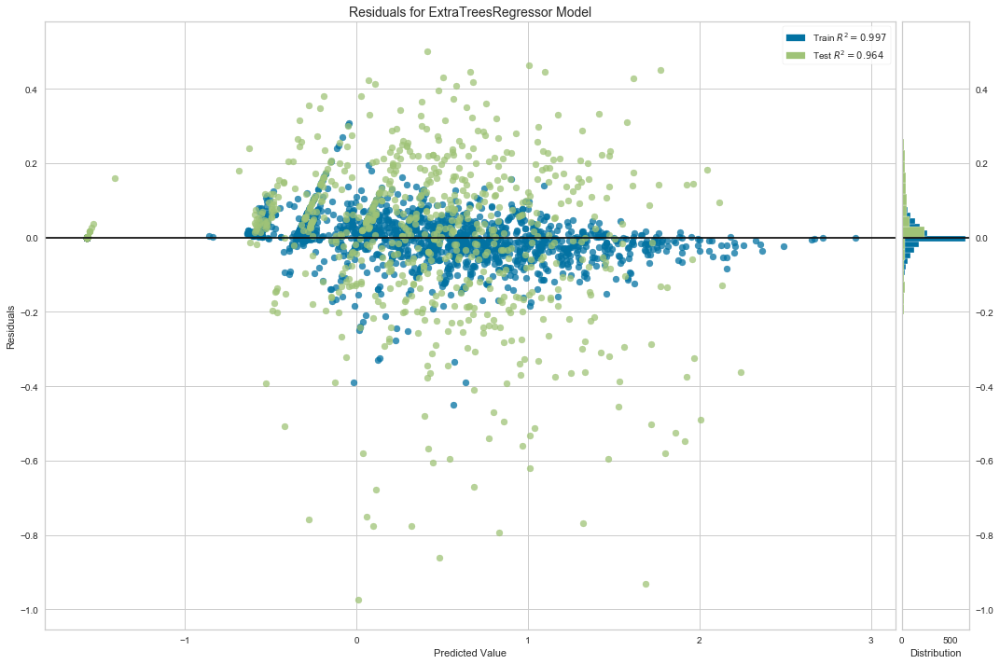

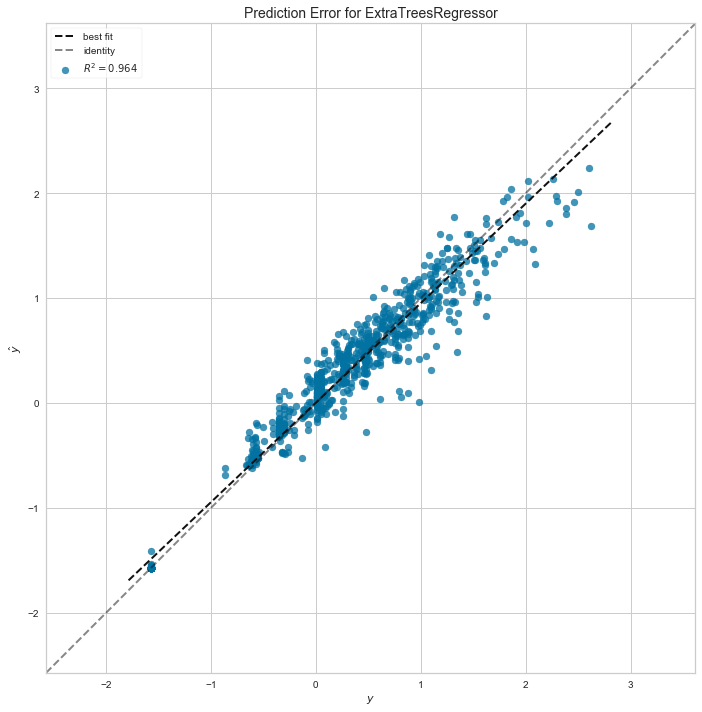

In [421]:
# Residual Plot and predictor error plot
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

visualizer = ResidualsPlot(et, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_residuals_et.png')
plt.show()


visualizer = PredictionError(et, is_fitted=True, size=(1180, 720))
visualizer.fit(trainX, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_predictor_error_et.png')
plt.show()

In [422]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat = pd.DataFrame(data=scaler_y.inverse_transform(yhat.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('ExtraTreeRegressor Train r2 score         : %.5f' % r2_score(un_trainy, un_yhat_train))
print('ExtraTreeRegressor Test  r2 score         : %.5f' % r2_score(un_testy, un_yhat))
un_yhat_train_mse1 = mean_squared_error(un_trainy, un_yhat_train)
un_yhat_test_mse1 = mean_squared_error(un_testy, un_yhat)
un_yhat_train_rmse1 = np.sqrt(un_yhat_train_mse1)
un_yhat_test_rmse1 = np.sqrt(un_yhat_test_mse1)
print('ExtraTreeRegressor  Train MSE             : %.5f' % un_yhat_train_mse1)
print('ExtraTreeRegressor  Test MSE              : %.5f' % un_yhat_test_mse1)
print('ExtraTreeRegressor  Train RMSE            : %.5f' % un_yhat_train_rmse1)
print('ExtraTreeRegressor  Test RMSE             : %.5f' % un_yhat_test_rmse1)
print('ExtraTreeRegressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('ExtraTreeRegressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())

ExtraTreeRegressor Train r2 score         : 0.99475
ExtraTreeRegressor Test  r2 score         : 0.85666
ExtraTreeRegressor  Train MSE             : 389.71209
ExtraTreeRegressor  Test MSE              : 11662.07367
ExtraTreeRegressor  Train RMSE            : 19.74113
ExtraTreeRegressor  Test RMSE             : 107.99108
ExtraTreeRegressor  Train Mean FCST Error : 0.00000
ExtraTreeRegressor  Test Mean FCST Error  : 12.84788


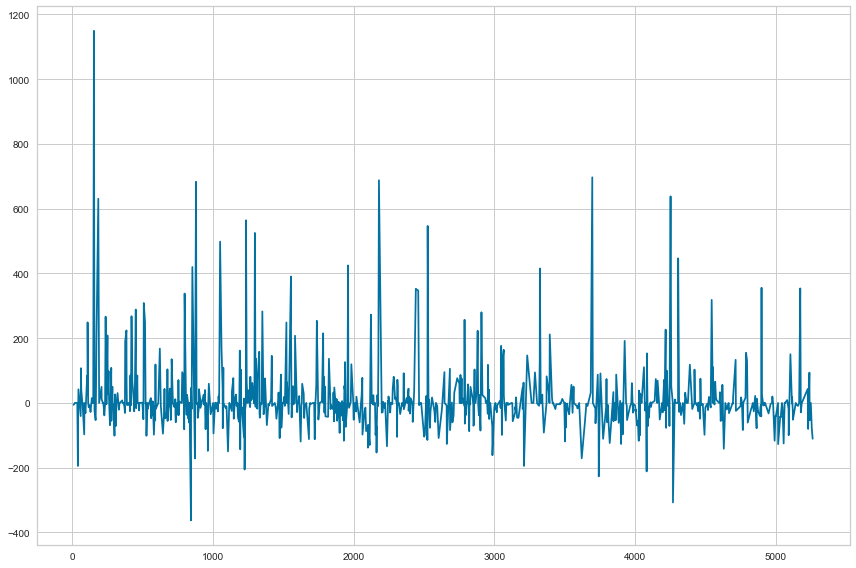

In [423]:
sns.lineplot(data=df_test['FCST Error Test'])
plt.show()

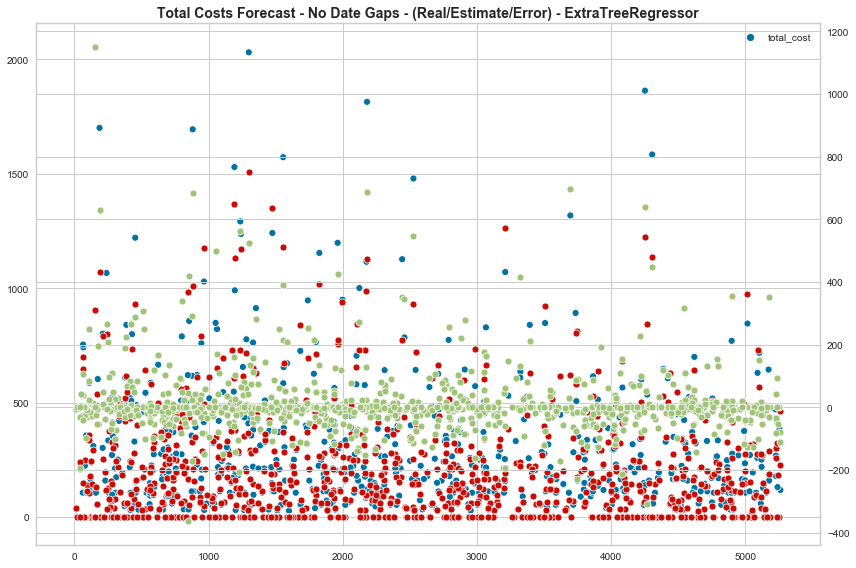

In [424]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
sns.scatterplot(data=df_test[var_to_predict], color="b", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Total Cost Test'], color="r", legend='full', ax=ax1)
sns.scatterplot(data=df_test['FCST Error Test'], color="g", legend='full', ax=ax2)
plt.title(var_to_predict_title+ ' - (Real/Estimate/Error) - ExtraTreeRegressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_scatter_et')
plt.show()

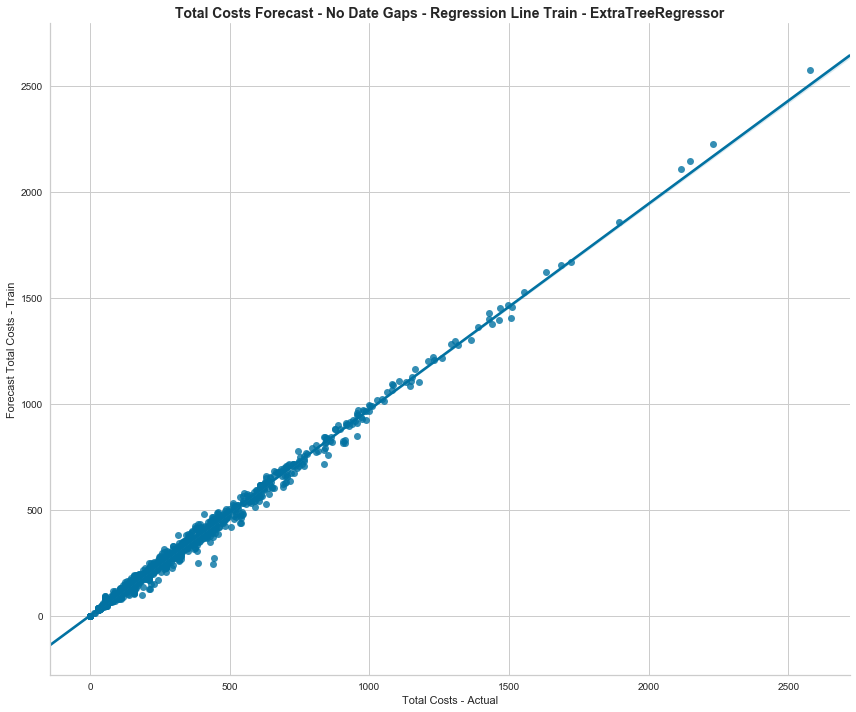

In [425]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - ExtraTreeRegressor',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_train_et')
plt.show()

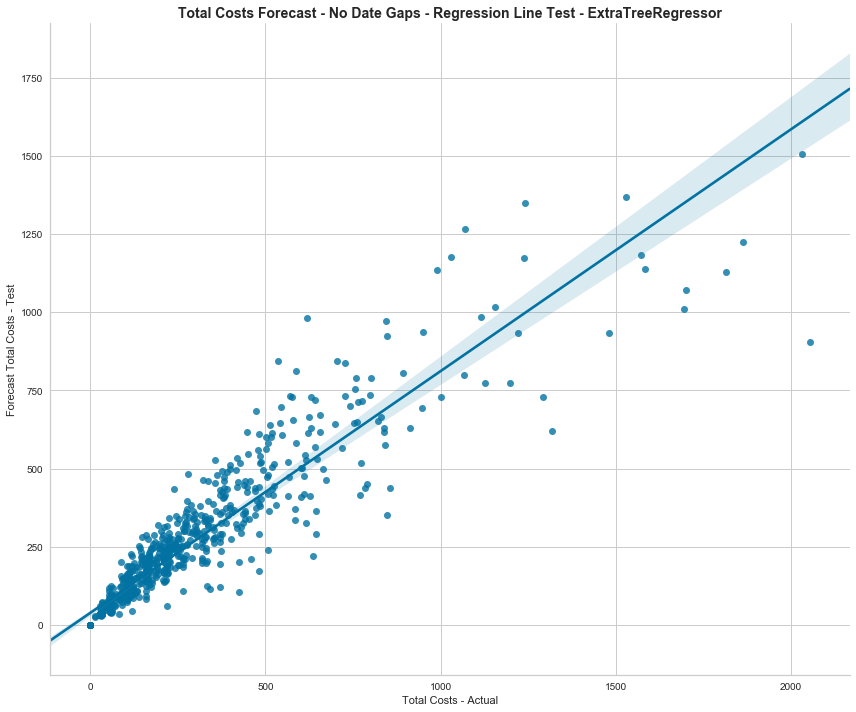

In [426]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - ExtraTreeRegressor',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_test_et')
plt.show()

# Select From model - Reduce dimensionality
Reduce the number of features

In [427]:
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
from sklearn.ensemble import VotingClassifier
from sklearn.feature_selection import RFECV

print("Number of feature before reduction : ",trainX.shape[1])
# Going to use XGBoost model built previously as it has 2nd best accuracy
model = SelectFromModel(et, prefit=True)
trainX_svc = model.transform(trainX)
print("Number of feature after reduction : ",trainX_svc.shape[1]) #reduction from 72 to 14 features
feature_idx = model.get_support()
feature_reduced = trainX.columns[feature_idx]
print('Features Selected using ExtraTree Regressor')
for i in range(len(feature_reduced)):
    print(i+1, " - ",feature_reduced[i])

Number of feature before reduction :  55
Number of feature after reduction :  6
Features Selected using ExtraTree Regressor
1  -  total_calls
2  -  total_tow_miles
3  -  mean_basic_cost
4  -  sc_vehicle_manufacturer_name_standard_end_vehicle
5  -  aaa_motorcycle_indicator_0_0
6  -  aaa_motorcycle_indicator_1_0


In [428]:
# Modeling based on the outcome of the grid serach of the random forest
np.random.seed(42)
trainX_reduced = pd.DataFrame(trainX, columns=feature_reduced, index=trainX.index)
testX_reduced = pd.DataFrame(testX, columns=feature_reduced, index=testX.index)

xgbr_reduced = XGBRegressor(silent=True, booster='gbtree', learning_rate=0.05, max_depth=3, n_estimators=1000, 
                   gamma=0)

xgbr_reduced.fit(trainX_reduced, trainy)

# Predict on test set
yhat_train_reduced = xgbr_reduced.predict(trainX_reduced)

# Predict on test set
yhat_reduced = xgbr_reduced.predict(testX_reduced)

# Calculate Cross valdation scores
scores_xgbr_reduced = cross_val_score(xgbr_reduced, testX_reduced, testy, cv=num_folds, scoring=scoring)

print('XGBoost Classifer Train r2 score - Reduced Features - Transformed : %.5f' % r2_score(trainy, yhat_train_reduced))
print('XGBoost Classifer Test r2 score - Reduced Features - Transformed  : %.5f' % r2_score(testy, yhat_reduced))
yhat_train_mse1_reduced = mean_squared_error(trainy, yhat_train_reduced)
yhat_test_mse1_reduced = mean_squared_error(testy, yhat_reduced)
yhat_train_rmse1_reduced = np.sqrt(yhat_train_mse1_reduced)
yhat_test_rmse1_reduced = np.sqrt(yhat_test_mse1_reduced)
print('XGBoost Classifer  Train MSE - Reduced Features - Transformed    : %.5f' % yhat_train_mse1_reduced)
print('XGBoost Classifer  Test MSE - Reduced Features - Transformed     : %.5f' % yhat_test_mse1_reduced)
print('XGBoost Classifer  Train RMSE - Reduced Features - Transformed   : %.5f' % yhat_train_rmse1_reduced)
print('XGBoost Classifer  Test RMSE - Reduced Features - Transformed    : %.5f' % yhat_test_rmse1_reduced)

# Plot Cross Validation RMSE Scores
fig = px.line(np.sqrt(np.abs(scores_xgbr_reduced)), y=np.sqrt(np.abs(scores_xgbr_reduced)), labels={'y':'RMSE'}, title=var_to_predict_title+ ' - RMSE Cross Validation Scores - Reduced Features - Transformed')
fig.write_image('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_xgbr_crossv_reduced.png')
fig.show()

XGBoost Classifer Train r2 score - Reduced Features - Transformed : 0.96761
XGBoost Classifer Test r2 score - Reduced Features - Transformed  : 0.94277
XGBoost Classifer  Train MSE - Reduced Features - Transformed    : 0.03207
XGBoost Classifer  Test MSE - Reduced Features - Transformed     : 0.05852
XGBoost Classifer  Train RMSE - Reduced Features - Transformed   : 0.17908
XGBoost Classifer  Test RMSE - Reduced Features - Transformed    : 0.24190


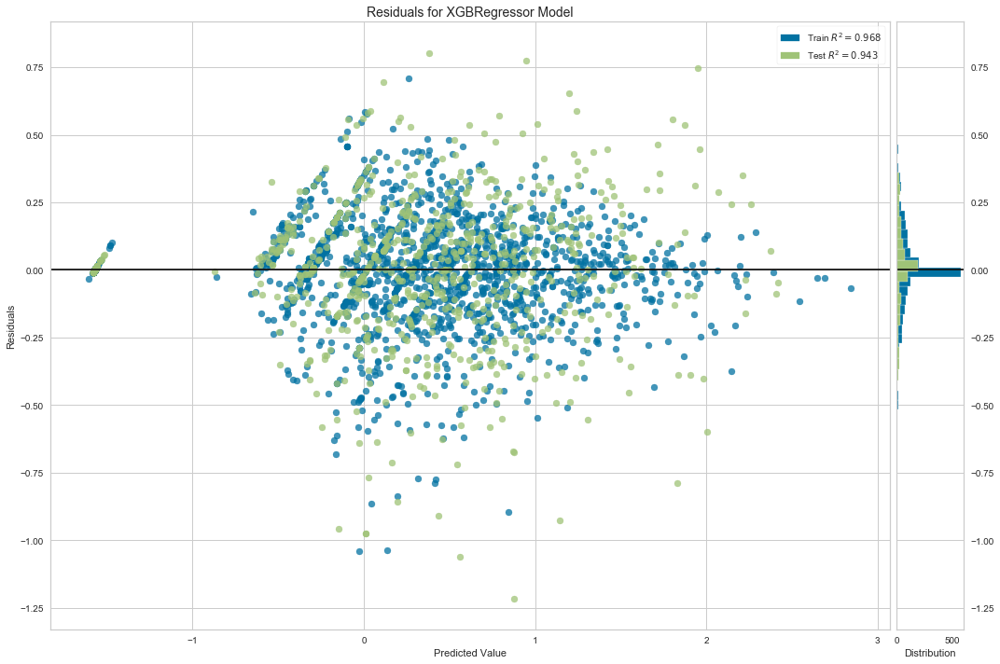

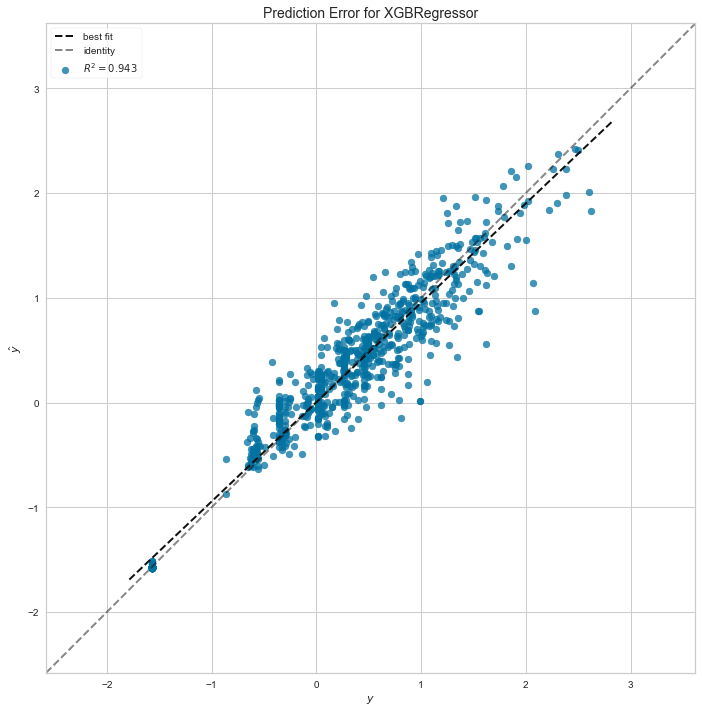

In [429]:
# Residual Plot and predictor error plot
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError

visualizer = ResidualsPlot(xgbr_reduced, is_fitted=True, size=(1080, 720))
visualizer.fit(trainX_reduced, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX_reduced, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_residuals_xgbr_reduced.png')
plt.show()


visualizer = PredictionError(xgbr_reduced, is_fitted=True, size=(1180, 720))
visualizer.fit(trainX_reduced, trainy[var_to_predict[0]])  # Fit the training data to the visualizer
visualizer.score(testX_reduced, testy[var_to_predict[0]])  # Evaluate the model on the test data
visualizer.show(outpath='./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_predictor_error_xgbr_reduced.png')
plt.show()

In [430]:
# Untransformed series
un_trainy = trainy.copy()
un_trainy[var_to_predict] = scaler_y.inverse_transform(un_trainy) 

un_testy = testy.copy()
un_testy[var_to_predict] = scaler_y.inverse_transform(un_testy) 

un_yhat_train_reduced = pd.DataFrame(data=scaler_y.inverse_transform(yhat_train_reduced.reshape(-1, 1)), 
                                  index=trainy.index, columns=var_to_predict) 

un_yhat_reduced = pd.DataFrame(data=scaler_y.inverse_transform(yhat_reduced.reshape(-1, 1)), 
                                  index=testy.index, columns=var_to_predict) 

# Build Training Dataframe
df_train = un_trainy.copy()
df_train['FCST Total Cost Train'] = un_yhat_train_reduced[var_to_predict]
df_train['FCST Error Train'] = un_yhat_train_reduced[var_to_predict]
df_train['FCST Error Train'] -= df_train['FCST Total Cost Train']

# Build test dataframe
df_test = un_testy.copy()
df_test['FCST Total Cost Test'] = un_yhat_reduced[var_to_predict]
df_test['FCST Error Test'] = df_test[var_to_predict]
df_test['FCST Error Test'] -= df_test['FCST Total Cost Test']

print('XGBoostRegressor Train r2 score         : %.5f' % r2_score(un_trainy, un_yhat_train_reduced))
print('XGBoostRegressor Test  r2 score         : %.5f' % r2_score(un_testy, un_yhat_reduced))
un_yhat_train_mse1_reduced = mean_squared_error(un_trainy, un_yhat_train_reduced)
un_yhat_test_mse1_reduced = mean_squared_error(un_testy, un_yhat_reduced)
un_yhat_train_rmse1_reduced = np.sqrt(un_yhat_train_mse1_reduced)
un_yhat_test_rmse1_reduced = np.sqrt(un_yhat_test_mse1_reduced)
print('XGBoostRegressor  Train MSE             : %.5f' % un_yhat_train_mse1_reduced)
print('XGBoostRegressor  Test MSE              : %.5f' % un_yhat_test_mse1_reduced)
print('XGBoostRegressor  Train RMSE            : %.5f' % un_yhat_train_rmse1_reduced)
print('XGBoostRegressor  Test RMSE             : %.5f' % un_yhat_test_rmse1_reduced)
print('XGBoostRegressor  Train Mean FCST Error : %.5f' % df_train['FCST Error Train'].mean())
print('XGBoostRegressor  Test Mean FCST Error  : %.5f' % df_test['FCST Error Test'].mean())

XGBoostRegressor Train r2 score         : 0.94130
XGBoostRegressor Test  r2 score         : 0.82506
XGBoostRegressor  Train MSE             : 4357.71701
XGBoostRegressor  Test MSE              : 14232.98828
XGBoostRegressor  Train RMSE            : 66.01301
XGBoostRegressor  Test RMSE             : 119.30209
XGBoostRegressor  Train Mean FCST Error : 0.00000
XGBoostRegressor  Test Mean FCST Error  : 7.31793


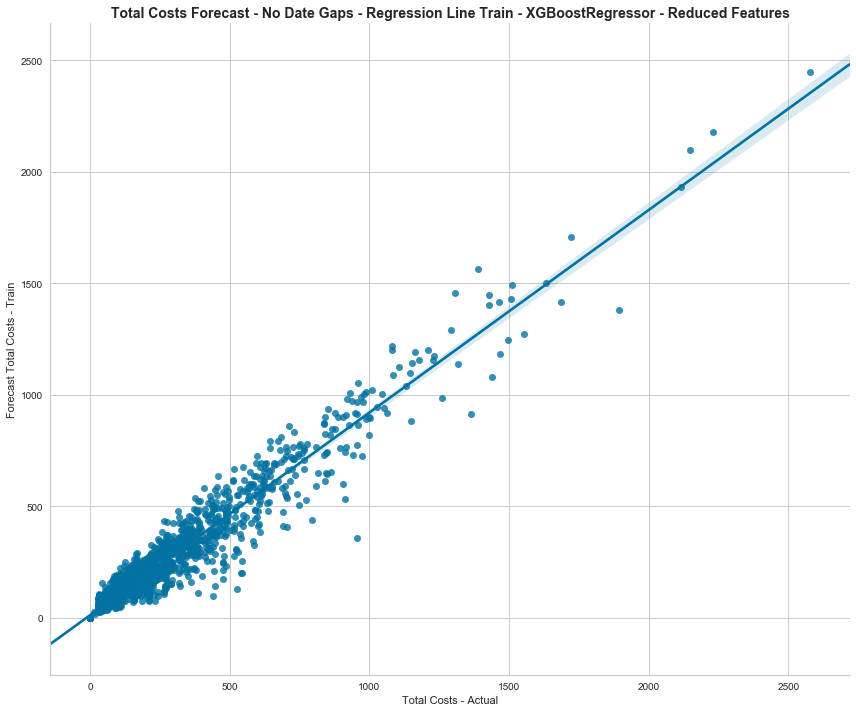

In [431]:
# Graph Train prediction
sns.set_style("whitegrid", {'axes.grid' : True})
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Train', data=df_train, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Train") 
plt.title(var_to_predict_title+ ' - Regression Line Train - XGBoostRegressor - Reduced Features',fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_train_xgbr_reduced')
plt.show()

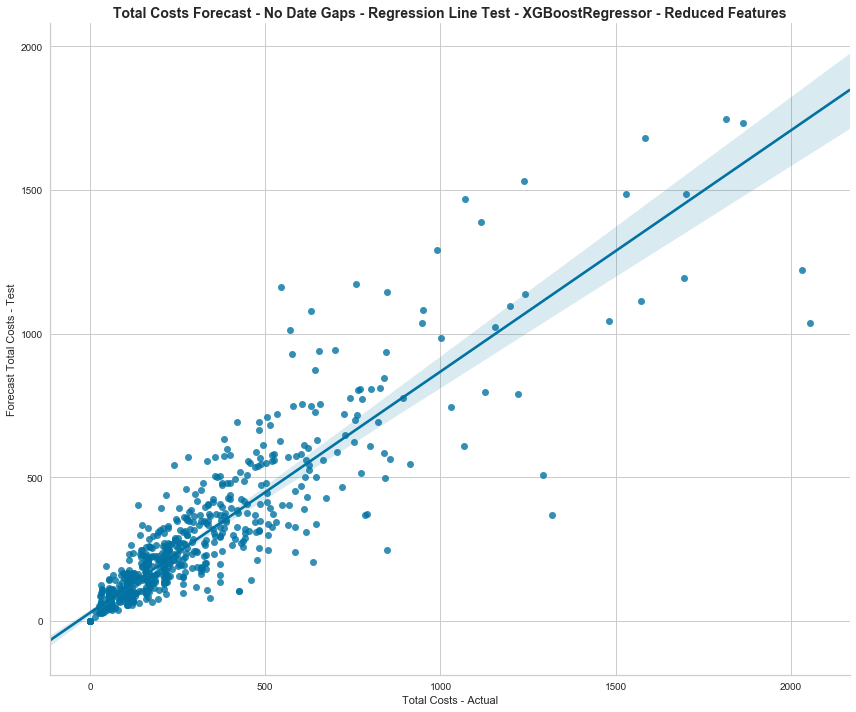

In [432]:
# Graph Test prediction
g = sns.lmplot(x=var_to_predict[0], y='FCST Total Cost Test', data=df_test, height=10, aspect=1.2)
g.set_axis_labels("Total Costs - Actual", "Forecast Total Costs - Test") 
plt.title(var_to_predict_title+ ' - Regression Line Test - XGBoostRegressor - Reduced Features',
          fontdict={'fontsize':14, 'fontweight':'bold'})
plt.savefig('./model_pics/total_cost_no_gaps/'+var_to_predict_save+'_fcst_test_xgbr_reduced')
plt.show()

In [433]:
# Concatenate test and train
df_conca = pd.concat([df_train, df_test])
df_conca.replace(np.nan, 0, inplace=True )
df_conca['estimated_cost'] = df_conca['FCST Total Cost Train'] + df_conca['FCST Total Cost Test']
df_conca['membership_id'] = df_household['membership_id']

In [437]:
# Verify is there is no nulls
df_conca[df_conca.isnull().any(axis=1)]

,FCST Error Test,FCST Error Train,FCST Total Cost Test,FCST Total Cost Train,total_cost,estimated_cost,membership_id


In [439]:
# Save all Data and final models
filename = './save_models/'+var_to_predict_save+'_finalized_model_xgbr.sav'
pickle.dump(xgbr_reduced, open(filename, 'wb'))

# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(testX_reduced, testy)
print(result)

filename = var_to_predict_save+'_reduced_feature_outcome.csv'
save_data(df_conca,filename)

0.9427688097324323


# Keras Regressor Modeling

In [191]:
# Keras Classifier
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential
from keras.layers import Dense

np.random.seed(42)
# Create input and output dataframes

# define base model
def baseline_model():
    # create model
    model = Sequential()
    model.add(Dense(50, input_dim=trainX.shape[1], kernel_initializer='normal', activation='relu'))
    model.add(Dense(25, activation='relu'))
    model.add(Dense(1, kernel_initializer='normal'))
    # Compile model
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# evaluate model
estimator = KerasRegressor(build_fn=baseline_model, epochs=100, batch_size=10, verbose=1)

kfold = KFold(n_splits=num_folds)
results = cross_val_score(estimator, trainX, trainy, cv=kfold)
print("Keras Regressor Baseline: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Epoch 1/100
1864/1864 [==============================] - 1s 488us/step - loss: 0.3471
Epoch 2/100
1864/1864 [==============================] - 1s 270us/step - loss: 0.0962 0s - los
Epoch 3/100
1864/1864 [==============================] - 0s 217us/step - loss: 0.0682
Epoch 4/100
1864/1864 [==============================] - 0s 173us/step - loss: 0.0586
Epoch 5/100
1864/1864 [==============================] - 0s 190us/step - loss: 0.0503
Epoch 6/100
1864/1864 [==============================] - 0s 171us/step - loss: 0.0460
Epoch 7/100
1864/1864 [==============================] - 0s 168us/step - loss: 0.0419
Epoch 8/100
1864/1864 [==============================] - 0s 173us/step - loss: 0.0393
Epoch 9/100
1864/1864 [==============================] - 0s 189us/step - loss: 0.0360
Epoch 10/100
1864/1864 [==============================] - 0s 167us/step - loss: 0.0341
Epoch 11/100
1864/1864 [==============================] - 0s 174us/step - loss: 0.0312
Epoch 12/100
1864/1864 [===================

1864/1864 [==============================] - 0s 182us/step - loss: 0.0033
Epoch 96/100
1864/1864 [==============================] - 0s 169us/step - loss: 0.0037
Epoch 97/100
1864/1864 [==============================] - 0s 157us/step - loss: 0.0038
Epoch 98/100
1864/1864 [==============================] - 0s 183us/step - loss: 0.0036
Epoch 99/100
1864/1864 [==============================] - 0s 160us/step - loss: 0.0033
Epoch 100/100
208/208 [==============================] - 0s 317us/step
Epoch 1/100
1864/1864 [==============================] - 1s 381us/step - loss: 0.3464
Epoch 2/100
1864/1864 [==============================] - 0s 165us/step - loss: 0.1018
Epoch 3/100
1864/1864 [==============================] - 0s 168us/step - loss: 0.0701
Epoch 4/100
1864/1864 [==============================] - 0s 180us/step - loss: 0.0595
Epoch 5/100
1864/1864 [==============================] - 0s 171us/step - loss: 0.0533
Epoch 6/100
1864/1864 [==============================] - 0s 161us/step - loss

1865/1865 [==============================] - 0s 172us/step - loss: 0.0056
Epoch 82/100
1865/1865 [==============================] - 0s 166us/step - loss: 0.0047
Epoch 83/100
1865/1865 [==============================] - 0s 186us/step - loss: 0.0045
Epoch 84/100
1865/1865 [==============================] - 0s 165us/step - loss: 0.0042
Epoch 85/100
1865/1865 [==============================] - 0s 164us/step - loss: 0.0045
Epoch 86/100
1865/1865 [==============================] - 0s 166us/step - loss: 0.0051
Epoch 87/100
1865/1865 [==============================] - 0s 232us/step - loss: 0.0042
Epoch 88/100
1865/1865 [==============================] - 0s 195us/step - loss: 0.0048
Epoch 89/100
1865/1865 [==============================] - 0s 236us/step - loss: 0.0048
Epoch 90/100
1865/1865 [==============================] - 0s 242us/step - loss: 0.0049
Epoch 91/100
1865/1865 [==============================] - 0s 215us/step - loss: 0.0047
Epoch 92/100
1865/1865 [==============================] 

1865/1865 [==============================] - 0s 170us/step - loss: 0.0054
Epoch 68/100
1865/1865 [==============================] - 0s 208us/step - loss: 0.0049
Epoch 69/100
1865/1865 [==============================] - 0s 246us/step - loss: 0.0048
Epoch 70/100
1865/1865 [==============================] - 0s 192us/step - loss: 0.0041
Epoch 71/100
1865/1865 [==============================] - 0s 191us/step - loss: 0.0042
Epoch 72/100
1865/1865 [==============================] - 0s 161us/step - loss: 0.0042
Epoch 73/100
1865/1865 [==============================] - 0s 174us/step - loss: 0.0046
Epoch 74/100
1865/1865 [==============================] - 0s 161us/step - loss: 0.0055
Epoch 75/100
1865/1865 [==============================] - 0s 187us/step - loss: 0.0056
Epoch 76/100
1865/1865 [==============================] - 0s 160us/step - loss: 0.0048
Epoch 77/100
1865/1865 [==============================] - 0s 204us/step - loss: 0.0049
Epoch 78/100
1865/1865 [==============================] 

1865/1865 [==============================] - 0s 164us/step - loss: 0.0071
Epoch 54/100
1865/1865 [==============================] - 0s 156us/step - loss: 0.0074
Epoch 55/100
1865/1865 [==============================] - 0s 208us/step - loss: 0.0066
Epoch 56/100
1865/1865 [==============================] - 0s 247us/step - loss: 0.0062
Epoch 57/100
1865/1865 [==============================] - 0s 184us/step - loss: 0.0065
Epoch 58/100
1865/1865 [==============================] - 0s 206us/step - loss: 0.0065
Epoch 59/100
1865/1865 [==============================] - 0s 176us/step - loss: 0.0068
Epoch 60/100
1865/1865 [==============================] - 0s 158us/step - loss: 0.0066
Epoch 61/100
1865/1865 [==============================] - 0s 216us/step - loss: 0.0074
Epoch 62/100
1865/1865 [==============================] - 0s 206us/step - loss: 0.0069
Epoch 63/100
1865/1865 [==============================] - 0s 171us/step - loss: 0.0067 0s - loss: 0
Epoch 64/100
1865/1865 [===================

1865/1865 [==============================] - 0s 219us/step - loss: 0.0074
Epoch 40/100
1865/1865 [==============================] - 0s 160us/step - loss: 0.0073
Epoch 41/100
1865/1865 [==============================] - 0s 201us/step - loss: 0.0093
Epoch 42/100
1865/1865 [==============================] - 0s 159us/step - loss: 0.0078
Epoch 43/100
1865/1865 [==============================] - 0s 159us/step - loss: 0.0076
Epoch 44/100
1865/1865 [==============================] - 0s 165us/step - loss: 0.0073
Epoch 45/100
1865/1865 [==============================] - 0s 182us/step - loss: 0.0071
Epoch 46/100
1865/1865 [==============================] - 0s 164us/step - loss: 0.0067
Epoch 47/100
1865/1865 [==============================] - 0s 158us/step - loss: 0.0075
Epoch 48/100
1865/1865 [==============================] - 0s 191us/step - loss: 0.0070
Epoch 49/100
1865/1865 [==============================] - 0s 159us/step - loss: 0.0064
Epoch 50/100
1865/1865 [==============================] 

# Forecast total incident costs

In [12]:
import statsmodels.api as sm
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.stattools import adfuller, kpss, acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose 
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

In [13]:
# Line chart
df_ts = pd.DataFrame(df_transaction, columns=['membership_id','call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('W').sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_ts_1.index, y=df_ts_1[var_to_predict[0]],
                        text=df_ts_1[var_to_predict], 
                        mode='lines+markers',
                        name='Total Costs'))
fig.update_layout(autosize=False, title_text='Time Series Analysis by Week - Total Costs',
                      xaxis_rangeslider_visible=True, height=700, width=900)
fig.show()

In [14]:
# Create a Naive Forecast
def naive_fcst(df, my_col, crecimiento, porc_train):
    
    # preparar los datos para hacer el Naive Forecast
    X = df[my_col].values
    X = X.astype('float32')
    train_size = int(len(X) * porc_train)
    train, test = X[0:train_size], X[train_size:]
    # walk-forward validation
    history = [x for x in train]
    predictions = list()
    for i in range(len(test)):
        # predict
        yhat = history[-1] + round(history[-1]*crecimiento,0)
        predictions.append(yhat)
        # observation
        obs = test[i]
        history.append(obs)
        print('Date: {}'.format(df.index.values[i]), '>Predicted=%.3f, Expected=%3.f' % (yhat, obs))
    # report performance
    rmse = sqrt(mean_squared_error(test, predictions))
    mse = mean_squared_error(test,predictions)
    mae = mean_absolute_error(test, predictions)
    r2 = r2_score(test, predictions)
    print('Porc. Sample used        : %.3f' % train_size)
    print('Porc. of expected growth : %.3f' % crecimiento)
    print('RMSE                 : %.3f' % rmse)
    print('MSE                  : %.3f' % mse)
    print('MAE                  : %.3f' % mae)
    print('R2 Score             : %.3f' % r2)
    return

In [15]:
naive_fcst(df_ts_1, var_to_predict[0], 0.03, 0.30)

Date: 2014-06-01T00:00:00.000000000 >Predicted=2337.000, Expected=3298
Date: 2014-06-08T00:00:00.000000000 >Predicted=3397.000, Expected=2205
Date: 2014-06-15T00:00:00.000000000 >Predicted=2271.000, Expected=2837
Date: 2014-06-22T00:00:00.000000000 >Predicted=2922.000, Expected=2027
Date: 2014-06-29T00:00:00.000000000 >Predicted=2088.000, Expected=2533
Date: 2014-07-06T00:00:00.000000000 >Predicted=2609.000, Expected=3535
Date: 2014-07-13T00:00:00.000000000 >Predicted=3641.000, Expected=5265
Date: 2014-07-20T00:00:00.000000000 >Predicted=5423.000, Expected=2620
Date: 2014-07-27T00:00:00.000000000 >Predicted=2699.000, Expected=2304
Date: 2014-08-03T00:00:00.000000000 >Predicted=2373.000, Expected=2256
Date: 2014-08-10T00:00:00.000000000 >Predicted=2324.000, Expected=2270
Date: 2014-08-17T00:00:00.000000000 >Predicted=2338.000, Expected=1917
Date: 2014-08-24T00:00:00.000000000 >Predicted=1975.000, Expected=2009
Date: 2014-08-31T00:00:00.000000000 >Predicted=2069.000, Expected=2375
Date: 

In [16]:
# Create Partitions of test and train
df_ts = pd.DataFrame(df_transaction, columns=['call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df_ts['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df_ts['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df_ts = df_ts[(df_ts.member_status != 'CANCELLED')]
df_ts.set_index('call_status_recv_date', inplace=True)
df_ts_1 = df_ts.resample('W').sum()

Train = df_ts_1.loc['2014-06-01':'2018-09-30'] 
valid = df_ts_1.loc['2018-10-01':'2019-10-31']

   
# Create partitions
Train_diff = Train.copy()
Train_diff[var_to_predict] = Train[var_to_predict].diff()
Train_diff = Train_diff.iloc[1:]
#Train_diff = Train_diff[~(Train_diff.cant_pht==0)]

valid_diff = valid.copy()
valid_diff[var_to_predict] = valid[var_to_predict].diff()
#valid_log_diff = valid_log_diff.iloc[1:]
valid_diff.ix[0,var_to_predict[0]] = valid.ix[0,var_to_predict[0]] - Train.ix[len(Train)-1,var_to_predict[0]]
#valid_diff = valid_diff[~(valid_diff.cant_pht==0)]

# Crear las particiones de logaritmicas de prueba y validación
Train_log = Train.copy()
Train_log[var_to_predict] = np.log(Train_log[var_to_predict])
# Remove +- inf value and replace with 0
Train_log[var_to_predict] = Train_log[var_to_predict].replace(-np.inf,0)
Train_log[var_to_predict] = Train_log[var_to_predict].replace(np.inf,0)
#Train_log = Train_log[~(Train_log.cant_pht==0)]

valid_log = valid.copy()
valid_log[var_to_predict] = np.log(valid_log[var_to_predict])
#valid_log = valid_log[~(valid_log.cant_pht==0)]
# Remove +- inf value and replace with 0
valid_log[var_to_predict] = valid_log[var_to_predict].replace(-np.inf,0)
valid_log[var_to_predict] = valid_log[var_to_predict].replace(np.inf,0)

# Crear las particiones de diff logaritmicas de prueba y validación
Train_log_diff = Train_log.copy()
Train_log_diff[var_to_predict] = Train_log[var_to_predict].diff()
Train_log_diff = Train_log_diff.iloc[1:]
#Train_log_diff = Train_log_diff[~(Train_log_diff.cant_pht==0)]

valid_log_diff = valid_log.copy()
valid_log_diff[var_to_predict] = valid_log[var_to_predict].diff()
valid_log_diff.ix[0,var_to_predict] = valid_log.ix[0,var_to_predict] - Train_log.ix[len(Train_log)-1,var_to_predict]
#valid_log_diff = valid_log_diff[~(valid_log_diff.cant_pht==0)]


In [17]:
# Extraer datos 
df = pd.DataFrame(Train, columns=var_to_predict)
df = df.resample("W").sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Train",
                         line_color='deepskyblue'))


df = pd.DataFrame(valid, columns=var_to_predict)
df = df.resample("W").sum()

fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Valid",
                         line_color='dimgray'))

fig.update_layout(title_text='AAA Northeast - Total Costs (Train/Test Time Series)',
                  xaxis_rangeslider_visible=True)
fig.show()

In [18]:
# Extraer datos 
df = pd.DataFrame(Train_diff, columns=var_to_predict)
df = df.resample("W").sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Train - Difference",
                         line_color='deepskyblue'))


df = pd.DataFrame(valid_diff, columns=var_to_predict)
df = df.resample("W").sum()

fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Valid - Difference",
                         line_color='dimgray'))

fig.update_layout(title_text='AAA Northeast - Total Costs (Train/Test difference Time Series)',
                  xaxis_rangeslider_visible=True)
fig.show()

In [19]:
# Extraer datos 
df = pd.DataFrame(Train_log, columns=var_to_predict)
df = df.resample("W").sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Train - Log",
                         line_color='deepskyblue'))


df = pd.DataFrame(valid_log, columns=var_to_predict)
df = df.resample("W").sum()

fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Valid - Log",
                         line_color='dimgray'))

fig.update_layout(title_text='AAA Northeast - Total Costs (Train/Test Logarithmic Time Series)',
                  xaxis_rangeslider_visible=True)
fig.show()

In [20]:
# Extraer datos 
df = pd.DataFrame(Train_log_diff, columns=var_to_predict)
df = df.resample("W").sum()
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Train - Log Diff",
                         line_color='deepskyblue'))


df = pd.DataFrame(valid_log_diff, columns=var_to_predict)
df = df.resample("W").sum()

fig.add_trace(go.Scatter(x=df.index, y=df[var_to_predict[0]], name="Valid - Log Diff",
                         line_color='dimgray'))

fig.update_layout(title_text='AAA Northeast - Total Costs (Train/Test Logarithmic Diff Time Series)',
                  xaxis_rangeslider_visible=True)
fig.show()

In [21]:
df = pd.DataFrame(Train, columns=[var_to_predict[0]])
mu = round(df[var_to_predict[0]].mean(),3)  # Medium 
sigma = round(df[var_to_predict[0]].std(),3)  # Standard Deviation 
num_bins = 10
t_title1 = 'AAA - NorthEast - Histogram Monthly Total cost ' + 'mu = '+str(mu) + ' sigma = '+str(sigma)

fig = px.histogram(df, x=var_to_predict[0], 
                   histnorm='probability density',
                   barmode='relative',
                   nbins=num_bins,
                   marginal="box",# box, violin, rug, histogram
                   ) 

fig.update_layout(
    title=t_title1,
    xaxis_title="Total Cost",
    yaxis_title="Probability Density",
    font=dict(
        family="Courier New, monospace",
        size=10,
        color="#7f7f7f"
    )
)
fig.show()

In [466]:
df = pd.DataFrame(Train_log, columns=[var_to_predict[0]])
mu = round(df[var_to_predict[0]].mean(),3)  # Medium 
sigma = round(df[var_to_predict[0]].std(),3)  # Standard Deviation 
num_bins = 10
t_title1 = 'LOG - AAA NorthEast - Histogram Mthly Total Cost  ' + 'mu = '+str(mu) + ' sigma = '+str(sigma)

fig = px.histogram(df, x=var_to_predict[0], 
                   histnorm='probability density',
                   barmode='relative',
                   nbins=num_bins,
                   marginal="box",# box, violin, rug, histogram
                   ) 

fig.update_layout(
    title=t_title1,
    xaxis_title="Total Cost",
    yaxis_title="Probability Density",
    font=dict(
        family="Courier New, monospace",
        size=10,
        color="#7f7f7f"
    )
)
fig.show()

In [467]:
df = pd.DataFrame(Train_diff, columns=[var_to_predict[0]])
mu = round(df[var_to_predict[0]].mean(),3)  # Medium 
sigma = round(df[var_to_predict[0]].std(),3)  # Standard Deviation 
num_bins = 10
t_title1 = 'Diff - AAA NorthEast - Histogram Mthly Total Cost  ' + 'mu = '+str(mu) + ' sigma = '+str(sigma)

fig = px.histogram(df, x=var_to_predict[0], 
                   histnorm='probability density',
                   barmode='relative',
                   nbins=num_bins,
                   marginal="box",# box, violin, rug, histogram
                   ) 

fig.update_layout(
    title=t_title1,
    xaxis_title="Total Cost",
    yaxis_title="Probability Density",
    font=dict(
        family="Courier New, monospace",
        size=10,
        color="#7f7f7f"
    )
)
fig.show()

In [468]:
df = pd.DataFrame(Train_log_diff, columns=[var_to_predict[0]])
mu = round(df[var_to_predict[0]].mean(),3)  # Medium 
sigma = round(df[var_to_predict[0]].std(),3)  # Standard Deviation 
num_bins = 10
t_title1 = 'LOG Diff - AAA NorthEast - Histogram Mthly Total Cost  ' + 'mu = '+str(mu) + ' sigma = '+str(sigma)

fig = px.histogram(df, x=var_to_predict[0], 
                   histnorm='probability density',
                   barmode='relative',
                   nbins=num_bins,
                   marginal="box",# box, violin, rug, histogram
                   ) 

fig.update_layout(
    title=t_title1,
    xaxis_title="Total Cost",
    yaxis_title="Probability Density",
    font=dict(
        family="Courier New, monospace",
        size=10,
        color="#7f7f7f"
    )
)
fig.show()

# Decomposing the series

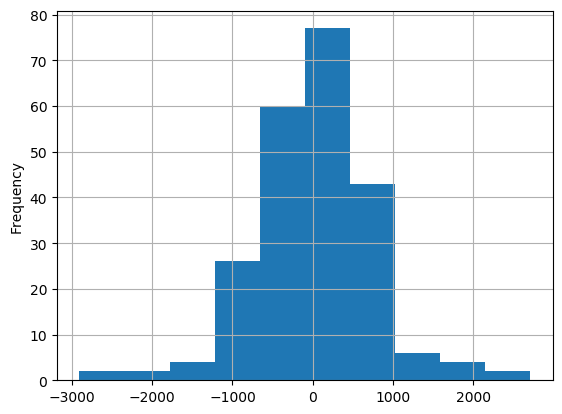

In [562]:
res.observed.plot(kind='hist')
plt.grid(which='major', axis='both')
plt.show()

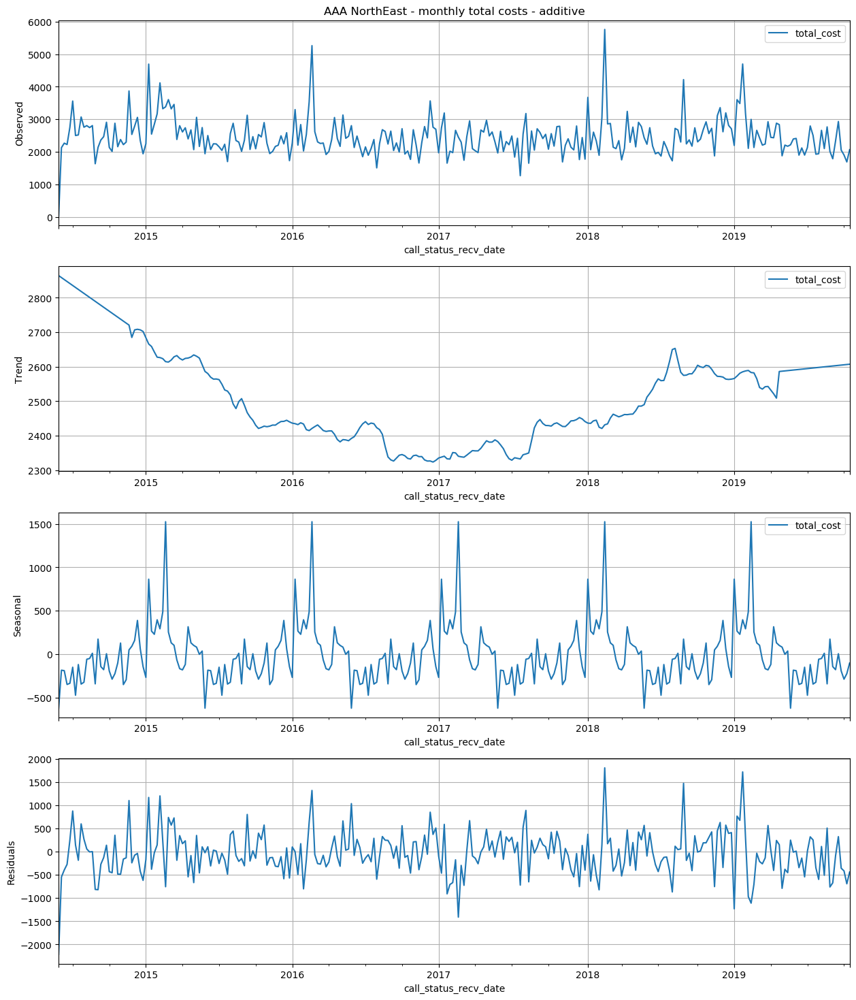

AAA NorthEast - Decompsition Values - Additive: 

                           seas     trend      resid  actual_values
call_status_recv_date                                              
2014-06-01            -622.2257 2864.1346 -2213.9089        28.0000
2014-06-08            -184.4910 2858.3931  -546.9021      2127.0000
2014-06-15            -190.2952 2852.6515  -396.3564      2266.0000
2014-06-22            -349.1451 2846.9100  -273.7649      2224.0000
2014-06-29            -335.6525 2841.1684   248.4841      2754.0000
...                         ...       ...        ...            ...
2016-04-24             130.5495 2388.7019  -111.2514      2408.0000
2016-05-01             100.3210 2381.8365  -315.1575      2167.0000
2016-05-08              80.7512 2388.3942   661.8546      3131.0000
2016-05-15              -2.0654 2387.5192    30.5461      2416.0000
2016-05-22              35.7636 2385.2115    57.0248      2478.0000

[104 rows x 4 columns] 



In [488]:
# Let's analyze the data
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',var_to_predict[0], 'member_status'])
df = df[(df.member_status != 'CANCELLED')]
df.set_index('call_status_recv_date', inplace=True)
df = df.resample('W').sum()
df.index = pd.DatetimeIndex(df.index, freq=pd.infer_freq(df.index))

my_length = 15
my_width = 18
t_title = 'AAA NorthEast - monthly total costs - additive'
x_label = 'Period'
y_label ="Observed"
my_legend = 'Total Costs'

plt.style.use('default')
fig, (ax1, ax2, ax3,ax4) = plt.subplots(4,1, figsize=(my_length,my_width))
ax1.set(xlabel=x_label, ylabel=y_label, title=t_title)
ax1.grid()

# Setting extrapolate_trend='freq' takes care of any missing values in the trend and residuals at the beginning of the series.
res = sm.tsa.seasonal_decompose(df[var_to_predict[0]].dropna(), model='additive', extrapolate_trend='freq')

ax1.grid()
y_label ="Observed"
ax1.set(ylabel=y_label)
res.observed.plot(ax=ax1)
ax1.grid()
ax1.legend()

y_label ="Trend"
ax2.set(ylabel=y_label)
res.trend.plot(ax=ax2)
ax2.legend()
ax2.grid()

ax3.grid()
y_label ="Seasonal"
ax3.set(ylabel=y_label)
res.seasonal.plot(ax=ax3)
ax3.legend()
ax3.grid()

y_label ="Residuals"
ax4.set(ylabel=y_label)
res.resid.plot(ax=ax4)
ax4.grid()
plt.show()

# Extract the Components ----
# Actual Values = Product of (Seasonal * Trend * Resid) para multiplicativo
# Actual Values = Product of (Seasonal + Trend + Resid) para aditivo

df_reconstructed = pd.concat([res.seasonal, res.trend, res.resid, res.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
print("AAA NorthEast - Decompsition Values - Additive: \n")
print(df_reconstructed.head(104),"\n")

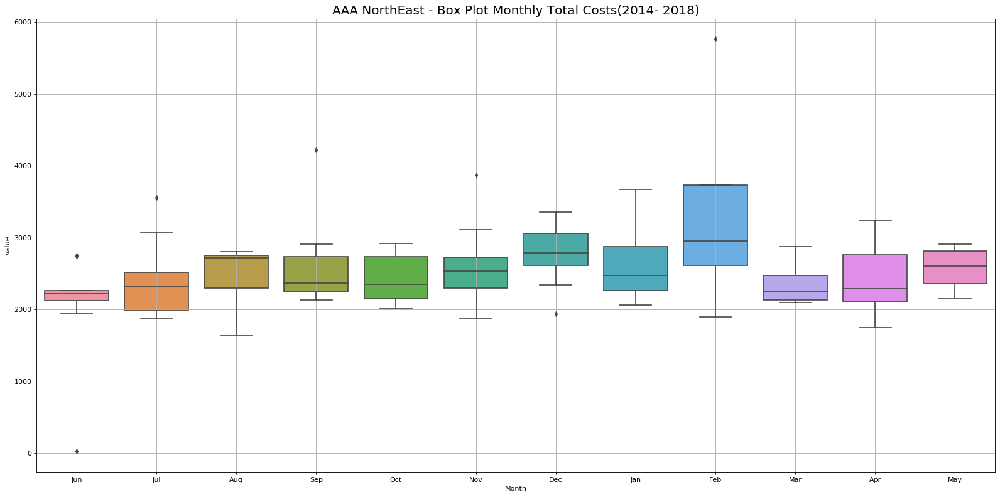

In [22]:
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df = df[(df.member_status != 'CANCELLED')]
df.set_index('call_status_recv_date', inplace=True)
df = df.resample('M').sum()

# Prepare data
df['year'] = [d.year for d in df.index]
df['Month'] = [d.strftime('%b') for d in df.index]
years = df['year'].unique()
df = df.reset_index()
df = df.rename(columns={"call_status_recv_date":"date", "total_cost":"value"})
df = df.loc[df.year.isin([2014, 2015, 2016, 2017, 2018])]

# Draw Plot
fig, axes = plt.subplots(1, 1, figsize=(20,10), dpi= 80)
#sns.boxplot(x='year', y='value', data=df, ax=axes[0])
sns.boxplot(x='Month', y='value', data=df.loc[df.year.isin([2014, 2018]), :])

# Set Title
#axes[0].set_title('Anual - Box Plot\n(Tendencia)', fontsize=18); 
axes.set_title('AAA NorthEast - Box Plot Monthly Total Costs(2014- 2018)', fontsize=18)
plt.grid(which='major', axis='both')
plt.show()

In [24]:
df_transaction.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26006 entries, 0 to 26005
Data columns (total 167 columns):
id                                int64
individual_key                    int64
household_key                     int64
member_flag                       int64
city                              object
state_grouped                     object
zip5                              int64
zip9                              int64
fsv_cmsi_flag                     int64
fsv_credit_card_flag              int64
fsv_deposit_program_flag          int64
fsv_home_equity_flag              int64
fsv_id_theft_flag                 int64
fsv_mortgage_flag                 int64
ins_client_flag                   int64
trv_globalware_flag               int64
number_of_children                object
responded_to_catalog              object
race                              object
length_of_residence               int64
mail_responder                    object
home_owner                        object
inc

In [56]:
df_transaction['ins_client_flag'].value_counts()

0    21296
1     4710
Name: ins_client_flag, dtype: int64

In [69]:
df

,date,total_cost,ins_client_flag,year,Month
903,2014-01-31,834.5000,0,2014,Jan
904,2014-02-28,915.7000,0,2014,Feb
905,2014-03-31,0.0000,0,2014,Mar
906,2014-04-30,0.0000,0,2014,Apr
907,2014-05-31,198.0000,0,2014,May
908,2014-06-30,159.0000,0,2014,Jun
909,2014-07-31,0.0000,0,2014,Jul
910,2014-08-31,28.0000,0,2014,Aug
911,2014-09-30,53.0000,0,2014,Sep
912,2014-10-31,0.0000,0,2014,Oct


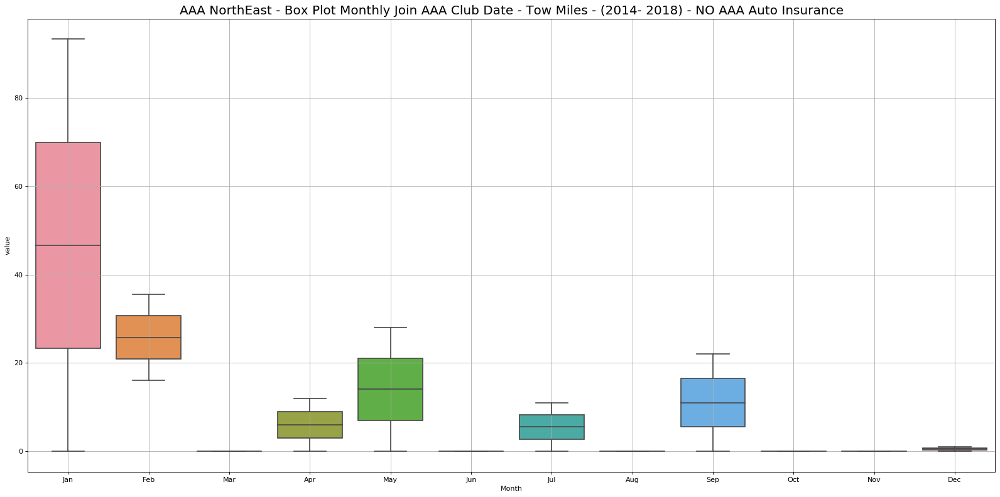

In [26]:
# Cancel Date Box Plot
df = pd.DataFrame(df_transaction, columns=['join_club_date',"calculated_tow_miles", 'member_status', 'ins_client_flag'])

min_date = df['join_club_date'].min().strftime("%m/%d/%Y") 
max_date = df['join_club_date'].max().strftime("%m/%d/%Y") 
df = df[(df.member_status == 'CANCELLED')]
df = df[(df.ins_client_flag == 0)]
df.set_index('join_club_date', inplace=True)
df = df.resample('M').sum()

# Prepare data
df['year'] = [d.year for d in df.index]
df['Month'] = [d.strftime('%b') for d in df.index]
years = df['year'].unique()
df = df.reset_index()
df = df.rename(columns={"join_club_date":"date", "calculated_tow_miles":"value"})
df = df.loc[df.year.isin([2014, 2015, 2016, 2017, 2018])]

# Draw Plot
fig, axes = plt.subplots(1, 1, figsize=(20,10), dpi= 80)
#sns.boxplot(x='year', y='value', data=df, ax=axes[0])
sns.boxplot(x='Month', y='value', data=df.loc[df.year.isin([2014, 2018]), :])

# Set Title
#axes[0].set_title('Anual - Box Plot\n(Tendencia)', fontsize=18); 
axes.set_title('AAA NorthEast - Box Plot Monthly Join AAA Club Date - Tow Miles - (2014- 2018) - NO AAA Auto Insurance', fontsize=18)
plt.grid(which='major', axis='both')
plt.show()

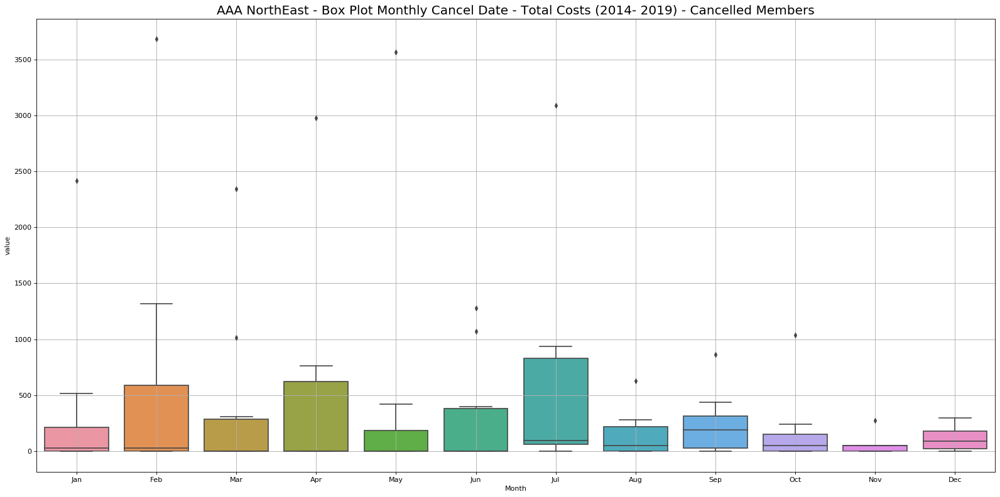

In [24]:
# Cancel Date Box Plot
df = pd.DataFrame(df_transaction, columns=['cancel_date',var_to_predict[0], 'member_status'])
min_date = df['cancel_date'].min().strftime("%m/%d/%Y") 
max_date = df['cancel_date'].max().strftime("%m/%d/%Y") 
df = df[(df.member_status == 'CANCELLED')]
df.set_index('cancel_date', inplace=True)
df = df.resample('W').sum()

# Prepare data
df['year'] = [d.year for d in df.index]
df['Month'] = [d.strftime('%b') for d in df.index]
years = df['year'].unique()
df = df.reset_index()
df = df.rename(columns={"cancel_date":"date", "total_cost":"value"})
df = df.loc[df.year.isin([2014, 2015, 2016, 2017, 2018, 2019])]

# Draw Plot
fig, axes = plt.subplots(1, 1, figsize=(20,10), dpi= 80)
#sns.boxplot(x='year', y='value', data=df, ax=axes[0])
sns.boxplot(x='Month', y='value', data=df.loc[df.year.isin([2014, 2019]), :])

# Set Title
#axes[0].set_title('Anual - Box Plot\n(Tendencia)', fontsize=18); 
axes.set_title('AAA NorthEast - Box Plot Monthly Cancel Date - Total Costs (2014- 2019) - Cancelled Members', fontsize=18)
plt.grid(which='major', axis='both')
plt.show()

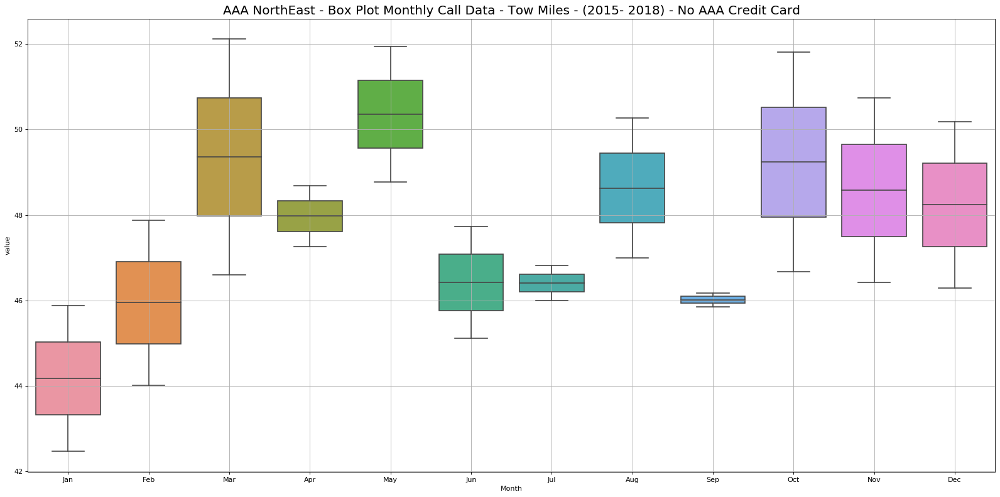

In [59]:
# Credit card Date Box Plot
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',"total_cost", 'member_status', 'fsv_credit_card_flag'])

df = df[(df.member_status !='CANCELLED')]
df = df[(df.fsv_credit_card_flag == 0)]
df.set_index('call_status_recv_date', inplace=True)
df = df.resample('M').mean()

# Prepare data
df['year'] = [d.year for d in df.index]
df['Month'] = [d.strftime('%b') for d in df.index]
years = df['year'].unique()
df = df.reset_index()
df = df.rename(columns={"call_status_recv_date":"date", "total_cost":"value"})
df = df.loc[df.year.isin([2015, 2016, 2017, 2018])]

# Draw Plot
fig, axes = plt.subplots(1, 1, figsize=(20,10), dpi= 80)
#sns.boxplot(x='year', y='value', data=df, ax=axes[0])
sns.boxplot(x='Month', y='value', data=df.loc[df.year.isin([2015, 2018]), :])

# Set Title
#axes[0].set_title('Anual - Box Plot\n(Tendencia)', fontsize=18); 
axes.set_title('AAA NorthEast - Box Plot Monthly Call Data - Tow Miles - (2015- 2018) - No AAA Credit Card', fontsize=18)
plt.grid(which='major', axis='both')
plt.show()

In [70]:
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',"total_cost",'total_calls', 'member_status', 'fsv_credit_card_flag'])
df = df[(df.member_status !='CANCELLED')]
df = df[(df.fsv_credit_card_flag == 0)]
df.set_index('call_status_recv_date', inplace=True)
df.describe()

,total_cost,total_calls,fsv_credit_card_flag
count,15344.0000,15344.0000,15344.0000
mean,41.8991,2.2763,0.0000
std,27.8636,2.4786,0.0000
min,0.0000,0.0000,0.0000
25%,29.0000,0.0000,0.0000
50%,53.0000,1.0000,0.0000
75%,53.0000,3.0000,0.0000
max,588.0000,13.0000,0.0000


In [71]:
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',"total_cost",'total_calls', 'member_status', 'fsv_credit_card_flag'])
df = df[(df.member_status !='CANCELLED')]
df = df[(df.fsv_credit_card_flag == 1)]
df.set_index('call_status_recv_date', inplace=True)
df.describe()

,total_cost,total_calls,fsv_credit_card_flag
count,1342.0000,1342.0000,1342.0000
mean,39.2857,2.5969,1.0000
std,23.9980,2.7804,0.0000
min,0.0000,0.0000,1.0000
25%,28.0000,0.0000,1.0000
50%,53.0000,2.0000,1.0000
75%,53.0000,4.0000,1.0000
max,219.0000,10.0000,1.0000


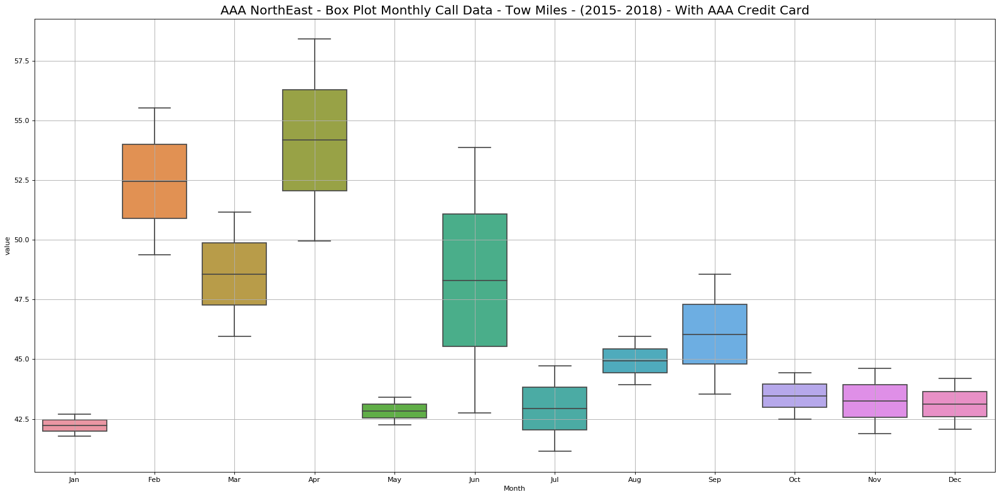

In [61]:
# Credit card Date Box Plot
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',"total_cost", 'member_status', 'fsv_credit_card_flag'])

df = df[(df.member_status !='CANCELLED')]
df = df[(df.fsv_credit_card_flag == 1)]
df.set_index('call_status_recv_date', inplace=True)
df = df.resample('M').mean()

# Prepare data
df['year'] = [d.year for d in df.index]
df['Month'] = [d.strftime('%b') for d in df.index]
years = df['year'].unique()
df = df.reset_index()
df = df.rename(columns={"call_status_recv_date":"date", "total_cost":"value"})
df = df.loc[df.year.isin([2015, 2016, 2017, 2018])]
# Draw Plot
fig, axes = plt.subplots(1, 1, figsize=(20,10), dpi= 80)
#sns.boxplot(x='year', y='value', data=df, ax=axes[0])
sns.boxplot(x='Month', y='value', data=df.loc[df.year.isin([2015, 2018]), :])

# Set Title
#axes[0].set_title('Anual - Box Plot\n(Tendencia)', fontsize=18); 
axes.set_title('AAA NorthEast - Box Plot Monthly Call Data - Tow Miles - (2015- 2018) - With AAA Credit Card', fontsize=18)
plt.grid(which='major', axis='both')
plt.show()

In [62]:
df.describe()

,value,fsv_credit_card_flag,year
count,48.0000,48.0000,48.0000
mean,45.2858,1.0000,2016.5000
std,5.5916,0.0000,1.1299
min,30.8333,1.0000,2015.0000
25%,42.4375,1.0000,2015.7500
50%,44.1905,1.0000,2016.5000
75%,47.8686,1.0000,2017.2500
max,58.4000,1.0000,2018.0000


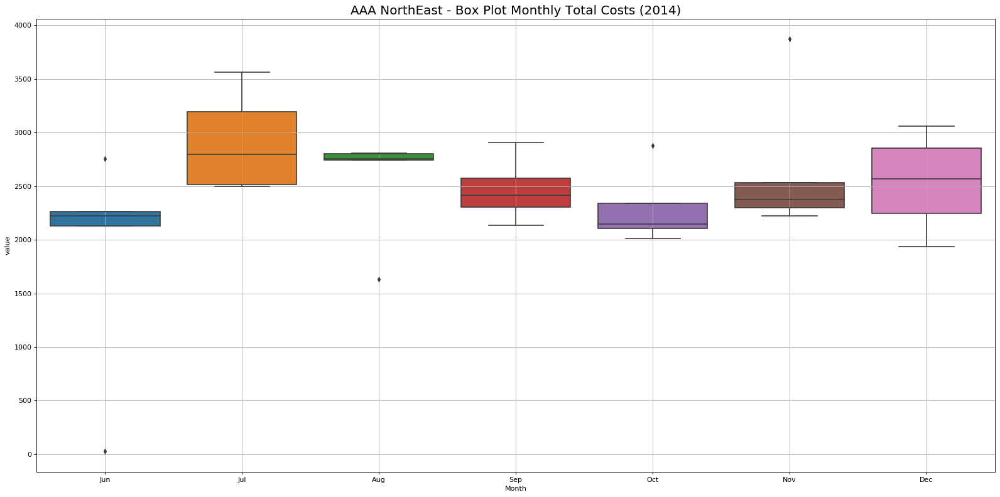

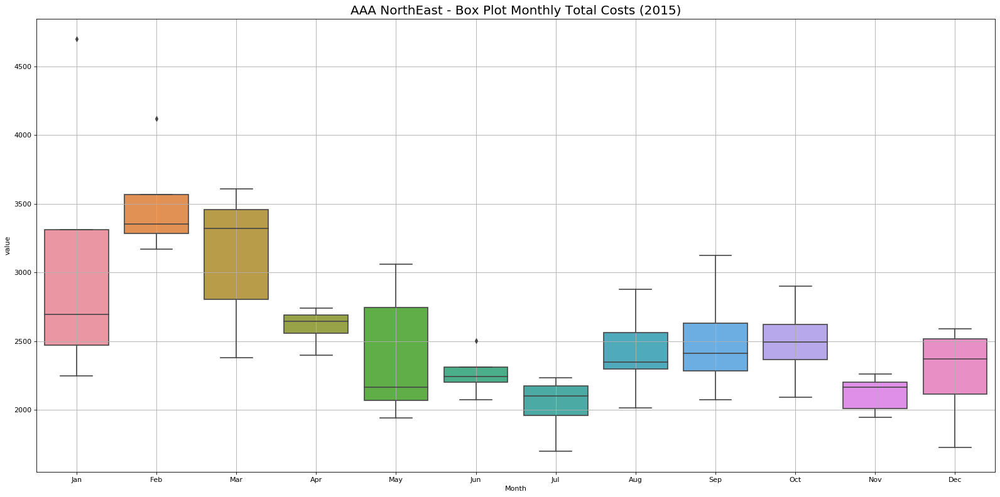

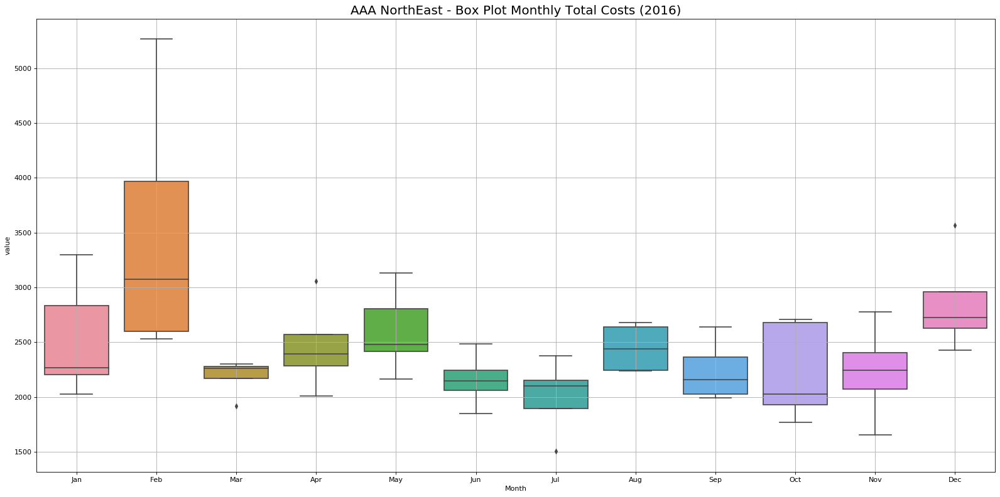

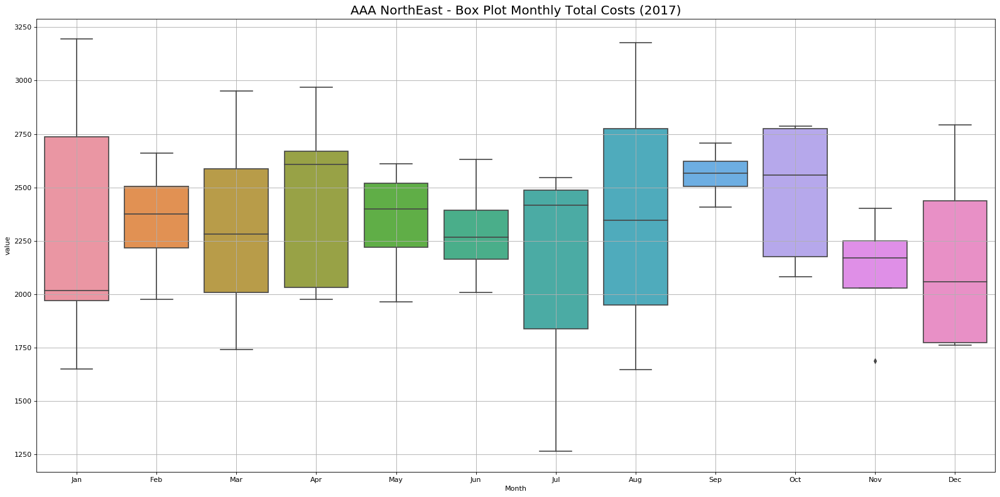

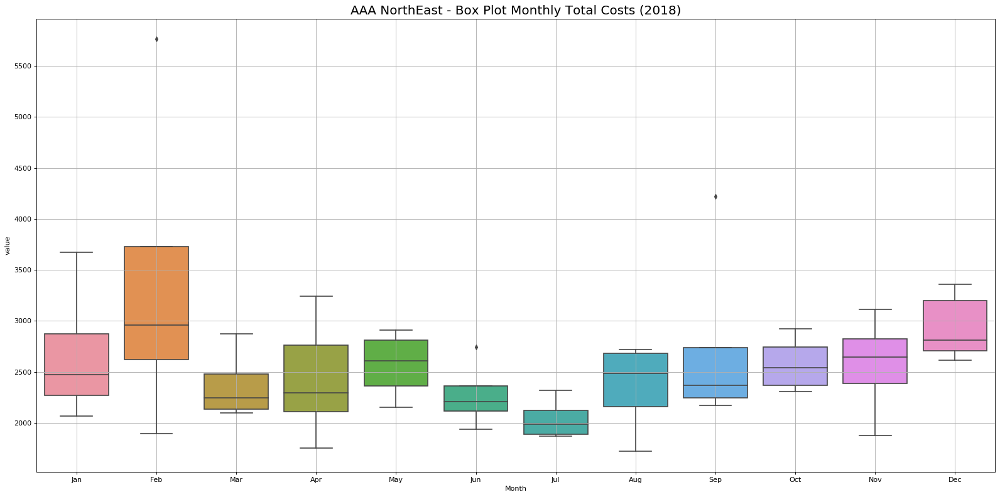

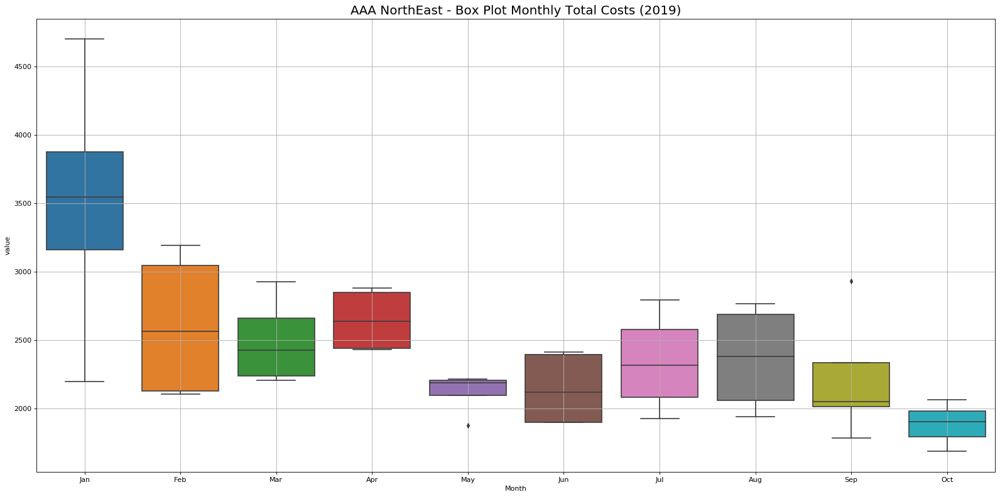

In [30]:
df = pd.DataFrame(df_transaction, columns=['call_status_recv_date',var_to_predict[0], 'member_status'])
min_date = df['call_status_recv_date'].min().strftime("%m/%d/%Y") 
max_date = df['call_status_recv_date'].max().strftime("%m/%d/%Y") 
df = df[(df.member_status != 'CANCELLED')]
df.set_index('call_status_recv_date', inplace=True)
df = df.resample('W').sum()

df['year'] = [d.year for d in df.index]
df['Month'] = [d.strftime('%b') for d in df.index]
years = df['year'].unique()
df = df.reset_index()
df = df.rename(columns={"call_status_recv_date":"date", "total_cost":"value"})

years = df.year.unique()
years.sort()
for i in years:
    df1 = df.loc[df.year.isin([i])]
    fig, axes = plt.subplots(1,1,figsize=(20,10), dpi= 80)
    axes = sns.boxplot(x='Month', y='value', data=df1)
    axes.set_title('AAA NorthEast - Box Plot Monthly Total Costs (' + str(i) + ')' , fontsize=18)
    plt.grid(which='major', axis='both')
    plt.show()

In [555]:
def test_stationarity(timeseries=df_transaction,mycol=var_to_predict[0], regr='nc', regr_title='sin tituto', regr_k='cn'):
    ''' 
    timeseries = Serie de tiempo
    mycol = columna a chequear
    regr = regression = 'nc', 'c', 'ct', 'ctt' - Dick fuller test
    regr_k = 'c', 'ct' - KPSS test
    '''
    #Determing rolling statistics
    np.set_printoptions(precision=4)
    rolmean = timeseries[mycol].rolling(window=12).mean() # 12 meses
    rolstd = timeseries[mycol].rolling(window=12).std()
    
    #Plot rolling statistics:
    orig = plt.plot(timeseries[mycol], color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation - ' + str(regr_title))
    plt.grid(which='major', axis='both')
    plt.show(block=False)
        #Perform Dickey-Fuller test:
    
    # Calcular la media de dos muestras
    X = timeseries.values
    split = int(round(len(X) / 2,0))
    X1, X2 = X[0:split], X[split:]
    mean1, mean2 = X1.mean(), X2.mean()
    var1, var2, = X1.var(), X2.var()
    print('Mean     No. 1 = %f\nMean     No. 2 = %f\n' % (mean1, mean2))
    print('Variance No. 1 = %f\nVariance No. 2 = %f\n' % (var1, var2))

    print ('Dickey-Fuller Test Resuts - ', regr_title)
    dftest = adfuller(timeseries[mycol], autolag='AIC', regression=regr)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    print('\nTest Statistic', dfoutput['Test Statistic']," & ", dfoutput[4:5])
    print('Test Statistic', dfoutput['Test Statistic']," & ", dfoutput[6:7])
    
    # KPSS Test
    # regression (str{'c', 'ct'}) – Indicates the null hypothesis for the KPSS test * ‘cn’ : 
    # The data is stationary around a constant (default) * ‘ct’ : The data is stationary around a trend
    # KPSS Test
    print ('\nKPSS test Results - ', regr_title)
    result = kpss(timeseries[mycol].values, regression=regr_k)
    print('KPSS Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    for key, value in result[3].items():
        print('Critical Values:')
        print(f'   {key}, {value}')
    
    # prueba de normalidad estadistica
    stat, p = stats.normaltest(timeseries[mycol])
    print('\nNormality Test: ', " - ", regr_title)
    print('Statistics=%.3f, p=%.6f' % (stat, p))
    alpha = 0.05
    if p > alpha:
        print('Time series looks like a normal distribution - Gaussian (fail to reject H0)')
    else:
        print('Time series does not look like a normal distribution - Gaussian (reject H0)')

    print( 'Kurtosis - Normal Distribution: {}'.format(stats.kurtosis(timeseries[mycol])))
    print( 'Skewness - Normal Distribution normal: {}'.format(stats.skew(timeseries[mycol])))
    return

In [31]:
df_household.total_cost.sum()

644049.98

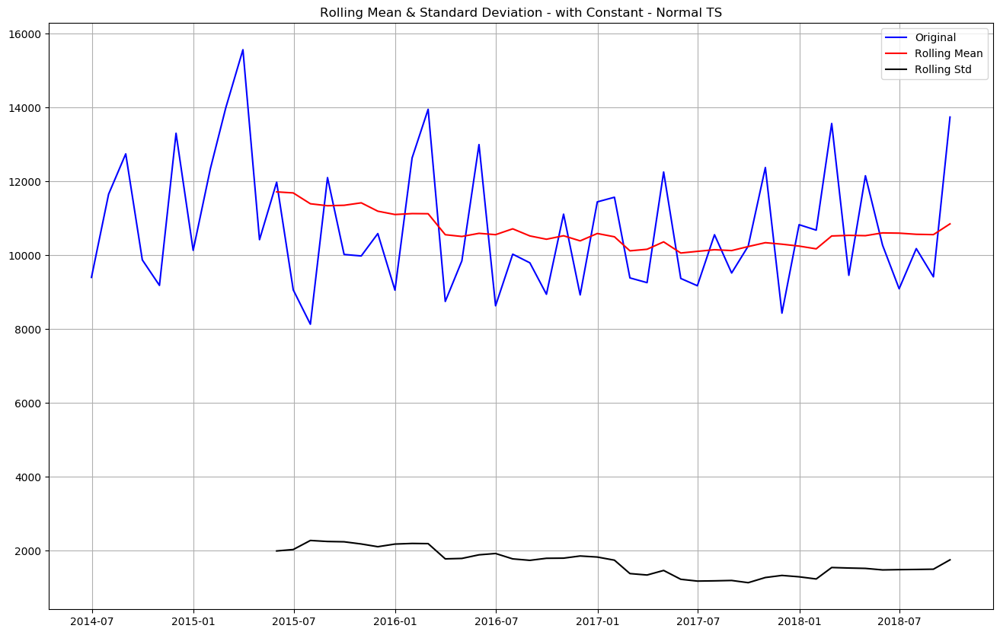

Mean     No. 1 = 11013.807692
Mean     No. 2 = 10451.431154

Variance No. 1 = 3735235.001479
Variance No. 2 = 2027238.767264

Dickey-Fuller Test Resuts -  with Constant - Normal TS
Test Statistic                -5.1205
p-value                        0.0000
#Lags Used                     1.0000
Number of Observations Used   50.0000
Critical Value (1%)           -3.5685
Critical Value (5%)           -2.9214
Critical Value (10%)          -2.5987
dtype: float64

Test Statistic -5.120516590239912  &  Critical Value (1%)   -3.5685
dtype: float64
Test Statistic -5.120516590239912  &  Critical Value (10%)   -2.5987
dtype: float64

KPSS test Results -  with Constant - Normal TS
KPSS Statistic: 0.239877
p-value: 0.100000
Critical Values:
   10%, 0.347
Critical Values:
   5%, 0.463
Critical Values:
   2.5%, 0.574
Critical Values:
   1%, 0.739

Normality Test:   -  with Constant - Normal TS
Statistics=5.009, p=0.081716
Time series looks like a normal distribution - Gaussian (fail to reject H0)
Kur

In [556]:
# Analicemos la data
np.set_printoptions(precision=4)
rcParams['figure.figsize'] = 16,10
regr = 'c'
regr_k = 'c'
regr_title = 'with Constant - Normal TS'
df = pd.DataFrame(Train, columns=[var_to_predict[0]])
df = df.resample("M").sum()
test_stationarity(df,var_to_predict[0], regr, regr_title, regr_k)

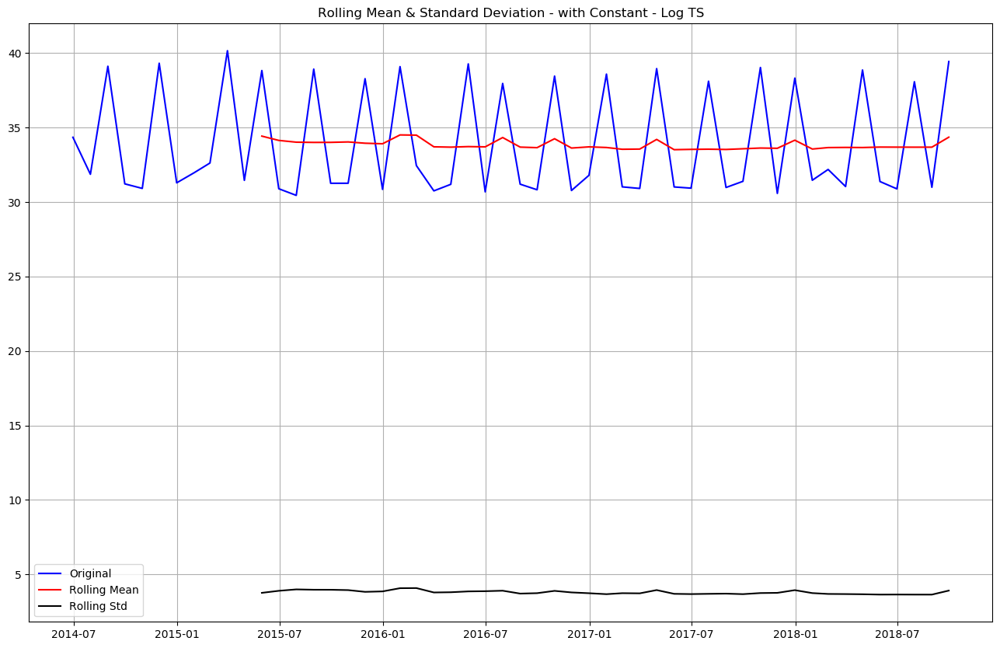

Mean     No. 1 = 34.092994
Mean     No. 2 = 33.738328

Variance No. 1 = 13.398418
Variance No. 2 = 12.928321

Dickey-Fuller Test Resuts -  with Constant - Log TS
Test Statistic                -1.7569
p-value                        0.4021
#Lags Used                     9.0000
Number of Observations Used   42.0000
Critical Value (1%)           -3.5966
Critical Value (5%)           -2.9333
Critical Value (10%)          -2.6050
dtype: float64

Test Statistic -1.7568634400706242  &  Critical Value (1%)   -3.5966
dtype: float64
Test Statistic -1.7568634400706242  &  Critical Value (10%)   -2.6050
dtype: float64

KPSS test Results -  with Constant - Log TS
KPSS Statistic: 0.147036
p-value: 0.100000
Critical Values:
   10%, 0.347
Critical Values:
   5%, 0.463
Critical Values:
   2.5%, 0.574
Critical Values:
   1%, 0.739

Normality Test:   -  with Constant - Log TS
Statistics=57.388, p=0.000000
Time series does not look like a normal distribution - Gaussian (reject H0)
Kurtosis - Normal Distrib

In [557]:
# Analicemos la data
np.set_printoptions(precision=4)
rcParams['figure.figsize'] = 16,10
regr = 'c'
regr_k = 'c'
regr_title = 'with Constant - Log TS'
df = pd.DataFrame(Train_log, columns=[var_to_predict[0]])
df = df.resample("M").sum()
test_stationarity(df,var_to_predict[0], regr, regr_title, regr_k)

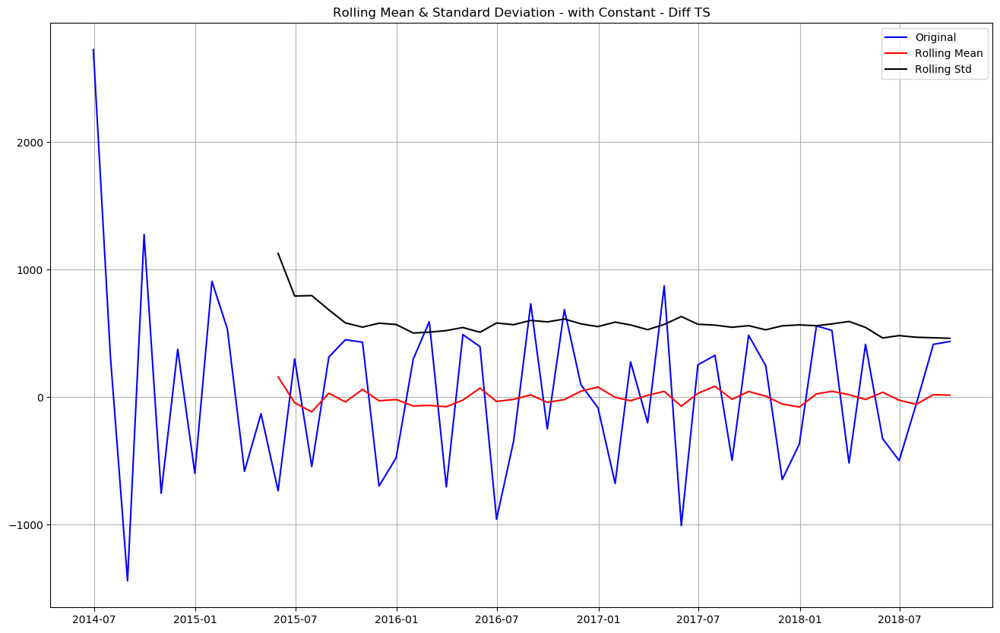

Mean     No. 1 = 56.846154
Mean     No. 2 = 47.402308

Variance No. 1 = 698520.360947
Variance No. 2 = 245635.434487

Dickey-Fuller Test Resuts -  with Constant - Diff TS
Test Statistic                -7.3039
p-value                        0.0000
#Lags Used                     5.0000
Number of Observations Used   46.0000
Critical Value (1%)           -3.5813
Critical Value (5%)           -2.9268
Critical Value (10%)          -2.6015
dtype: float64

Test Statistic -7.3039018037756565  &  Critical Value (1%)   -3.5813
dtype: float64
Test Statistic -7.3039018037756565  &  Critical Value (10%)   -2.6015
dtype: float64

KPSS test Results -  with Constant - Diff TS
KPSS Statistic: 0.221477
p-value: 0.100000
Critical Values:
   10%, 0.347
Critical Values:
   5%, 0.463
Critical Values:
   2.5%, 0.574
Critical Values:
   1%, 0.739

Normality Test:   -  with Constant - Diff TS
Statistics=13.887, p=0.000965
Time series does not look like a normal distribution - Gaussian (reject H0)
Kurtosis - Nor

In [558]:
# Analicemos la data
np.set_printoptions(precision=4)
rcParams['figure.figsize'] = 16,10
regr = 'c'
regr_k = 'c'
regr_title = 'with Constant - Diff TS'
df = pd.DataFrame(Train_diff, columns=[var_to_predict[0]])
df = df.resample("M").sum()
test_stationarity(df,var_to_predict[0], regr, regr_title, regr_k)

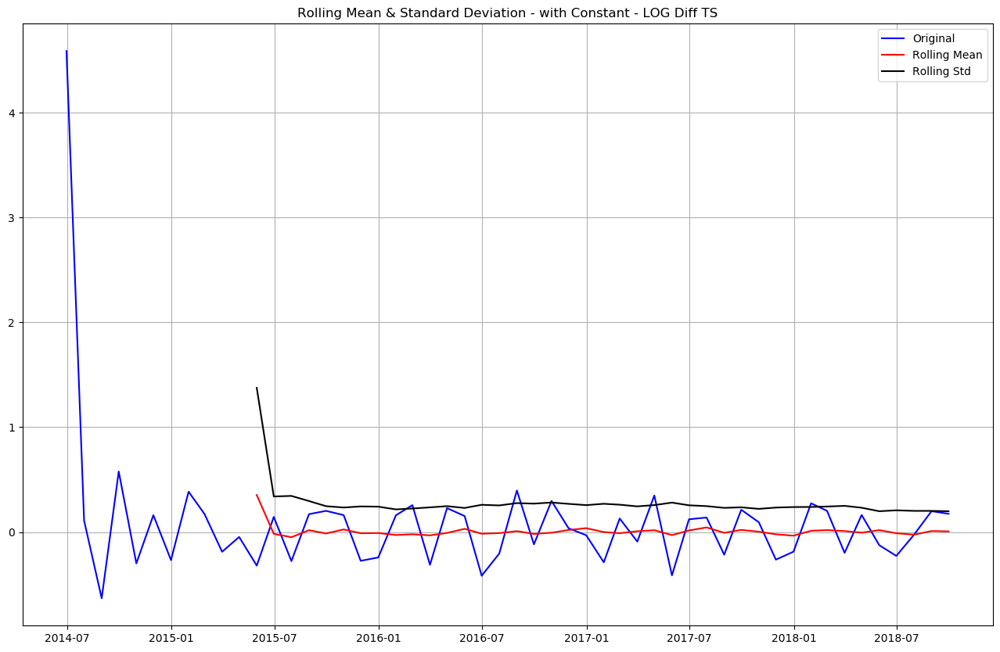

Mean     No. 1 = 0.153270
Mean     No. 2 = 0.022998

Variance No. 1 = 0.865449
Variance No. 2 = 0.046440

Dickey-Fuller Test Resuts -  with Constant - LOG Diff TS
Test Statistic                -6.7368
p-value                        0.0000
#Lags Used                     5.0000
Number of Observations Used   46.0000
Critical Value (1%)           -3.5813
Critical Value (5%)           -2.9268
Critical Value (10%)          -2.6015
dtype: float64

Test Statistic -6.736847763084716  &  Critical Value (1%)   -3.5813
dtype: float64
Test Statistic -6.736847763084716  &  Critical Value (10%)   -2.6015
dtype: float64

KPSS test Results -  with Constant - LOG Diff TS
KPSS Statistic: 0.310021
p-value: 0.100000
Critical Values:
   10%, 0.347
Critical Values:
   5%, 0.463
Critical Values:
   2.5%, 0.574
Critical Values:
   1%, 0.739

Normality Test:   -  with Constant - LOG Diff TS
Statistics=99.956, p=0.000000
Time series does not look like a normal distribution - Gaussian (reject H0)
Kurtosis - Norma

In [559]:
# Analicemos la data
np.set_printoptions(precision=4)
rcParams['figure.figsize'] = 16,10
regr = 'c'
regr_k = 'c'
regr_title = 'with Constant - LOG Diff TS'
df = pd.DataFrame(Train_log_diff, columns=[var_to_predict[0]])
df = df.resample("M").sum()
test_stationarity(df,var_to_predict[0], regr, regr_title, regr_k)

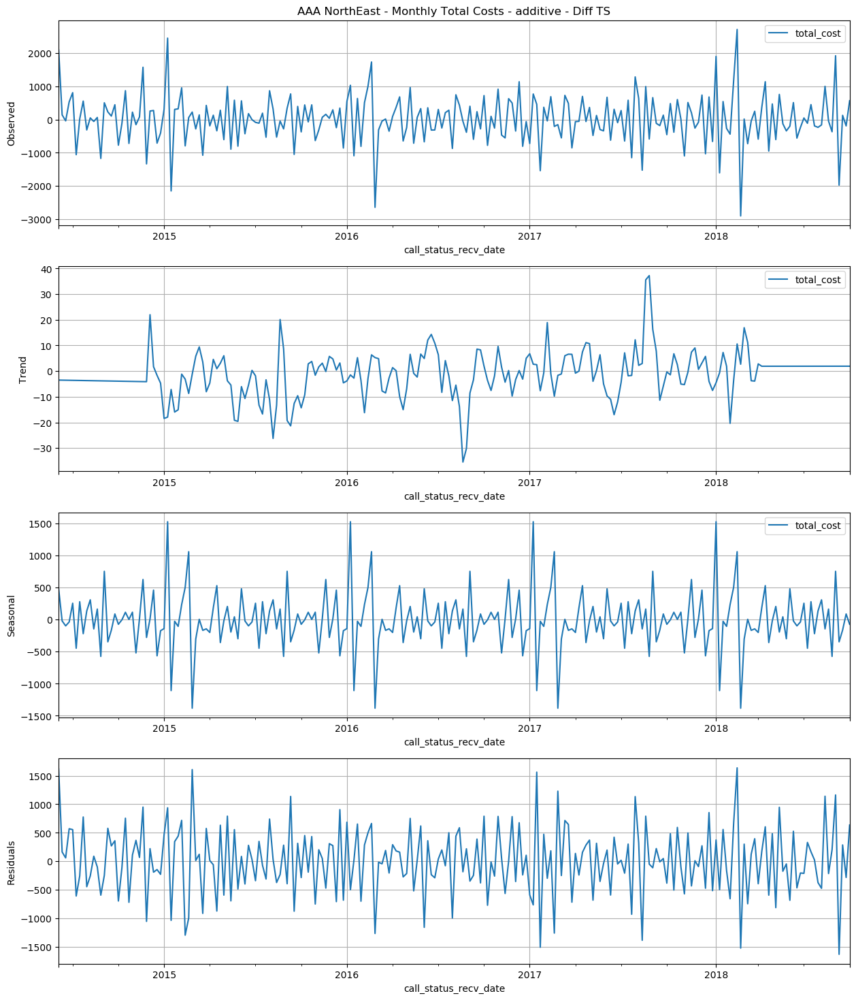

AAA NorthEast - Decompsition Values - Additive: 

                           seas   trend     resid  actual_values
call_status_recv_date                                           
2014-06-08             481.3808 -3.4932 1621.1124      2099.0000
2014-06-15             -20.4605 -3.5182  162.9787       139.0000
2014-06-22             -97.7326 -3.5432   59.2757       -42.0000
2014-06-29             -36.9969 -3.5682  570.5651       530.0000
2014-07-06             255.9925 -3.5931  554.6006       807.0000
...                         ...     ...       ...            ...
2016-05-01             -19.1765 -6.8654 -214.9581      -241.0000
2016-05-08             205.6903  6.5577  751.7520       964.0000
2016-05-15            -194.4036 -0.8750 -519.7214      -715.0000
2016-05-22              44.1010 -2.3077   20.2067        62.0000
2016-05-29            -298.6924  6.6442  619.0482       327.0000

[104 rows x 4 columns] 



In [560]:
# Let's analyze the data
df = pd.DataFrame(Train_diff, columns=[var_to_predict[0]])

my_length = 15
my_width = 18
t_title = 'AAA NorthEast - Monthly Total Costs - additive - Diff TS'
x_label = 'Period'
y_label ="Observed"
my_legend = 'Total Costs - Diff'

plt.style.use('default')
fig, (ax1, ax2, ax3,ax4) = plt.subplots(4,1, figsize=(my_length,my_width))
ax1.set(xlabel=x_label, ylabel=y_label, title=t_title)
ax1.grid()

# Setting extrapolate_trend='freq' takes care of any missing values in the trend and residuals at the beginning of the series.
res = sm.tsa.seasonal_decompose(df[var_to_predict[0]].dropna(), model='additive', extrapolate_trend='freq')

ax1.grid()
y_label ="Observed"
ax1.set(ylabel=y_label)
res.observed.plot(ax=ax1)
ax1.grid()
ax1.legend()

y_label ="Trend"
ax2.set(ylabel=y_label)
res.trend.plot(ax=ax2)
ax2.legend()
ax2.grid()

ax3.grid()
y_label ="Seasonal"
ax3.set(ylabel=y_label)
res.seasonal.plot(ax=ax3)
ax3.legend()
ax3.grid()

y_label ="Residuals"
ax4.set(ylabel=y_label)
res.resid.plot(ax=ax4)
ax4.grid()
plt.show()

# Extract the Components ----
# Actual Values = Product of (Seasonal * Trend * Resid) para multiplicativo
# Actual Values = Product of (Seasonal + Trend + Resid) para aditivo

df_reconstructed = pd.concat([res.seasonal, res.trend, res.resid, res.observed], axis=1)
df_reconstructed.columns = ['seas', 'trend', 'resid', 'actual_values']
print("AAA NorthEast - Decompsition Values - Additive: \n")
print(df_reconstructed.head(104),"\n")

# Auto correlation and Partial Auto correlation graph

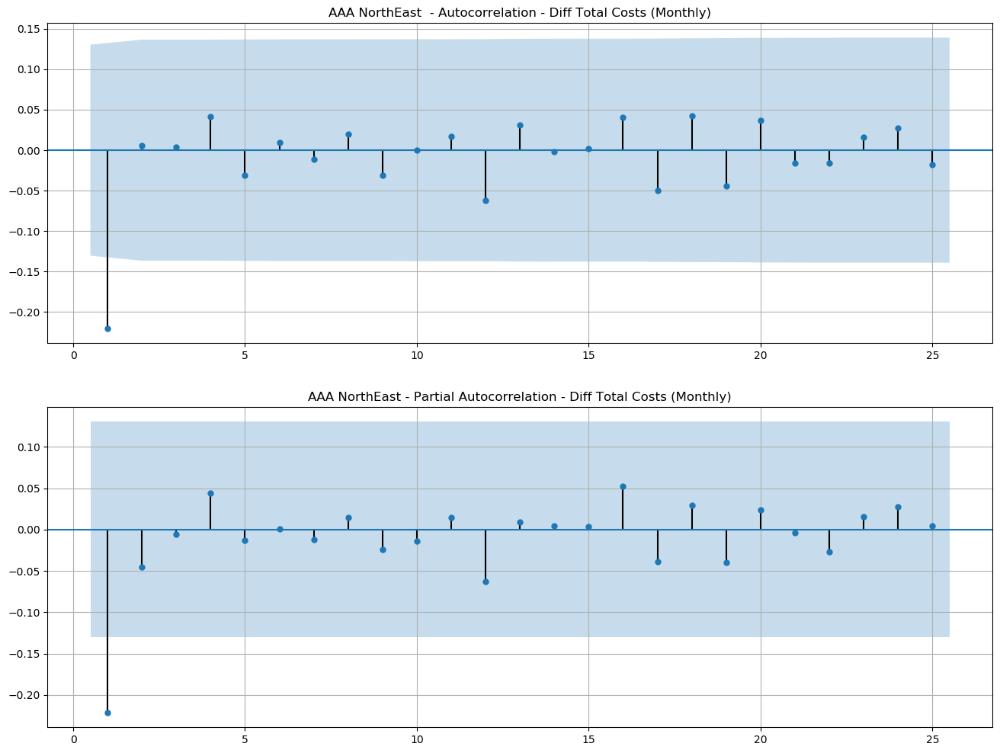

In [553]:
df = pd.DataFrame(Train_log_diff, columns=[var_to_predict[0]])
fig = plt.figure(figsize=(16,12))
ax1 = fig.add_subplot(211)
fig = plot_acf(df[var_to_predict[0]].dropna(), ax=ax1, alpha=0.05, zero=False, lags=25, title='AAA NorthEast  - Autocorrelation - Diff Total Costs (Monthly)')
plt.grid(which='major', axis='both')
ax2 = fig.add_subplot(212)
fig = plot_pacf(df[var_to_predict[0]].dropna(), ax=ax2, alpha=0.05, zero=False, lags=25, title='AAA NorthEast - Partial Autocorrelation - Diff Total Costs (Monthly)')
plt.grid(which='major', axis='both')
plt.show()

# FB Prophet Forest Model

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


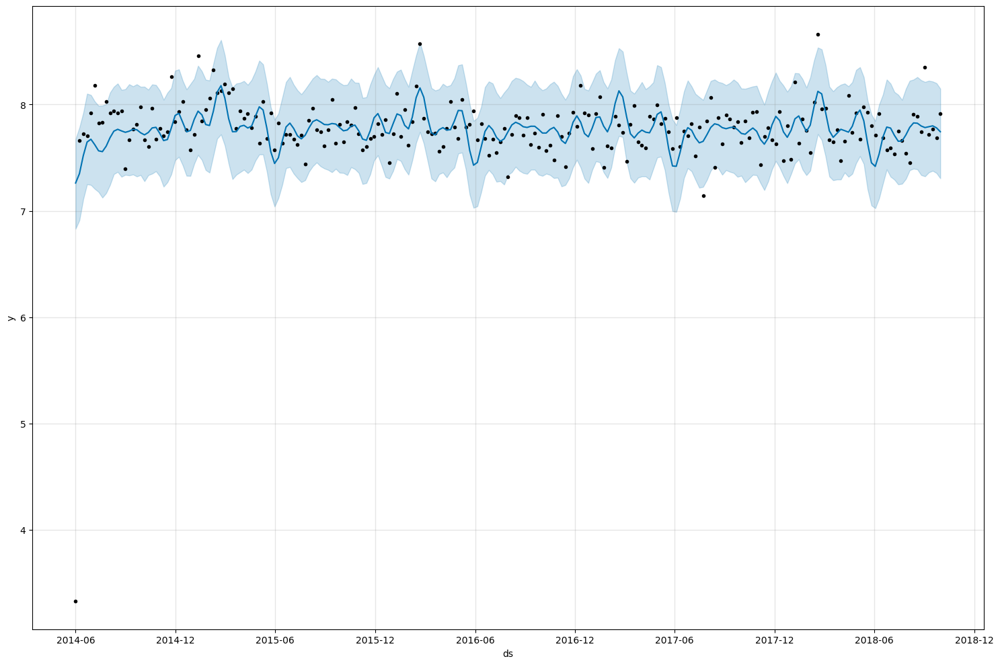

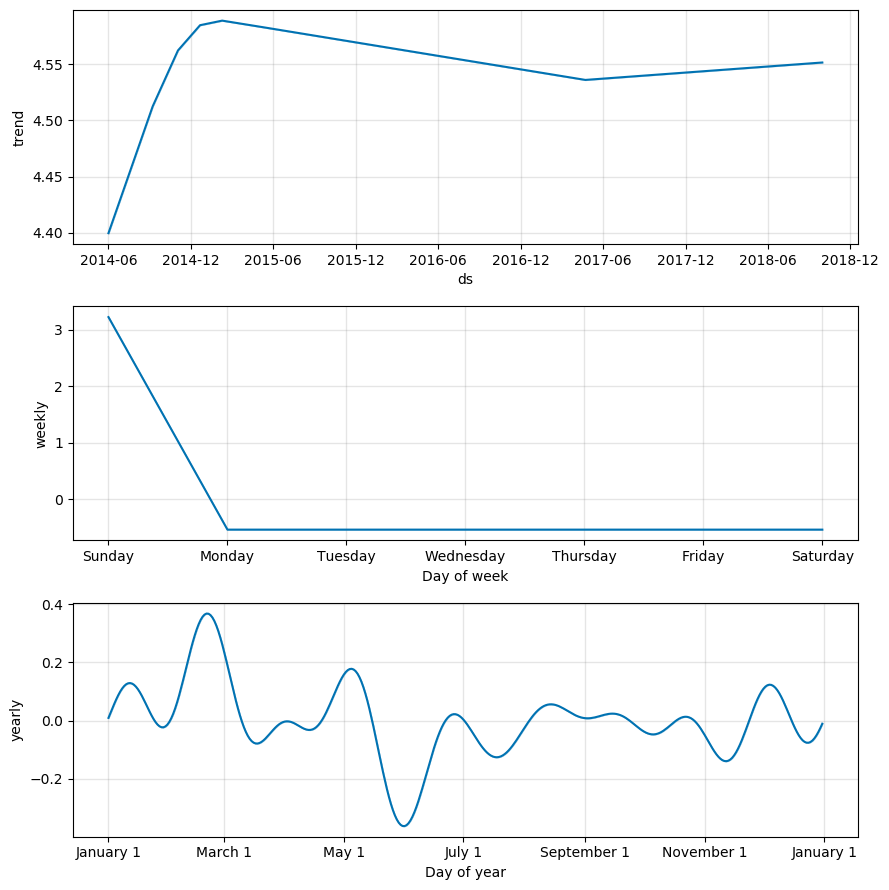

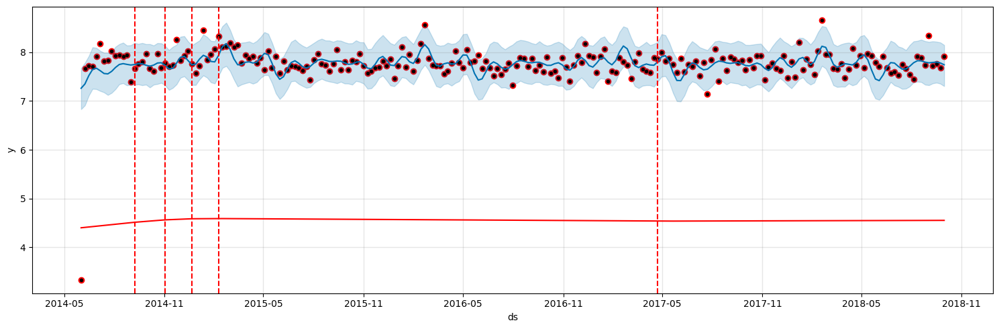

In [526]:
from fbprophet.plot import add_changepoints_to_plot
from fbprophet.diagnostics import cross_validation
from fbprophet.diagnostics import performance_metrics
from fbprophet.plot import plot_cross_validation_metric
from fbprophet import Prophet
from fbprophet.plot import plot_plotly

# Calcular la cantidad de modelos
rcParams['figure.figsize'] = 16,12
validacion = valid_log.copy()
entrenamiento = Train_log.copy()

# #############################################################################
# Load the data and split it into separate pieces
df = pd.DataFrame(entrenamiento, columns=[var_to_predict[0]])
# Format data for prophet model using ds and y
df.reset_index(inplace=True)
df = df.rename(columns={'call_status_recv_date':'ds', var_to_predict[0]:'y'})
#df['cap'] = 15000
# Setup and train model


''' 
model = Prophet(growth='linear', seasonality_mode='additive',  weekly_seasonality=False, 
                daily_seasonality=False, interval_width=0.95, n_changepoints=12, 
                changepoint_range=0.8, changepoint_prior_scale=0.10
               )
'''
model = Prophet(growth='linear', seasonality_mode='additive', weekly_seasonality=True)

# Adding monthly seasonality
# model.add_seasonality(name='monthly', period=170, fourier_order=12) - 2087
#model.add_seasonality(name='monthly', period=170, fourier_order=12)
#model.fit(df, control={'max_treedepth': 10, 'adapt_delta':0.85})
model.fit(df)
fbpro_fcst = model.predict(df)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(10)
f.set_figwidth(15)
fig = model.plot(fbpro_fcst, ax=ax)
# Plot the components
fig = model.plot_components(fbpro_fcst)
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
ax.scatter(entrenamiento.index, entrenamiento[var_to_predict[0]], color='r')
fig = model.plot(fbpro_fcst, ax=ax)
a = add_changepoints_to_plot(fig.gca(), model, fbpro_fcst)

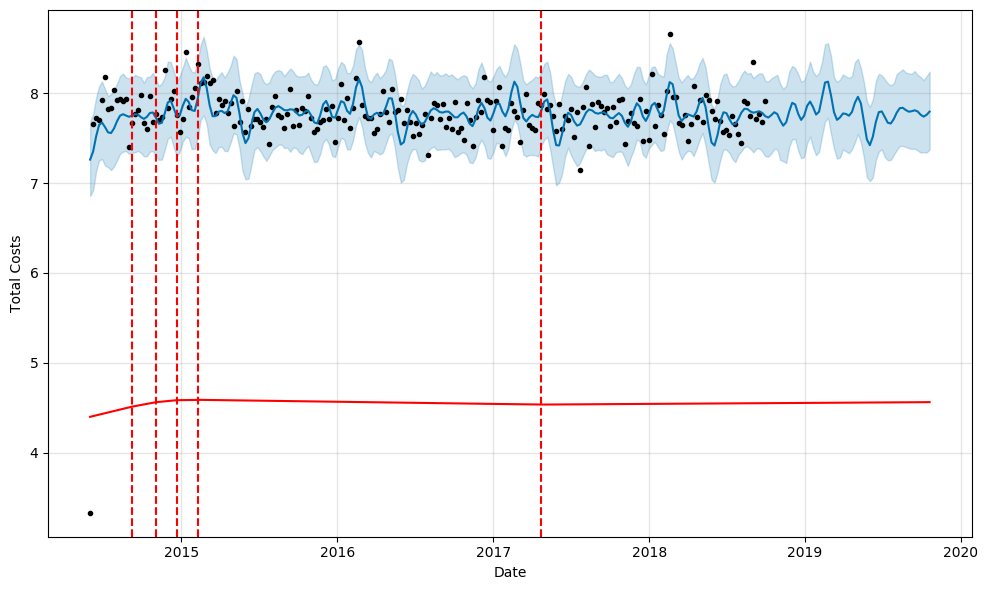

In [527]:
rcParams['figure.figsize'] = 16,12
future = model.make_future_dataframe(55, freq='W')
#future['cap'] = 15000
forecast = model.predict(future)
fig = model.plot(forecast, plot_cap=True, xlabel='Date', ylabel='Total Costs')
a = add_changepoints_to_plot(fig.gca(), model, forecast)

In [545]:
df_converted = Train_log.copy()
df_converted = df_converted.append(valid_log , ignore_index=False)
df_converted.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 282 entries, 2014-06-01 to 2019-10-20
Data columns (total 1 columns):
total_cost    float64
dtypes: float64(1)
memory usage: 4.4 KB


 Total Market 

Descriptive Statistics - Total Costs 
 count     282.0000
mean        0.0089
std       544.3098
min     -1470.6508
25%      -367.7796
50%       -41.2313
75%       308.7553
max      2315.9689
Name: total_cost, dtype: float64


FB Prophet Train r2        : 0.19217
FB Prophet Test  r2        : -0.16966

FB Prophet Train MSE       : 282947.54909
FB Prophet Test  MSE       : 345884.65083

FB Prophet Train RMSE      : 531.92814
FB Prophet Test  RMSE      : 588.11959

FB Prophet Train MAE       : 400.32783
FB Prophet Test  MAE       : 459.02438


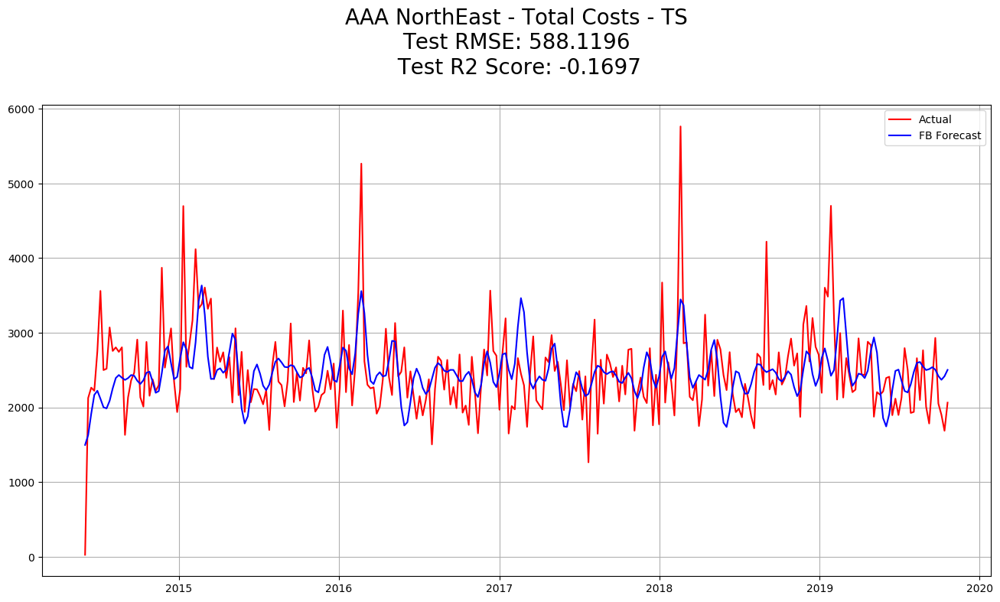

In [551]:
fore_2019 = pd.DataFrame(forecast, columns=['ds','yhat'])
fore_2019.rename(columns={"ds": "call_status_recv_date", "yhat": var_to_predict[0]}, inplace=True)
fore_2019 = fore_2019.set_index("call_status_recv_date")

# Using the Log Time series, need to convert it back
bias = 74.5 # It is the mean of the residuals
fore_2019[var_to_predict[0]] = np.exp(fore_2019[var_to_predict[0]]) + 74.5
f_train = fore_2019.loc['2014-06-01':'2018-09-30']
f_test = fore_2019.loc['2018-10-01':'2019-10-31']


df_converted = Train.copy()
df_converted = df_converted.append(valid , ignore_index=False)

c_train = df_converted.loc['2014-06-01':'2018-09-30']
c_test = df_converted.loc['2018-10-01':'2019-10-31']

train_residuals = df_converted - fore_2019


title = "AAA NorthEast - Residual Description"
mercado = "Total Market"
print('\033[1m', mercado, '\033[0m')
print("\nDescriptive Statistics - Total Costs \n",train_residuals[var_to_predict[0]].describe())
fig = px.box(train_residuals, y=var_to_predict[0], title=title + " - Total Costs", points="all")
fig.show()

train_rmse = (sqrt(mean_squared_error(c_train[var_to_predict[0]], f_train[var_to_predict[0]])))
test_rmse = (sqrt(mean_squared_error(c_test[var_to_predict[0]], f_test[var_to_predict[0]])))

train_r2 = r2_score(c_train[var_to_predict[0]], f_train[var_to_predict[0]])
test_r2 = r2_score(c_test[var_to_predict[0]], f_test[var_to_predict[0]])

train_mse = mean_squared_error(c_train[var_to_predict[0]], f_train[var_to_predict[0]])
test_mse = mean_squared_error(c_test[var_to_predict[0]], f_test[var_to_predict[0]])

train_mae  = mean_absolute_error(c_train[var_to_predict[0]], f_train[var_to_predict[0]])
test_mae  = mean_absolute_error(c_test[var_to_predict[0]], f_test[var_to_predict[0]])

print('FB Prophet Train r2        : %.5f' % train_r2)
print('FB Prophet Test  r2        : %.5f\n' % test_r2)
print('FB Prophet Train MSE       : %.5f' % train_mse)
print('FB Prophet Test  MSE       : %.5f\n' % test_mse)
print('FB Prophet Train RMSE      : %.5f' % train_rmse)
print('FB Prophet Test  RMSE      : %.5f\n' % test_rmse)
print('FB Prophet Train MAE       : %.5f' % train_mae)
print('FB Prophet Test  MAE       : %.5f' % test_mae)

plt.figure(figsize=(16,8)) 
plt.plot(df_converted[var_to_predict[0]], label='Actual', color="red")
plt.plot(fore_2019[var_to_predict[0]], label='FB Forecast', color="blue")
plt.legend(loc='best') 
plt.grid(which='major', axis='both')
plt.title("AAA NorthEast - Total Costs - TS\n" + 'Test RMSE: %.4f\n Test R2 Score: %.4f\n'%(test_rmse,test_r2), 
          fontsize=20)
plt.show()

# Observation

* Results from Naive Forecast
    * RMSE                 : 746.085
    * MSE                  : 556642.990
    * MAE                  : 564.006
    * R2 Score             : -0.694

* FB Prophet 
    * FB Prophet Train r2        : 0.19217
    * FB Prophet Test  r2        : -0.16966
    * FB Prophet Train MSE       : 282947.54909
    * FB Prophet Test  MSE       : 345884.65083
    * FB Prophet Train RMSE      : 531.92814
    * FB Prophet Test  RMSE      : 588.11959
    * FB Prophet Train MAE       : 400.32783
    * FB Prophet Test  MAE       : 459.02438

# Scaler Testing

In [ ]:
# Scale fields using Standard Scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Standard Scaler
scaler = StandardScaler()
scaled_df_std = scaler.fit_transform(df)
scaled_df_std = pd.DataFrame(scaled_df_std, columns=features_to_scale)


for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    
    ax1.set_title('Before Scaling Standard Scaler')
    ax2.set_title('After Standard Scaler')

    sns.kdeplot(df[col], ax=ax1)
    sns.kdeplot(scaled_df_std[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_std.describe()

In [ ]:
# Scale fields using Min-Max scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Min-Max Scaler
scaler = MinMaxScaler()
scaled_df_mm = scaler.fit_transform(df)
scaled_df_mm = pd.DataFrame(scaled_df_mm, columns=features_to_scale)

for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Min-Max')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Min-Max Scaling')
    sns.kdeplot(scaled_df_mm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_mm.describe()

In [ ]:
# Scale fields using Robust Scaler

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Robust Scaler- excellent with outliers
scaler = RobustScaler()
scaled_df_rs = scaler.fit_transform(df)
scaled_df_rs = pd.DataFrame(scaled_df_rs, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Robust Scaling')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Robust Scaling')
    sns.kdeplot(scaled_df_rs[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_rs.describe()

In [ ]:
# Scale fields using Normalizer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# Normalizer
scaler = Normalizer()
scaled_df_nm = scaler.fit_transform(df)
scaled_df_nm = pd.DataFrame(scaled_df_nm, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling Normalizer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After Normalizer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_nm.describe()

In [ ]:
# Scale fields using Quantile Transformer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# QuantileTransformer
scaler = QuantileTransformer(n_quantiles=200, output_distribution='normal')
scaled_df_qt = scaler.fit_transform(df)
scaled_df_qt = pd.DataFrame(scaled_df_qt, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling QuantileTransformer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After QuantileTransformer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_qt.describe()

In [ ]:
# Scale fields using Power Transformer

features_to_scale = ['aaa_mean_age', 'length_of_residence', 'aaa_mean_child', 
                     'total_calls', 'total_member_cost', 'total_cost'
                    ]
df = pd.DataFrame(df_test_over, columns=features_to_scale)

# PowerTransformer
scaler = PowerTransformer(method='yeo-johnson', standardize=True, copy=True)
scaled_df_pt = scaler.fit_transform(df)
scaled_df_pt = pd.DataFrame(scaled_df_pt, columns=features_to_scale)
for col in features_to_scale:
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12, 8))
    ax1.set_title('Before Scaling PowerTransformer')
    sns.kdeplot(df[col], ax=ax1)
    ax2.set_title('After PowerTransformer')
    sns.kdeplot(scaled_df_nm[col], ax=ax2)
    plt.show()

In [ ]:
scaled_df_pt.describe()

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(df_test_over[var_to_predict[0]].values)
plt.xlabel('Row number')
plt.ylabel('y value')
plt.title('Change in y value over the data set')
plt.show();